# Simulation Functions

In [1]:
# Import packages
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import minimize

## Players initialization

In [2]:
def create_players(strength, variance, N, seed=7):
    """ Create a dataframe of players with given strength and variance """
    np.random.seed(seed)
    # Set player strength
    player_strengths = np.random.normal(strength, variance, N)
    # Set player id
    player_ids = np.arange(N)
    # Create a dataframe 
    player_true_df = pd.DataFrame({'id': player_ids, 'mu': player_strengths, 'phi': 350, 'sigma': 0.06})
    # Create initial rating
    player_initial_df = pd.DataFrame({'id': player_ids, 'mu': 1500, 'phi': 350, 'sigma': 0.06})
    return player_initial_df, player_true_df

def create_groups(strengths, variances, N_list, initial_strength=1500, seed=7):
    """ Create G groups of players with given strength and variance """
    G = len(N_list)
    player_dfs = []
    np.random.seed(seed)
    for g in range(G):
        # Set player strength
        player_strengths = np.random.normal(strengths[g], variances[g], N_list[g])
        # Set player id
        player_ids = np.arange(N_list[g]) + sum(N_list[:g])
        # Create a dataframe 
        player_true_df = pd.DataFrame({'id': player_ids, 'mu': player_strengths, 'phi': 350, 'sigma': 0.06, 'group': g+1})
        # Append to the list
        player_dfs.append(player_true_df)

    player_true_df = pd.concat(player_dfs, ignore_index=True)
    if initial_strength == 1500:
        player_initial_df = pd.DataFrame({'id': np.arange(sum(N_list)), 'mu': initial_strength, 'phi': 350, 'sigma': 0.06, 'group': player_true_df['group'].values})
    else:
        player_initial_dfs = []
        for g in range(G):
            player_ids = np.arange(N_list[g]) + sum(N_list[:g])
            player_initial_df = pd.DataFrame({'id': player_ids, 'mu': initial_strength[g], 'phi': 350, 'sigma': 0.06, 'group': g+1})
            player_initial_dfs.append(player_initial_df)
        player_initial_df = pd.concat(player_initial_dfs, ignore_index=True)

    return player_initial_df, player_true_df

## Tournament algorithm

In [3]:
def elo_rating(player_i, player_j):
    """ Match outcome determined by Elo rating """
    P = 1 / (1 + 10**((player_j['mu']-player_i['mu'])/400))
    return np.random.binomial(1, P) # 1 if player_i wins, 0 if player_j wins

In [4]:
def random_matches(player_df, M):
    """ Simulates M matches between the players in player_df. """
    # Initialize the list of matches
    matches = []
    # Get the id of the players
    ID = player_df['id'].values
    # Simulate M matches
    for _ in range(M):
        # Randomly select two different players
        i, j = np.random.choice(ID, 2, replace=False)
        player_i = player_df.loc[i]
        player_j = player_df.loc[j]
        # Determine the match outcome
        outcome = elo_rating(player_i, player_j)
        # Append the match to the list of matches
        matches.append((i, j, outcome))
    return matches

def tournament(player_df, T=1, r=1):
    """ Simulates T tournaments between the players in player_df. """   
    all_matches = []
    for _ in range(T):
        # Random drop players to simulate missing players
        players = player_df.copy()
        players = players.sample(frac=r)
        # Run a tournament
        matches = []
        while len(players) > 1:
            # Randomly shuffle the players to set the match-ups
            players = players.sample(frac=1)
            # Split the players into pairs for the matches
            pairs = [players.iloc[i:i+2] for i in range(0, len(players), 2)]
            # Initial the winners list
            winners = []
            # Simulate a match for each pair
            for pair in pairs:
                if len(pair) < 2:
                    winners.append(pair.iloc[0])
                else:
                    player_i, player_j = pair.iloc[0], pair.iloc[1]
                    winner = elo_rating(player_i, player_j)
                    matches.append((player_i['id'], player_j['id'], winner))
                    # Add the winner to the winners list
                    if winner == 1:
                        winners.append(player_i)
                    else:
                        winners.append(player_j)
            # The winners move on to the next round
            players = pd.DataFrame(winners)
        # Append the matches to the list of all matches
        all_matches.append(matches)
    # Flatten the list of matches
    all_matches = [match for matches in all_matches for match in matches]
    return all_matches

## Models

### Bradley-Terry

In [5]:
from scipy.optimize import minimize
v = 2 * 350**2

def log_likelihood(strength, pairs, outcomes):
    # Get the strength of the players
    p_i = 1 / (1 + 10**((strength[pairs[:, 1]] - strength[pairs[:, 0]]) / 400))
    p_j = 1 - p_i
    # include the prior in the log likelihood with normal 1500 and std 350
    return -np.sum(outcomes * np.log(p_i) + (1 - outcomes) * np.log(p_j)) + np.sum((strength - 1500)**2 / v)

def Bradley_Terry(player_df, all_matches, tol=1e-4):
    """ Bradley-Terry model. """
    # Create new data frame to store the updated skills
    player_bt_df = player_df.copy()
    # Get the pairs and the outcomes from all matches
    pairs = np.array([(match[0], match[1]) for match in all_matches], dtype=int)
    outcomes = np.array([match[2] for match in all_matches])   
    # Get the current skills
    initial_strength = player_df['mu'].values 
    # Perform optimization to find the parameters that minimize the negative log likelihood
    res = minimize(log_likelihood, initial_strength, args=(pairs, outcomes), method='L-BFGS-B', tol=tol)
    # Update the skills
    player_bt_df['mu'] = res.x
    return player_bt_df

### Glicko

In [6]:
def Glicko(player_df, all_matches, t=1, t_nu=100):
    """ Glicko model. """
    q = np.log(10) / 400
    nu = np.sqrt((350**2 - 50**2)/t_nu)

    def g(phi):
        return 1 / np.sqrt(1 + 3 * q**2 * phi**2 / np.pi**2)

    def E(mu, mu_j, phi_j):
        return 1 / (1 + 10 ** (-g(phi_j) * (mu - mu_j) / 400))

    def delta_squared(mu, matches):
        sum_term = sum(g(phi_j)**2 * E(mu, mu_j, phi_j) * 
                    (1 - E(mu, mu_j, phi_j)) for s, mu_j, phi_j in matches)
        return 1 / (q**2 * sum_term)

    def pre_update_phi(phi, t, nu):
        return np.minimum(np.sqrt(phi**2 + nu**2 * t), 350)

    def update_mu(mu, phi, matches):
        delta_sq = delta_squared(mu, matches)
        sum_term = sum(g(phi_j) * (s - E(mu, mu_j, phi_j)) for s, mu_j, phi_j in matches)
        return mu + (q / (1 / phi**2 + 1 / delta_sq)) * sum_term

    def update_phi(phi, mu, matches):
        delta_sq = delta_squared(mu, matches)
        return np.sqrt((1 / phi**2 + 1 / delta_sq)**(-1))

    # Define a dict to store all matches
    player_matches = {player_id: [] for player_id in player_df['id']}

    # Store all matches in the dictionary
    for i, j, s in all_matches:
        player_matches[i].append((s, player_df.loc[j, 'mu'], player_df.loc[j, 'phi']))
        player_matches[j].append((1-s, player_df.loc[i, 'mu'], player_df.loc[i, 'phi']))
    
    # update then rating deivations
    player_df['phi'] = pre_update_phi(player_df['phi'], t, nu)

    # Make a copy of the DataFrame
    player_g_df = player_df.copy()

    # Iterate over all players
    for index, row in player_g_df.iterrows():
        player_id = row['id']
        matches = player_matches[player_id]
        
        # If player has played any matches
        if matches: 
            mu_prime = update_mu(row['mu'], row['phi'], matches)
            phi_prime = update_phi(row['phi'], mu_prime, matches)

            # Update the player's ratings in the new DataFrame
            player_g_df.loc[index, 'mu'] = mu_prime
            player_g_df.loc[index, 'phi'] = phi_prime

    return player_g_df

### Glicko-2

In [7]:
def Glicko2(player_df_star, all_matches, tau=0.5, epsilon=0.000001):
    """ Glicko2 model. """
    def g(phi):
        return 1 / np.sqrt(1 + 3 * phi**2 / np.pi**2)

    def E(mu, mu_j, phi_j):
        return 1 / (1 + np.exp(-g(phi_j) * (mu - mu_j)))

    def v(mu, matches):
        return 1 / sum(g(phi_j)**2 * E(mu, mu_j, phi_j) * (1 - E(mu, mu_j, phi_j)) for s, mu_j, phi_j in matches)

    def delta(mu, matches):
        return v(mu, matches) * sum(g(phi_j) * (s_j - E(mu, mu_j, phi_j)) for s_j, mu_j, phi_j in matches)

    def f(x, delta, phi, v, a, tau):
        return (np.exp(x) * (delta**2 - phi**2 - v - np.exp(x)) / (2 * (phi**2 + v + np.exp(x))**2) - (x - a) / tau**2)

    player_df = player_df_star.copy()
    player_g2_df = player_df_star.copy()
    
    player_df['mu'] = (player_df['mu'] - 1500) / 173.7178
    player_df['phi'] = player_df['phi'] / 173.7178

    player_matches = {player_id: [] for player_id in player_df['id']}

    for i, j, s in all_matches:
        player_matches[i].append((s, player_df.loc[j, 'mu'], player_df.loc[j, 'phi']))
        player_matches[j].append((1-s, player_df.loc[i, 'mu'], player_df.loc[i, 'phi']))

    # Iterate over all players
    for player_id in player_df['id']:
        # Initialize an empty list for matches for the player
        player_matches_i = player_matches[player_id]

        mu = player_df.loc[player_id, 'mu']
        phi = player_df.loc[player_id, 'phi']
        sigma = player_df.loc[player_id, 'sigma']

        if player_matches_i:  # If player has played any matches
            v_val = v(mu, player_matches_i)
            delta_val = delta(mu, player_matches_i)
            
            # Step 4: Update of the volatility
            A = a = np.log(sigma**2)
            if delta_val**2 > phi**2 + v_val:
                B = np.log(delta_val**2 - phi**2 - v_val)
            else:
                k = 1
                while f(a - k*tau, delta_val, phi, v_val, a, tau) < 0:
                    k += 1
                B = a - k * tau

            f_A = f(A, delta_val, phi, v_val, a, tau)
            f_B = f(B, delta_val, phi, v_val, a, tau)
            
            # Iterative procedure to update volatility
            while abs(B - A) > epsilon:
                C = A + (A - B) * f_A / (f_B - f_A)
                f_C = f(C, delta_val, phi, v_val, a, tau)
                if f_C * f_B < 0:
                    A = B
                    f_A = f_B
                else:
                    f_A /= 2
                B = C
                f_B = f_C
            
            sigma_prime = np.exp(A / 2)

            # Step 5: Update of the Rating Deviation
            phi_star = np.sqrt(phi**2 + sigma_prime**2)

            # Step 6: Update of the Rating and Rating Deviation
            phi_prime = 1 / np.sqrt(1 / phi_star**2 + 1 / v_val)
            mu_prime = mu + phi_prime**2 * sum(g(phi_j) * (s_j - E(mu, mu_j, phi_j)) for s_j, mu_j, phi_j in player_matches_i)

        else:  # If player hasn't played any matches, only update rating deviation
            sigma_prime = sigma  # Volatility doesn't change
            phi_prime = np.sqrt(phi**2 + sigma_prime**2)  # Only update deviation
            mu_prime = mu  # Rating doesn't change

        # Convert back to original scale
        mu_final = 173.7178 * mu_prime + 1500
        phi_final = 173.7178 * phi_prime

        # Update the player's ratings in the new DataFrame
        player_g2_df.loc[player_id, 'mu'] = mu_final
        player_g2_df.loc[player_id, 'phi'] = phi_final
        player_g2_df.loc[player_id, 'sigma'] = sigma_prime

    return player_g2_df

## Metrics

In [8]:
def upset_ratio(player_model_df, matches):
    """ Calculates the upset ratio given a list of matches and the corresponding ratings of the players """
    player_ratings = player_model_df['mu']
    num_upsets = 0
    for p1, p2, outcome in matches:
        if outcome == 1:
            if player_ratings[p2] >= player_ratings[p1]:
                num_upsets += 1
        else:
            if player_ratings[p1] >= player_ratings[p2]:
                num_upsets += 1
    return num_upsets / len(matches) 

def top_k(player_true_df, player_model_df, p=0.1):
    """ Compute the top-k accuracy of the model's ranking. """
    true_ranking = player_true_df.sort_values(by='mu', ascending=False)['id'].values
    model_ranking = player_model_df.sort_values(by='mu', ascending=False)['id'].values
    # Get the top-k players according to the true ranking and the model's ranking
    N = len(true_ranking)
    k = int(N * p)
    true_top_k = set(true_ranking[:k])
    model_top_k = set(model_ranking[:k])
    # Compute the intersection of the two sets
    common_top_k = true_top_k.intersection(model_top_k)
    # Return the fraction of true top-k players that are in the model's top-k
    return len(common_top_k) / k

def MAE(player_true_df, player_model_df):
    """ Compute the mean absolute error between the true ratings and the model's places. """
    true_ratings = player_true_df.sort_values(by='mu', ascending=False)['id'].values
    model_ratings = player_model_df.sort_values(by='mu', ascending=False)['id'].values
    return np.mean(np.abs(true_ratings - model_ratings))

def get_metrics(player_true_df, player_model_df, test_matches, p=0.1):
    return [upset_ratio(player_model_df, test_matches),
            top_k(player_true_df, player_model_df, p),
            MAE(player_true_df, player_model_df)]

## Group Tournament

### 1 Group

In [9]:
def all_metrics(N, mu, phi, T, t, r, p=0.1):
    """ Compute the metrics for the model's performance. """
    player_initial_df, player_true_df = create_players(mu, phi, N)
    np.random.seed(None)
    test_matches = random_matches(player_true_df, N*10)
    metric_matrix = np.zeros((t+1, 3, 3))

    player_bt_df = player_initial_df.copy()
    player_g_df = player_initial_df.copy()
    player_g2_df = player_initial_df.copy()
       
    metric_matrix[0, 0, :] = get_metrics(player_true_df, player_bt_df, test_matches, p)
    metric_matrix[0, 1, :] = get_metrics(player_true_df, player_g_df, test_matches, p)
    metric_matrix[0, 2, :] = get_metrics(player_true_df, player_g2_df, test_matches, p)

    all_matches_bt = []
    for i in range(1, t+1):
        all_matches = tournament(player_true_df, T, r)
        all_matches_bt += all_matches

        player_bt_df = Bradley_Terry(player_bt_df, all_matches_bt)
        player_g_df = Glicko(player_g_df, all_matches)
        player_g2_df = Glicko2(player_g2_df, all_matches)
        
        metric_matrix[i, 0, :] = get_metrics(player_true_df, player_bt_df, test_matches, p)
        metric_matrix[i, 1, :] = get_metrics(player_true_df, player_g_df, test_matches, p)
        metric_matrix[i, 2, :] = get_metrics(player_true_df, player_g2_df, test_matches, p)

    return metric_matrix, np.array([player_bt_df['mu'].values, player_g_df['mu'].values, player_g2_df['mu'].values])

In [10]:
metrics = ['Upset Ratio', 'Top-10% Accuracy', 'MAE']
models = ["Bradley-Terry", "Glicko", "Glicko-2", "True Strength"]
colors = ['red', 'royalblue', '#3D1C02', 'plum']

In [11]:
def plot(metric_matrix, player_mu, N_list, t, t_start=0):
    metric_matrix_avg = np.mean(metric_matrix, axis=0)
    player_mu_avg = np.mean(player_mu, axis=0)

    fig, axs = plt.subplots(len(N_list), 3, figsize=(15, 9))
    fig.tight_layout(pad=3.5)

    # Metrics plot
    X = range(t_start, t+1)
    for i, N in enumerate(N_list):
        for j in range(3):
            axs[i, j].plot(X, metric_matrix_avg[i, t_start:, 0, j], label='Bradley-Terry', color=colors[0])
            axs[i, j].plot(X, metric_matrix_avg[i, t_start:, 1, j], label='Glicko', color=colors[1])
            axs[i, j].plot(X, metric_matrix_avg[i, t_start:, 2, j], label='Glicko2', color=colors[2])
            axs[i, j].set_title(f'{N} Players, {metrics[j]}', fontsize=15)
            axs[i, j].set_xlabel('Time Step')
            axs[i, j].set_ylabel(f'{metrics[j]}')
            if j == 0:
                axs[i, j].set_ylim([0.15, 0.25])
            if j == 1:
                axs[i, j].set_ylim([0.58, 1.02])
    axs[0, 0].legend()

    fig.savefig('../outputs/metrics.png', dpi=300, bbox_inches='tight')

    # Strength plot
    fig, axs = plt.subplots(len(N_list), 3, figsize=(15, 8))
    fig.tight_layout(pad=3.5)

    for i, N in enumerate(N_list):
        player_true_df = create_players(1500, 350, N)[1]["mu"].values
        for j in range(3):
            axs[i, j].scatter(player_true_df, player_mu_avg[i][j], s=10, color=colors[j], alpha=0.5)
            axs[i, j].set_xlim(min(player_true_df), max(player_true_df))
            axs[i, j].set_ylim(min(player_true_df), max(player_true_df))
            axs[i, j].plot([0, 1], [0, 1], transform=axs[i, j].transAxes, c="black", alpha=1, lw=1.5)
            axs[i, j].set_title(f"{N} players, {models[j]}", fontsize=15)
            axs[i, j].set_xlabel("True strength")
            axs[i, j].set_ylabel("Estimated strength")
            # axs[i, j].set_aspect('equal', adjustable='box')
            
    fig.savefig('../outputs/strength.png', dpi=300, bbox_inches='tight')

    # Violin plot
    fig, axs = plt.subplots(1, len(N_list), figsize=(15, 3))
    fig.tight_layout(pad=2)

    for i, N in enumerate(N_list):
        player_true_df = create_players(1500, 350, N)[1]
        violinplot_i = axs[i].violinplot(list(player_mu_avg[i]) + [player_true_df['mu'].values], 
                                        showextrema=True, showmedians=False, showmeans=True)
        for vp, color in zip(violinplot_i['bodies'], colors):
            vp.set_facecolor(color)
            vp.set_alpha(0.8)

        for partname in ('cbars','cmins','cmaxes','cmeans'):
            vp = violinplot_i[partname]
            vp.set_edgecolor('black') 
            vp.set_linewidth(1)

        axs[i].set_title(f'{N} players', fontsize=15)
        axs[i].axhline(y=1500, color='navy', linestyle='--')
        axs[i].set_ylim([100, 2900])
        axs[i].set_xticks([1, 2, 3, 4])
        axs[i].set_xticklabels(['Bradley-Terry', 'Glicko', 'Glicko2', 'True'])

    fig.savefig('../outputs/box.png', dpi=300, bbox_inches='tight')

### >2 Groups

In [12]:
def group_tournament(player_df, group, T=1, r=1):
    """ Simulates a tournament within a specific group of players. """
    players = player_df[player_df['group'] == group]
    return tournament(players, T, r)

def random_intermatches(player_df, M, groups):
    """ Randomly draws players from each group to compete. """
    matches = []
    for _ in range(M):
        # choose one player from each group
        players = [player_df[player_df['group'] == group].sample(1) for group in groups]
        player_i, player_j = players
        winner = elo_rating(player_i.iloc[0], player_j.iloc[0])
        matches.append((player_i['id'].values[0], player_j['id'].values[0], winner))
    return matches

In [13]:
def all_metrics_group(mu_list, phi_list, N_list, T, t, r, R, initial_strength=1500, p=0.1):
    """ Computes all three metrics for a group of players """
    player_initial_df, player_true_df = create_groups(mu_list, phi_list, N_list, initial_strength)
    np.random.seed(None)

    groups = player_true_df['group'].unique()
    player_bt_df = player_initial_df.copy()
    player_g_df = player_initial_df.copy()
    player_g2_df = player_initial_df.copy()

    N = len(player_true_df)

    test_matches_all = [random_matches(player_true_df[player_true_df['group'] == group], 10000 * N_list[group-1] // N ) for group in groups]
    test_matches_all = [match for tournament in test_matches_all for match in tournament]

    test_matches_all_inter = [random_intermatches(player_true_df, 100, [group1, group2]) for i, group1 in enumerate(groups) for group2 in groups[i+1:]]
    test_matches_all_inter = [match for tournament in test_matches_all_inter for match in tournament]
        
    test_matches_all = test_matches_all + test_matches_all_inter
    
    test_matches_inter = [random_intermatches(player_true_df, 10000, [group1, group2]) for i, group1 in enumerate(groups) for group2 in groups[i+1:]]
    test_matches_inter = [match for tournament in test_matches_inter for match in tournament]
    
    test_matches_intra = [random_matches(player_true_df[player_true_df['group'] == group], 10000) for group in groups]

    metric_matrix = np.zeros((len(groups)+2, t+1, 3, 3))

    metric_matrix[0, 0, 0, :] = get_metrics(player_true_df, player_bt_df, test_matches_all, p)
    metric_matrix[0, 0, 1, :] = get_metrics(player_true_df, player_g_df, test_matches_all, p)
    metric_matrix[0, 0, 2, :] = get_metrics(player_true_df, player_g2_df, test_matches_all, p)
    
    metric_matrix[1, 0, 0, :] = get_metrics(player_true_df, player_bt_df, test_matches_inter, p)
    metric_matrix[1, 0, 1, :] = get_metrics(player_true_df, player_g_df, test_matches_inter, p)
    metric_matrix[1, 0, 2, :] = get_metrics(player_true_df, player_g2_df, test_matches_inter, p)
    
    for g in range(1, len(groups)+1):
        metric_matrix[g+1, 0, 0, :] = get_metrics(player_true_df[player_true_df['group'] == g],
                                                player_bt_df[player_bt_df['group'] == g],
                                                test_matches_intra[g-1], p)
        metric_matrix[g+1, 0, 1, :] = get_metrics(player_true_df[player_true_df['group'] == g],
                                                player_g_df[player_g_df['group'] == g],
                                                test_matches_intra[g-1], p)
        metric_matrix[g+1, 0, 2, :] = get_metrics(player_true_df[player_true_df['group'] == g],
                                                player_g2_df[player_g2_df['group'] == g],
                                                test_matches_intra[g-1], p)

    all_matches_bt = []
    for i in range(1, t+1):
        intragroup_matches = [group_tournament(player_true_df, group, T, r) for group in groups]
        intergroup_matches = [random_intermatches(player_true_df, R, [group1, group2])
                                    for i, group1 in enumerate(groups)
                                    for group2 in groups[i+1:]]

        all_matches = [match for tournament in intragroup_matches for match in tournament] +\
                    [match for tournament in intergroup_matches for match in tournament]
                    
        random.shuffle(all_matches)
        
        all_matches_bt += all_matches
        player_bt_df = Bradley_Terry(player_bt_df, all_matches_bt)
        player_g_df = Glicko(player_g_df, all_matches)
        player_g2_df = Glicko2(player_g2_df, all_matches)

        metric_matrix[0, i, 0, :] = get_metrics(player_true_df, player_bt_df, test_matches_all, p)
        metric_matrix[0, i, 1, :] = get_metrics(player_true_df, player_g_df, test_matches_all, p)
        metric_matrix[0, i, 2, :] = get_metrics(player_true_df, player_g2_df, test_matches_all, p)

        metric_matrix[1, i, 0, :] = get_metrics(player_true_df, player_bt_df, test_matches_inter, p)
        metric_matrix[1, i, 1, :] = get_metrics(player_true_df, player_g_df, test_matches_inter, p)
        metric_matrix[1, i, 2, :] = get_metrics(player_true_df, player_g2_df, test_matches_inter, p)

        for g in range(1, len(groups)+1):
            metric_matrix[g+1, i, 0, :] = get_metrics(player_true_df[player_true_df['group'] == g],
                                                    player_bt_df[player_bt_df['group'] == g],
                                                    test_matches_intra[g-1], p)
            metric_matrix[g+1, i, 1, :] = get_metrics(player_true_df[player_true_df['group'] == g],
                                                    player_g_df[player_g_df['group'] == g],
                                                    test_matches_intra[g-1], p)
            metric_matrix[g+1, i, 2, :] = get_metrics(player_true_df[player_true_df['group'] == g],
                                                    player_g2_df[player_g2_df['group'] == g],
                                                    test_matches_intra[g-1], p)

    return metric_matrix, np.array([player_bt_df['mu'].values, player_g_df['mu'].values, player_g2_df['mu'].values])

In [14]:
def all_metrics_group_2(mu_list, phi_list, N_list, T, t, r, R, initial_strength=1500, p=0.1):
    """ Computes all three metrics for a group of players """
    player_initial_df, player_true_df = create_groups(mu_list, phi_list, N_list, initial_strength)
    np.random.seed(None)

    groups = player_true_df['group'].unique()
    player_bt_df = player_initial_df.copy()
    player_g_df = player_initial_df.copy()
    player_g2_df = player_initial_df.copy()

    N = len(player_true_df)

    test_matches_all = [random_matches(player_true_df[player_true_df['group'] == group], 10000 * N_list[group-1] // N ) for group in groups]
    test_matches_all = [match for tournament in test_matches_all for match in tournament]

    test_matches_all_inter = [random_intermatches(player_true_df, 100, [group1, group2]) for i, group1 in enumerate(groups) for group2 in groups[i+1:]]
    test_matches_all_inter = [match for tournament in test_matches_all_inter for match in tournament]
        
    test_matches_all = test_matches_all + test_matches_all_inter
    
    test_matches_inter = [random_intermatches(player_true_df, 10000, [group1, group2]) for i, group1 in enumerate(groups) for group2 in groups[i+1:]]
    test_matches_inter = [match for tournament in test_matches_inter for match in tournament]
    
    test_matches_intra = [random_matches(player_true_df[player_true_df['group'] == group], 10000) for group in groups]

    metric_matrix = np.zeros((len(groups)+2, t+1, 3, 3))

    metric_matrix[0, 0, 0, :] = get_metrics(player_true_df, player_bt_df, test_matches_all, p)
    metric_matrix[0, 0, 1, :] = get_metrics(player_true_df, player_g_df, test_matches_all, p)
    metric_matrix[0, 0, 2, :] = get_metrics(player_true_df, player_g2_df, test_matches_all, p)
    
    metric_matrix[1, 0, 0, :] = get_metrics(player_true_df, player_bt_df, test_matches_inter, p)
    metric_matrix[1, 0, 1, :] = get_metrics(player_true_df, player_g_df, test_matches_inter, p)
    metric_matrix[1, 0, 2, :] = get_metrics(player_true_df, player_g2_df, test_matches_inter, p)
    
    for g in range(1, len(groups)+1):
        metric_matrix[g+1, 0, 0, :] = get_metrics(player_true_df[player_true_df['group'] == g],
                                                player_bt_df[player_bt_df['group'] == g],
                                                test_matches_intra[g-1], p)
        metric_matrix[g+1, 0, 1, :] = get_metrics(player_true_df[player_true_df['group'] == g],
                                                player_g_df[player_g_df['group'] == g],
                                                test_matches_intra[g-1], p)
        metric_matrix[g+1, 0, 2, :] = get_metrics(player_true_df[player_true_df['group'] == g],
                                                player_g2_df[player_g2_df['group'] == g],
                                                test_matches_intra[g-1], p)


    mean_diff = np.zeros((t+1, 3))
    all_matches_bt = []
    for i in range(1, t+1):
        intragroup_matches = [group_tournament(player_true_df, group, T, r) for group in groups]
        intergroup_matches = [random_intermatches(player_true_df, R, [group1, group2])
                                    for i, group1 in enumerate(groups)
                                    for group2 in groups[i+1:]]

        all_matches = [match for tournament in intragroup_matches for match in tournament] +\
                    [match for tournament in intergroup_matches for match in tournament]
                    
        random.shuffle(all_matches)
        
        all_matches_bt += all_matches
        player_bt_df = Bradley_Terry(player_bt_df, all_matches_bt)
        player_g_df = Glicko(player_g_df, all_matches)
        player_g2_df = Glicko2(player_g2_df, all_matches)

        metric_matrix[0, i, 0, :] = get_metrics(player_true_df, player_bt_df, test_matches_all, p)
        metric_matrix[0, i, 1, :] = get_metrics(player_true_df, player_g_df, test_matches_all, p)
        metric_matrix[0, i, 2, :] = get_metrics(player_true_df, player_g2_df, test_matches_all, p)

        metric_matrix[1, i, 0, :] = get_metrics(player_true_df, player_bt_df, test_matches_inter, p)
        metric_matrix[1, i, 1, :] = get_metrics(player_true_df, player_g_df, test_matches_inter, p)
        metric_matrix[1, i, 2, :] = get_metrics(player_true_df, player_g2_df, test_matches_inter, p)

        for g in range(1, len(groups)+1):
            metric_matrix[g+1, i, 0, :] = get_metrics(player_true_df[player_true_df['group'] == g],
                                                    player_bt_df[player_bt_df['group'] == g],
                                                    test_matches_intra[g-1], p)
            metric_matrix[g+1, i, 1, :] = get_metrics(player_true_df[player_true_df['group'] == g],
                                                    player_g_df[player_g_df['group'] == g],
                                                    test_matches_intra[g-1], p)
            metric_matrix[g+1, i, 2, :] = get_metrics(player_true_df[player_true_df['group'] == g],
                                                    player_g2_df[player_g2_df['group'] == g],
                                                    test_matches_intra[g-1], p)
            
        mean_diff[i, 0] = player_bt_df[player_bt_df['group'] == 1]['mu'].mean() - player_bt_df[player_bt_df['group'] == 2]['mu'].mean()
        mean_diff[i, 1] = player_g_df[player_g_df['group'] == 1]['mu'].mean() - player_g_df[player_g_df['group'] == 2]['mu'].mean()
        mean_diff[i, 2] = player_g2_df[player_g2_df['group'] == 1]['mu'].mean() - player_g2_df[player_g2_df['group'] == 2]['mu'].mean()
            
    return metric_matrix, mean_diff, np.array([player_bt_df['mu'].values, player_g_df['mu'].values, player_g2_df['mu'].values])

In [15]:
def all_metrics_group_22(mu_list, phi_list, N_list, T, t, r, R, initial_strength=1500, p=0.1):
    """ Computes all three metrics for a group of players """
    player_initial_df, player_true_df = create_groups(mu_list, phi_list, N_list, initial_strength)
    np.random.seed(None)

    groups = player_true_df['group'].unique()
    player_bt_df = player_initial_df.copy()
    player_g_df = player_initial_df.copy()
    player_g2_df = player_initial_df.copy()

    N = len(player_true_df)

    test_matches_all = [random_matches(player_true_df[player_true_df['group'] == group], 10000 * N_list[group-1] // N ) for group in groups]
    test_matches_all = [match for tournament in test_matches_all for match in tournament]

    test_matches_all_inter = [random_intermatches(player_true_df, 100, [group1, group2]) for i, group1 in enumerate(groups) for group2 in groups[i+1:]]
    test_matches_all_inter = [match for tournament in test_matches_all_inter for match in tournament]
        
    test_matches_all = test_matches_all + test_matches_all_inter
    
    test_matches_inter = [random_intermatches(player_true_df, 10000, [group1, group2]) for i, group1 in enumerate(groups) for group2 in groups[i+1:]]
    test_matches_inter = [match for tournament in test_matches_inter for match in tournament]
    
    test_matches_intra = [random_matches(player_true_df[player_true_df['group'] == group], 10000) for group in groups]

    metric_matrix = np.zeros((len(groups)+2, t+1, 3, 3))

    # metric_matrix[0, 0, 0, :] = get_metrics(player_true_df, player_bt_df, test_matches_all, p)
    metric_matrix[0, 0, 1, :] = get_metrics(player_true_df, player_g_df, test_matches_all, p)
    metric_matrix[0, 0, 2, :] = get_metrics(player_true_df, player_g2_df, test_matches_all, p)
    
    # metric_matrix[1, 0, 0, :] = get_metrics(player_true_df, player_bt_df, test_matches_inter, p)
    metric_matrix[1, 0, 1, :] = get_metrics(player_true_df, player_g_df, test_matches_inter, p)
    metric_matrix[1, 0, 2, :] = get_metrics(player_true_df, player_g2_df, test_matches_inter, p)
    
    for g in range(1, len(groups)+1):
        # metric_matrix[g+1, 0, 0, :] = get_metrics(player_true_df[player_true_df['group'] == g],
        #                                         player_bt_df[player_bt_df['group'] == g],
        #                                         test_matches_intra[g-1], p)
        metric_matrix[g+1, 0, 1, :] = get_metrics(player_true_df[player_true_df['group'] == g],
                                                player_g_df[player_g_df['group'] == g],
                                                test_matches_intra[g-1], p)
        metric_matrix[g+1, 0, 2, :] = get_metrics(player_true_df[player_true_df['group'] == g],
                                                player_g2_df[player_g2_df['group'] == g],
                                                test_matches_intra[g-1], p)


    mean_diff = np.zeros((t+1, 3))
    # all_matches_bt = []
    for i in range(1, t+1):
        intragroup_matches = [group_tournament(player_true_df, group, T, r) for group in groups]
        intergroup_matches = [random_intermatches(player_true_df, R, [group1, group2])
                                    for i, group1 in enumerate(groups)
                                    for group2 in groups[i+1:]]

        all_matches = [match for tournament in intragroup_matches for match in tournament] +\
                    [match for tournament in intergroup_matches for match in tournament]
                    
        random.shuffle(all_matches)
        
        # all_matches_bt += all_matches
        # player_bt_df = Bradley_Terry(player_bt_df, all_matches_bt)
        player_g_df = Glicko(player_g_df, all_matches)
        player_g2_df = Glicko2(player_g2_df, all_matches)

        # metric_matrix[0, i, 0, :] = get_metrics(player_true_df, player_bt_df, test_matches_all, p)
        metric_matrix[0, i, 1, :] = get_metrics(player_true_df, player_g_df, test_matches_all, p)
        metric_matrix[0, i, 2, :] = get_metrics(player_true_df, player_g2_df, test_matches_all, p)

        # metric_matrix[1, i, 0, :] = get_metrics(player_true_df, player_bt_df, test_matches_inter, p)
        metric_matrix[1, i, 1, :] = get_metrics(player_true_df, player_g_df, test_matches_inter, p)
        metric_matrix[1, i, 2, :] = get_metrics(player_true_df, player_g2_df, test_matches_inter, p)

        for g in range(1, len(groups)+1):
            # metric_matrix[g+1, i, 0, :] = get_metrics(player_true_df[player_true_df['group'] == g],
            #                                         player_bt_df[player_bt_df['group'] == g],
            #                                         test_matches_intra[g-1], p)
            metric_matrix[g+1, i, 1, :] = get_metrics(player_true_df[player_true_df['group'] == g],
                                                    player_g_df[player_g_df['group'] == g],
                                                    test_matches_intra[g-1], p)
            metric_matrix[g+1, i, 2, :] = get_metrics(player_true_df[player_true_df['group'] == g],
                                                    player_g2_df[player_g2_df['group'] == g],
                                                    test_matches_intra[g-1], p)
            
        # mean_diff[i, 0] = abs(player_bt_df[player_bt_df['group'] == 1]['mu'].mean() - player_bt_df[player_bt_df['group'] == 2]['mu'].mean())
        mean_diff[i, 1] = abs(player_g_df[player_g_df['group'] == 1]['mu'].mean() - player_g_df[player_g_df['group'] == 2]['mu'].mean())
        mean_diff[i, 2] = abs(player_g2_df[player_g2_df['group'] == 1]['mu'].mean() - player_g2_df[player_g2_df['group'] == 2]['mu'].mean())
            
    return metric_matrix, mean_diff, np.array([player_bt_df['mu'].values, player_g_df['mu'].values, player_g2_df['mu'].values])

In [35]:
def group2_plot(metric_matrix, player_mu, player_true_df, mu_list, t, name, t_start=0):
    metric_matrix_avg = np.mean(metric_matrix, axis=0)
    player_mu_avg = np.mean(player_mu, axis=0)
    
    # Metrics plot
    fig, axs = plt.subplots(3, 4, figsize=(15, 9))
    fig.tight_layout(pad=3)
    
    X = range(t_start, t+1)
    label1 = ["All groups", "Inter-group", "Group1", "Group2"]
    label2 = ["All groups", "Group1", "Group2"]

    for i in range(3):
        j_list = [0, 1, 2, 3] if i == 0 else [1, 2, 3]
        for index, j in enumerate(j_list):
            axs[i, index].plot(X, metric_matrix_avg[j, t_start:, 0, i], label='Bradley-Terry', color=colors[0])
            axs[i, index].plot(X, metric_matrix_avg[j, t_start:, 1, i], label='Glicko', color=colors[1])
            axs[i, index].plot(X, metric_matrix_avg[j, t_start:, 2, i], label='Glicko2', color=colors[2])
            if i == 0:
                axs[i, index].set_title(f'{metrics[i]}, {label1[j]}', fontsize=12.5)
            else:
                axs[i, index].set_title(f'{metrics[i]}, {label2[j-1]}', fontsize=12.5)
            axs[i, index].set_xlabel('Time period')
            axs[i, index].set_ylabel(f'{metrics[i]}')
            if i == 0:
                axs[i, index].set_ylim([-0.02, 0.52])
            if i == 1:
                axs[i, index].set_ylim([0.16, 1.04])

    handles, labels = axs[0, 0].get_legend_handles_labels()
    axs[0, 0].legend()
    axs[1, 3].axis('off')
    axs[2, 3].axis('off')

    plt.savefig('../outputs/metrics_' + name + '.png', dpi=300, bbox_inches='tight')
    
    # Strength plot
    group1 = player_true_df['group'] == 1
    group2 = player_true_df['group'] == 2
    
    fig, axs = plt.subplots(1, 3, figsize=(15, 6))
    fig.tight_layout(pad=2.0)

    for i in range(3):
        axs[i].scatter(player_true_df['mu'].values[group1], player_mu_avg[i][group1], label=f'Group 1: $\lambda_1$ = {mu_list[0]}', s=30, color="purple", alpha=0.5)
        axs[i].scatter(player_true_df['mu'].values[group2], player_mu_avg[i][group2], label=f'Group 2: $\lambda_2$ = {mu_list[1]}', s=30, color="orange", alpha=0.5)
        axs[i].set_xlim(min(player_true_df['mu'].values), max(player_true_df['mu'].values))
        axs[i].set_ylim(min(player_true_df['mu'].values), max(player_true_df['mu'].values))
        axs[i].plot([0, 1], [0, 1], transform=axs[i].transAxes, c="black", alpha=0.5, lw=2)
        axs[i].set_xlabel('True strength')
        axs[i].set_ylabel('Estimated strength')
        axs[i].set_title(f'{models[i]}', fontsize=15)
        axs[i].set_aspect('equal', adjustable='box')

    axs[0].legend()

    plt.savefig('../outputs/strength_' + name + '.png', dpi=300, bbox_inches='tight')
    
    for i, mu in enumerate(player_mu_avg):
        mean = np.mean(mu)
        mu -= mean
        mu += 1500
        player_mu_avg[i] = mu

    # Violin plot
    plt.figure(figsize=(16, 5))
    # add padding
    plt.tight_layout(pad=2.0)
    data = [player_mu_avg[i][group] for i in range(3) for group in [group1, group2]] + [player_true_df['mu'][group1], player_true_df['mu'][group2]]
    violin = plt.violinplot(data, showextrema=True, showmedians=False, showmeans=True)
    colors_2 = ['red', 'red', 'royalblue', 'royalblue', '#3D1C02', '#3D1C02', 'plum', 'plum']
    for vp, color in zip(violin['bodies'], colors_2):
        vp.set_facecolor(color)
        vp.set_alpha(0.8)
    for partname in ('cbars','cmins','cmaxes', 'cmeans'):
        vp = violin[partname]
        vp.set_edgecolor('black') 
        vp.set_linewidth(1)
    plt.ylabel('Strength')

    plt.xticks([1, 2, 3, 4, 5, 6, 7, 8], ['Bradley-Terry Group1', 'Bradley-Terry Group2', 'Glicko Group1', 'Glicko Group2', 'Glicko-2 Group1', 'Glicko-2 Group2', 'True Group1', 'True Group2'], fontsize=10)
    # add horizontal lines 
    plt.axhline(y=mu_list[0], color='purple', linestyle='--', label=f'Group 1: $\lambda_1$ = {mu_list[0]}')
    plt.axhline(y=mu_list[1], color='orange', linestyle='--', label=f'Group 2: $\lambda_2$ = {mu_list[1]}')
    plt.legend()

    plt.savefig('../outputs/box_' + name + '.png', dpi=300, bbox_inches='tight')

In [52]:
def group3_plot(metric_matrix, player_mu, player_true_df, mu_list, t, name, t_start=0):
    metric_matrix_avg = np.mean(metric_matrix, axis=0)
    player_mu_avg = np.mean(player_mu, axis=0)
    g_list = player_true_df['group'].unique()
    G = len(g_list)

    # Metrics plot
    fig, axs = plt.subplots(3, G+2, figsize=((G+2)*3.75, 9))
    fig.tight_layout(pad=3)
    
    X = range(t_start, t+1)
    label1 = ["All groups", "Inter-group"] + [f"Group{i}" for i in range(1, G+1)]
    label2 = ["All groups"] + [f"Group{i}" for i in range(1, G+1)]

    for i in range(3):
        j_list = [i for i in range(G+2)] if i == 0 else [i for i in range(1, G+2)]
        for index, j in enumerate(j_list):
            axs[i, index].plot(X, metric_matrix_avg[j, t_start:, 0, i], label='Bradley-Terry', color=colors[0])
            axs[i, index].plot(X, metric_matrix_avg[j, t_start:, 1, i], label='Glicko', color=colors[1])
            axs[i, index].plot(X, metric_matrix_avg[j, t_start:, 2, i], label='Glicko2', color=colors[2])
            if i == 0:
                axs[i, index].set_title(f'{metrics[i]}, {label1[j]}', fontsize=12.5)
            else:
                axs[i, index].set_title(f'{metrics[i]}, {label2[j-1]}', fontsize=12.5)
            axs[i, index].set_xlabel('Time period')
            axs[i, index].set_ylabel(f'{metrics[i]}')
            if i == 0:
                axs[i, index].set_ylim([-0.02, 0.52])
            if i == 1:
                axs[i, index].set_ylim([0.16, 1.04])

    axs[0, 0].legend()
    axs[1, G+1].axis('off')
    axs[2, G+1].axis('off')

    plt.savefig('../outputs/metrics_' + name + '.png', dpi=300, bbox_inches='tight')
    
    # Strength plot
    fig, axs = plt.subplots(1, 3, figsize=(15, 6))
    fig.tight_layout(pad=2.0)

    groups = []
    for k in range(G):
        group = player_true_df['group'] == k+1
        groups.append(group)

    for i in range(3):
        for j, group in enumerate(groups):
            axs[i].scatter(player_true_df['mu'][group], player_mu_avg[i][group], label=f'Group {j+1}', alpha=0.5)
        axs[i].set_xlim(min(player_true_df['mu'].values), max(player_true_df['mu'].values))
        axs[i].set_ylim(min(player_true_df['mu'].values), max(player_true_df['mu'].values))
        axs[i].plot([0, 1], [0, 1], transform=axs[i].transAxes, c="black", alpha=0.5, lw=2)
        axs[i].set_xlabel('True strength')
        axs[i].set_ylabel('Estimated strength')
        axs[i].set_title(f'{models[i]}', fontsize=15)
        axs[i].set_aspect('equal', adjustable='box')

    axs[0].legend()

    plt.savefig('../outputs/strength_' + name + '.png', dpi=300, bbox_inches='tight')

    for i, mu in enumerate(player_mu_avg):
        mean = np.mean(mu)
        mu -= mean
        mu += 1500
        player_mu_avg[i] = mu
    
    # Violin plot
    plt.figure(figsize=(15, 5))
    # add padding
    plt.tight_layout(pad=2.0)
    data = [player_mu_avg[i][group] for i in range(3) for group in groups] + [player_true_df['mu'][group] for group in groups]
    violin = plt.violinplot(data, showextrema=True, showmedians=True, showmeans=False)
    colors_2 = [color for color in colors for i in range(G)]

    for vp, color in zip(violin['bodies'], colors_2):
        vp.set_facecolor(color)
        vp.set_alpha(0.8)
    for partname in ('cbars','cmins','cmaxes','cmedians'):
        vp = violin[partname]
        vp.set_edgecolor('black') 
        vp.set_linewidth(1)
    plt.xticks([i+1 for i in range(G*4)], [f'{models[i//G]}, Group {i%G+1}' for i in range(3*G)] + [f'True, Group {i+1}' for i in range(G)], rotation=90, fontsize=12.5)
    plt.ylabel('Strength')
    for i, mu in enumerate(mu_list):
        plt.axhline(y=mu_list[i], linestyle='--', label=f'Group 1: $\mu_1$ = {mu_list[0]}')

    plt.savefig('../outputs/box_' + name + '.png', dpi=300, bbox_inches='tight')

# Simulation Results

## Winning Probability

In [ ]:
strength_list = np.arange(-1001, 1001, 10)
plt.figure(figsize=(8, 3))
plt.plot(strength_list, 1 / (1 + 10**((-strength_list)/400)), label='Elo', color='red')
plt.xlabel('Difference in strength $(\\mu_i - \\mu_j)$')
plt.ylabel('Probability of winning')
plt.savefig('../outputs/elo_win_prob.png', dpi=300, bbox_inches='tight')

# Ideal Upset Ratio

In [ ]:
# N_list = [100, 200, 500, 1000]
# M_list = np.arange(1000, 20001, 1000)
# upset_matrix = np.zeros((len(N_list), 20))

# for i, N in enumerate(N_list):
#     for j, M in enumerate(M_list):
#         player_initial_df, player_true_df = create_players(1500, 350, N, seed=17)
#         matches = random_matches(player_true_df, M)
#         upset_matrix[i, j] = upset_ratio(player_true_df, matches)

In [ ]:
# plt.figure(figsize=(15, 6))
# colors_2 = ['red', 'navy', 'orange', 'black']
# for i in range(len(N_list)):
#     plt.plot(M_list, upset_matrix[i, :], 'o-', label=f'N={N_list[i]}', color=colors_2[i])
# plt.xlabel('Number of matches in test set')
# plt.ylabel('Upset ratio')
# plt.ylim(0.155, 0.19)
# plt.legend()
# plt.savefig('../outputs/upset_ratio.png', dpi=300, bbox_inches='tight')

## Efficiency

In [ ]:
# import time

# k = 10
# step = 100

# N = 1000
# time_matrix_N = np.zeros((step, 3))

# player_initial_df, player_true_df = create_players(1500, 350, N, seed=17)
# matches = random_matches(player_true_df, 100)
# for i in range(step):
#     start = time.time()
#     for _ in range(k):
#         Bradley_Terry(player_initial_df, matches*(i+1))
#     end = time.time()
#     time_matrix_N[i, 0] = (end - start) / k

#     start = time.time()
#     for _ in range(k):
#         Glicko(player_initial_df, matches*(i+1))
#     end = time.time()
#     time_matrix_N[i, 1] = (end - start) / k

#     start = time.time()
#     for _ in range(k):
#         Glicko2(player_initial_df, matches*(i+1))
#     end = time.time()
#     time_matrix_N[i, 2] = (end - start) / k

In [ ]:
# plt.figure(figsize=(10, 4))

# plt.plot(np.arange(1, step+1)*100, time_matrix_N[:, 0], 'o-', markersize=2, label=f'{models[0]}', color=colors[0])
# plt.plot(np.arange(1, step+1)*100, time_matrix_N[:, 1], 'o-', markersize=2, label=f'{models[1]}', color=colors[1])
# plt.plot(np.arange(1, step+1)*100, time_matrix_N[:, 2], 'o-', markersize=2, label=f'{models[2]}', color=colors[2])

# plt.xlabel('Number of input matches')
# plt.ylabel('Computational time (s)')
# plt.legend()

# plt.savefig('../outputs/time_N.png', dpi=300, bbox_inches='tight')

In [ ]:
# N_list = np.arange(10, 1001, 10)
# M = 10000
# time_matrix_M = np.zeros((len(N_list), 3))

# for i, N in enumerate(N_list):
#     player_initial_df, player_true_df = create_players(1500, 350, N, seed=17)
#     matches = random_matches(player_true_df, M)
#     start = time.time()
#     for _ in range(k):
#         Bradley_Terry(player_initial_df, matches)
#     end = time.time()
#     time_matrix_M[i, 0] = (end - start) / k

#     start = time.time()
#     for _ in range(k):
#         Glicko(player_initial_df, matches)
#     end = time.time()
#     time_matrix_M[i, 1] = (end - start) / k

#     start = time.time()
#     for _ in range(k):
#         Glicko2(player_initial_df, matches)
#     end = time.time()
#     time_matrix_M[i, 2] = (end - start) / k

In [ ]:
# plt.figure(figsize=(10, 4))

# plt.plot(N_list, time_matrix_M[:, 0], 'o-', markersize=2, label=f'{models[0]}', color=colors[0])
# plt.plot(N_list, time_matrix_M[:, 1], 'o-', markersize=2, label=f'{models[1]}', color=colors[1])
# plt.plot(N_list, time_matrix_M[:, 2], 'o-', markersize=2, label=f'{models[2]}', color=colors[2])

# plt.xlabel('Number of players')
# plt.ylabel('Computational time (s)')
# plt.legend()

# plt.savefig('../outputs/time_M.png', dpi=300, bbox_inches='tight')

In [ ]:
# np.save('outputs/time_matrix_N', time_matrix_N)
# np.save('outputs/time_matrix_M', time_matrix_M)

In [ ]:
# time_matrix_N = np.load('outputs/time_matrix_N.npy')
# time_matrix_M = np.load('outputs/time_matrix_M.npy')

## Group Simulation

### 1 Group

In [32]:
M = 10
t = 200
N_list_1g = [100, 200, 500]

In [33]:
# metric_matrix_1g = np.zeros((M, len(N_list_1g), t+1, 3, 3))
# player_mu_1g = np.zeros((M, len(N_list_1g)), dtype=object)

# for i in range(M):
#     for j, N in enumerate(N_list_1g):
#         metric_matrix_1g[i, j, :, :, :], player_mu_1g[i, j] = all_metrics(N, mu=1500, phi=350, T=2, t=t, r=0.5)

In [34]:
# np.save('outputs/metric_matrix_1g', metric_matrix_1g)
# np.save('outputs/player_mu_1g', player_mu_1g)

In [ ]:
metric_matrix_1g = np.load('outputs/metric_matrix_1g.npy')
player_mu_1g = np.load('outputs/player_mu_1g.npy', allow_pickle=True)

In [ ]:
plot(metric_matrix_1g, player_mu_1g, N_list_1g, t)

### 2 Groups

#### Different group strength

In [81]:
M, t = 10, 200
T, R, r = 2, 5, 0.5
phi_list = [350, 350]

In [39]:
N_list_n1 = [50, 50]
N_list_n2 = [100, 100]
N_list_m = [250, 250]

mu_list_m1 = [1325, 1675]
mu_list_m2 = [1150, 1850]
mu_list_m3 = [975, 2025]
mu_list_m4 = [1500, 1500]

In [ ]:
# metric_matrix_n1 = np.zeros((M, 4, t+1, 3, 3))
# mean_diff_n1 = np.zeros((M, t+1, 3))
# player_mu_n1 = np.zeros(M, dtype=object)

# for i in range(M):
#     metric_matrix_n1[i, :, :, :, :], mean_diff_n1[i, :, :], player_mu_n1[i] = all_metrics_group_2(mu_list_m1, phi_list, N_list_n1, T=T, t=t, r=r, R=1)

In [ ]:
# metric_matrix_n2 = np.zeros((M, 4, t+1, 3, 3))
# mean_diff_n2 = np.zeros((M, t+1, 3))
# player_mu_n2 = np.zeros(M, dtype=object)

# for i in range(M):
#     metric_matrix_n2[i, :, :, :, :], mean_diff_n2[i, :, :], player_mu_n2[i] = all_metrics_group_2(mu_list_m1, phi_list, N_list_n2, T=T, t=t, r=r, R=2)

In [93]:
metric_matrix_m1 = np.zeros((M, 4, t+1, 3, 3))
mean_diff_m1 = np.zeros((M, t+1, 3))
player_mu_m1 = np.zeros(M, dtype=object)

for i in range(M):
    metric_matrix_m1[i, :, :, :, :], mean_diff_m1[i, :, :], player_mu_m1[i] = all_metrics_group_2(mu_list_m1, phi_list, N_list_m, T=T, t=t, r=r, R=R)

KeyboardInterrupt: 

In [ ]:
metric_matrix_m2 = np.zeros((M, 4, t+1, 3, 3))
mean_diff_m2 = np.zeros((M, t+1, 3))
player_mu_m2 = np.zeros(M, dtype=object)

for i in range(M):
    metric_matrix_m2[i, :, :, :, :], mean_diff_m2[i, :, :], player_mu_m2[i] = all_metrics_group_2(mu_list_m2, phi_list, N_list_m, T=T, t=t, r=r, R=R)

In [ ]:
metric_matrix_m3 = np.zeros((M, 4, t+1, 3, 3))
mean_diff_m3 = np.zeros((M, t+1, 3))
player_mu_m3 = np.zeros(M, dtype=object)

for i in range(M):
    metric_matrix_m3[i, :, :, :, :], mean_diff_m3[i, :, :], player_mu_m3[i] = all_metrics_group_2(mu_list_m3, phi_list, N_list_m, T=T, t=t, r=r, R=R)

In [ ]:
metric_matrix_m4 = np.zeros((M, 4, t+1, 3, 3))
mean_diff_m4 = np.zeros((M, t+1, 3))
player_mu_m4 = np.zeros(M, dtype=object)

for i in range(M):
    metric_matrix_m4[i, :, :, :, :], mean_diff_m4[i, :, :], player_mu_m4[i] = all_metrics_group_2(mu_list_m4, phi_list, N_list_m, T=T, t=t, r=r, R=R)

In [ ]:
# np.save('outputs/metric_matrix_n1', metric_matrix_n1)
# np.save('outputs/mean_diff_n1', mean_diff_n1)
# np.save('outputs/player_mu_n1', player_mu_n1)

# np.save('outputs/metric_matrix_n2', metric_matrix_n2)
# np.save('outputs/mean_diff_n2', mean_diff_n2)
# np.save('outputs/player_mu_n2', player_mu_n2)

In [ ]:
# np.save('outputs/metric_matrix_m1', metric_matrix_m1)
# np.save('outputs/mean_diff_m1', mean_diff_m1)
# np.save('outputs/player_mu_m1', player_mu_m1)

# np.save('outputs/metric_matrix_m2', metric_matrix_m2)
# np.save('outputs/mean_diff_m2', mean_diff_m2)
# np.save('outputs/player_mu_m2', player_mu_m2)

# np.save('outputs/metric_matrix_m3', metric_matrix_m3)
# np.save('outputs/mean_diff_m3', mean_diff_m3)
# np.save('outputs/player_mu_m3', player_mu_m3)

# np.save('outputs/metric_matrix_m4', metric_matrix_m4)
# np.save('outputs/mean_diff_m4', mean_diff_m4)
# np.save('outputs/player_mu_m4', player_mu_m4)

In [43]:
metric_matrix_n1 = np.load('outputs/metric_matrix_n1.npy')
mean_diff_n1 = np.load('outputs/mean_diff_n1.npy')
player_mu_n1 = np.load('outputs/player_mu_n1.npy', allow_pickle=True)

metric_matrix_n2 = np.load('outputs/metric_matrix_n2.npy')
mean_diff_n2 = np.load('outputs/mean_diff_n2.npy')
player_mu_n2 = np.load('outputs/player_mu_n2.npy', allow_pickle=True)

metric_matrix_m1 = np.load('outputs/metric_matrix_m1.npy')
mean_diff_m1 = np.load('outputs/mean_diff_m1.npy')
player_mu_m1 = np.load('outputs/player_mu_m1.npy', allow_pickle=True)

metric_matrix_m2 = np.load('outputs/metric_matrix_m2.npy')
mean_diff_m2 = np.load('outputs/mean_diff_m2.npy')
player_mu_m2 = np.load('outputs/player_mu_m2.npy', allow_pickle=True)

metric_matrix_m3 = np.load('outputs/metric_matrix_m3.npy')
mean_diff_m3 = np.load('outputs/mean_diff_m3.npy')
player_mu_m3 = np.load('outputs/player_mu_m3.npy', allow_pickle=True)

metric_matrix_m4 = np.load('outputs/metric_matrix_m4.npy')
mean_diff_m4 = np.load('outputs/mean_diff_m4.npy')
player_mu_m4 = np.load('outputs/player_mu_m4.npy', allow_pickle=True)

In [29]:
# np.save('outputs/metric_matrix_m1_400', metric_matrix_m1)
# np.save('outputs/mean_diff_m1_400', mean_diff_m1)
# np.save('outputs/player_mu_m1_400', player_mu_m1)

# np.save('outputs/metric_matrix_m2_400', metric_matrix_m2)
# np.save('outputs/mean_diff_m2_400', mean_diff_m2)
# np.save('outputs/player_mu_m2_400', player_mu_m2)

# np.save('outputs/metric_matrix_m3_400', metric_matrix_m3)
# np.save('outputs/mean_diff_m3_400', mean_diff_m3)
# np.save('outputs/player_mu_m3_400', player_mu_m3)


In [ ]:
metric_matrix_avg_m1 = np.mean(metric_matrix_m1, axis=0)
metric_matrix_avg_m2 = np.mean(metric_matrix_m2, axis=0)
metric_matrix_avg_m3 = np.mean(metric_matrix_m3, axis=0)
metric_matrix_avg_m4 = np.mean(metric_matrix_m4, axis=0)

player_mu_avg_m1 = np.mean(player_mu_m1, axis=0)
player_mu_avg_m2 = np.mean(player_mu_m2, axis=0)
player_mu_avg_m3 = np.mean(player_mu_m3, axis=0)
player_mu_avg_m4 = np.mean(player_mu_m4, axis=0)


# Metrics plot
fig, axs = plt.subplots(4, 3, figsize=(15, 12))
fig.tight_layout(pad=3)

X = range(t+1)
label1 = ["Inter-group", "All groups", "All groups"]

m_1 = [1325, 1150, 975, 1500]
m_2 = [1675, 1850, 2025, 1500]

for i, metric_matrix in enumerate([metric_matrix_avg_m1, metric_matrix_avg_m2, metric_matrix_avg_m3, metric_matrix_avg_m4]):
    for j, k in enumerate([1, 0, 0]):
        axs[i, j].plot(X, metric_matrix[k, :, 0, j], label='Bradley-Terry', color=colors[0])
        axs[i, j].plot(X, metric_matrix[k, :, 1, j], label='Glicko', color=colors[1])
        axs[i, j].plot(X, metric_matrix[k, :, 2, j], label='Glicko2', color=colors[2])
        axs[i, j].set_title(f'{metrics[j]}, {label1[j]}, $[\lambda_1, \lambda_2] = [{m_1[i]}, {m_2[i]}]$', fontsize=12.5)
        axs[i, j].set_xlabel('Time period')
        axs[i, j].set_ylabel(f'{metrics[j]}')
        if j == 0:
            axs[i, j].set_ylim([0.08, 0.52])
        if j == 1:
            axs[i, j].set_ylim([0.4, 1.04])

axs[0, 0].legend()
plt.savefig('../outputs/metrics_m.png', dpi=300, bbox_inches='tight')


In [ ]:
fig, axs = plt.subplots(1, 4, figsize=(20, 4))
fig.tight_layout(pad=4)

for i, matrix in enumerate([mean_diff_m1, mean_diff_m2, mean_diff_m3, mean_diff_m4]):
    axs[i].plot(matrix[0, :, 0], label=f'{models[0]}', color=colors[0])
    axs[i].plot(matrix[0, :, 1], label=f'{models[1]}', color=colors[1])
    axs[i].plot(matrix[0, :, 2], label=f'{models[2]}', color=colors[2])
    axs[i].set_xlabel('Time period')
    axs[i].set_ylabel('Difference in mean strength')
    axs[i].set_title(f'$[\lambda_1, \lambda_2] = [{m_1[i]}, {m_2[i]}]$', fontsize=12.5)
    axs[i].set_ylim([0, 500])
axs[0].legend()

plt.savefig('../outputs/mean_diff_m.png', dpi=300, bbox_inches='tight')


In [ ]:
metric_matrix_avg_n1 = np.mean(metric_matrix_n1, axis=0)
metric_matrix_avg_n2 = np.mean(metric_matrix_n2, axis=0)
metric_matrix_avg_m1 = np.mean(metric_matrix_m1, axis=0)

player_mu_avg_n1 = np.mean(player_mu_n1, axis=0)
player_mu_avg_n2 = np.mean(player_mu_n2, axis=0)
player_mu_avg_m1 = np.mean(player_mu_m1, axis=0)

# Metrics plot
fig, axs = plt.subplots(3, 3, figsize=(15, 9))
fig.tight_layout(pad=3)

X = range(t+1)
label1 = ["Inter-group", "All groups", "All groups"]
N_list = [100, 200, 500]

for i, metric_matrix in enumerate([metric_matrix_avg_n1, metric_matrix_avg_n2, metric_matrix_avg_m1]):
    for j, k in enumerate([1, 0, 0]):
        if i == 2 and j == 2:
            metric_matrix[k, 1:, 0, j] = metric_matrix[k, 1:, 0, j] - 5
            axs[i, j].plot(X, metric_matrix[k, :, 0, j], label='Bradley-Terry', color=colors[0])
        else:
            axs[i, j].plot(X, metric_matrix[k, :, 0, j], label='Bradley-Terry', color=colors[0])
        axs[i, j].plot(X, metric_matrix[k, :, 1, j], label='Glicko', color=colors[1])
        axs[i, j].plot(X, metric_matrix[k, :, 2, j], label='Glicko2', color=colors[2])
        axs[i, j].set_title(f'{metrics[j]}, {label1[j]}, N={N_list[i]}', fontsize=12.5)
        axs[i, j].set_xlabel('Time period')
        axs[i, j].set_ylabel(f'{metrics[j]}')
        if j == 0:
            axs[i, j].set_ylim([0.08, 0.52])
        if j == 1:
            axs[i, j].set_ylim([0.4, 1.04])

axs[0, 0].legend()
plt.savefig('../outputs/metrics_n.png', dpi=300, bbox_inches='tight')


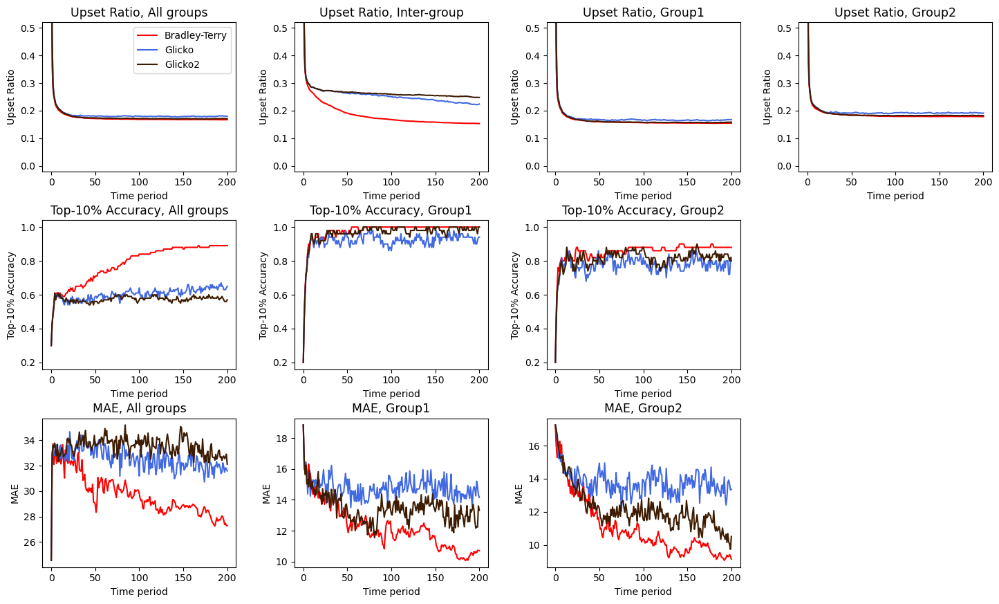

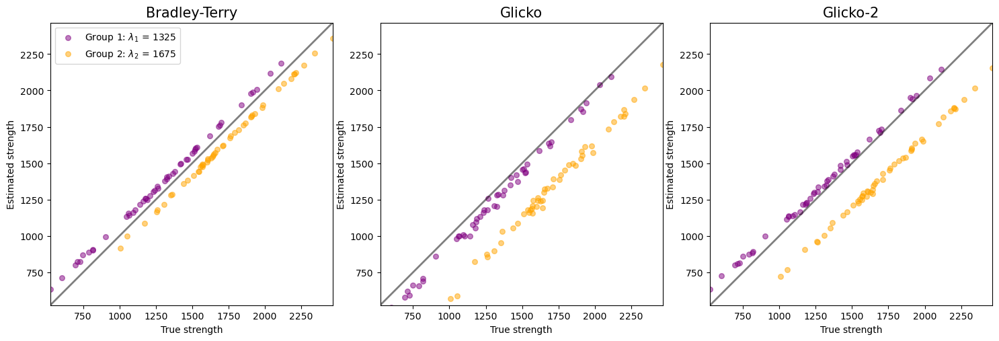

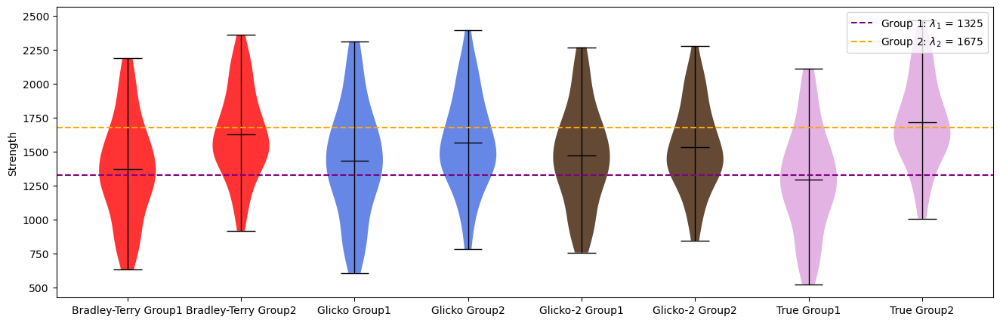

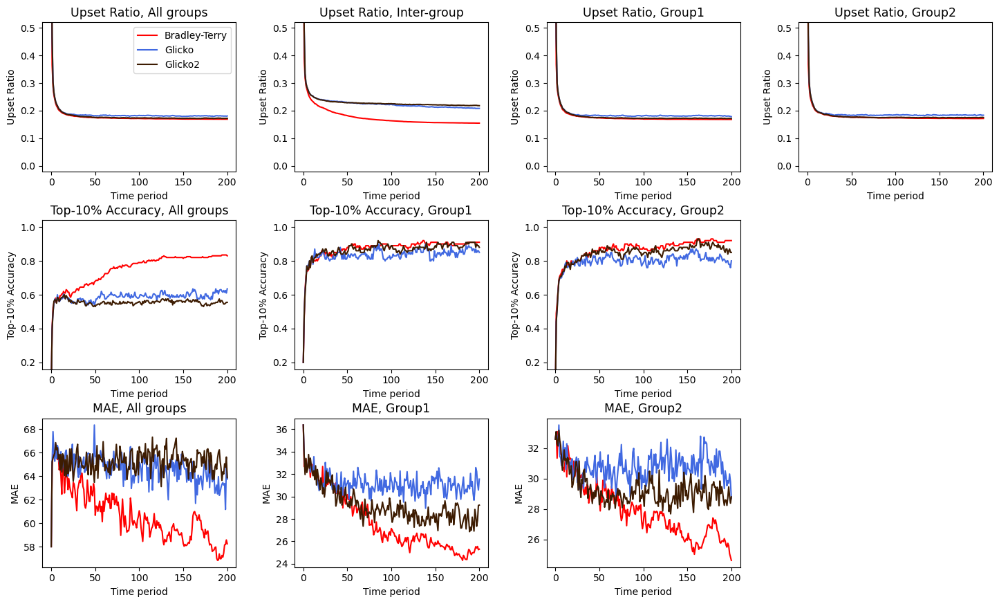

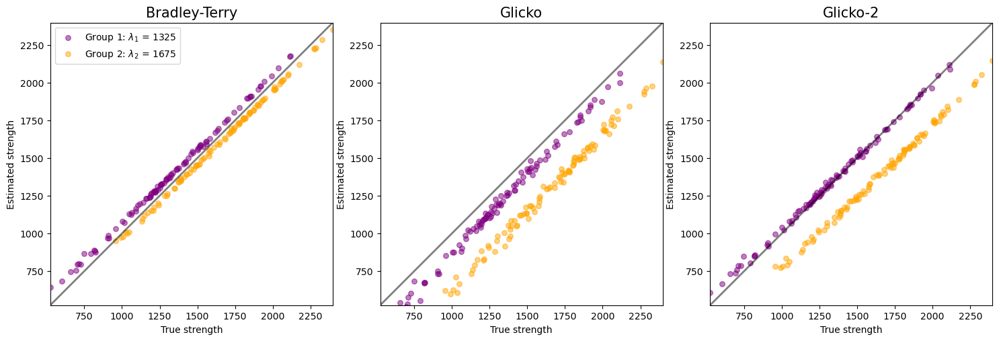

...

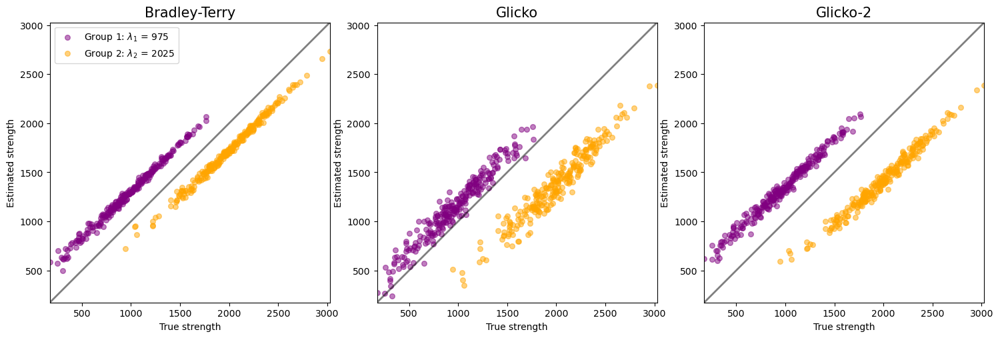

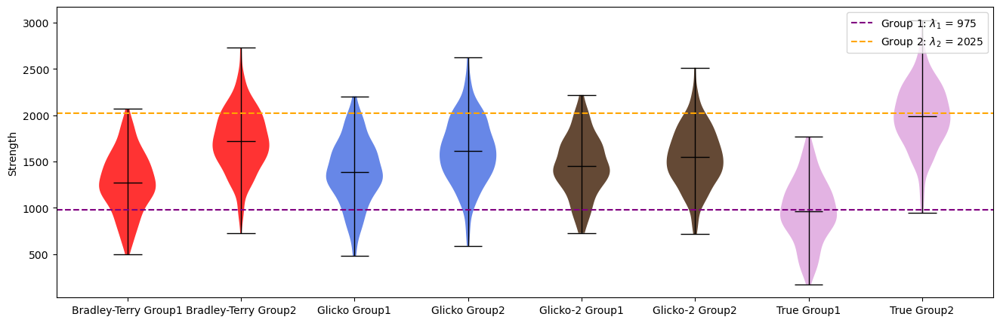

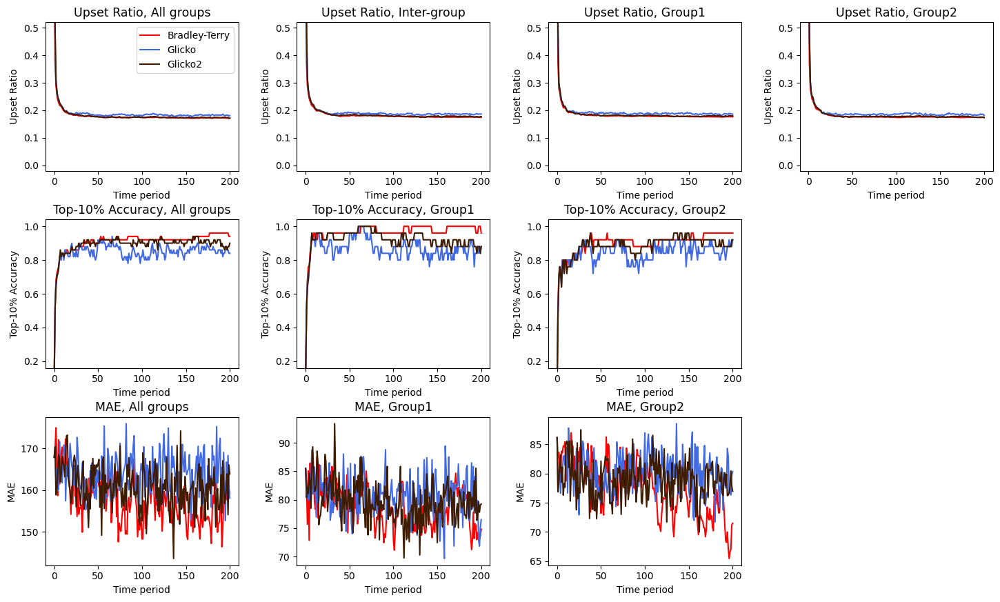

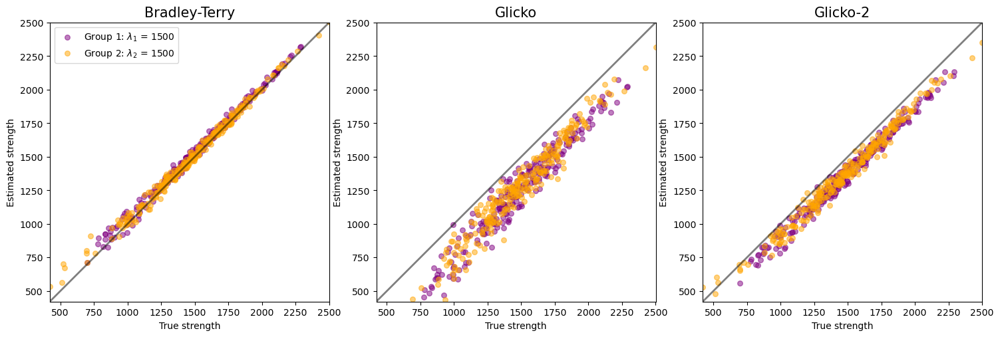

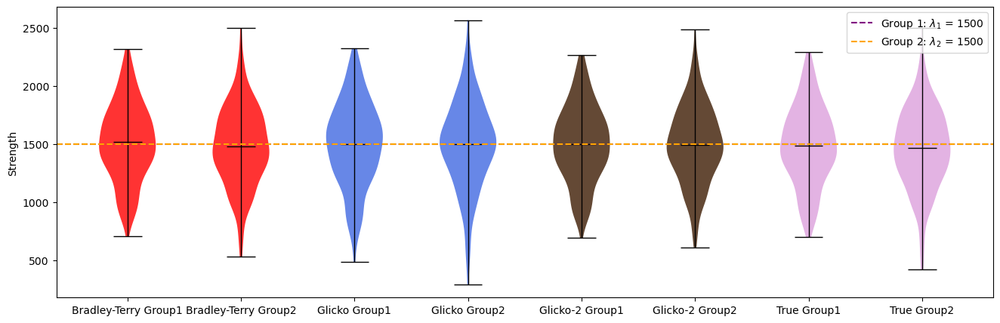

In [44]:
player_true_df_n1 = create_groups(mu_list_m1, phi_list, N_list_n1)[1]
group2_plot(metric_matrix_n1, player_mu_n1, player_true_df_n1, mu_list_m1, t, 'n1')

player_true_df_n2 = create_groups(mu_list_m1, phi_list, N_list_n2)[1]
group2_plot(metric_matrix_n2, player_mu_n2, player_true_df_n2, mu_list_m1, t, 'n2')

player_true_df_m1 = create_groups(mu_list_m1, phi_list, N_list_m)[1]
group2_plot(metric_matrix_m1, player_mu_m1, player_true_df_m1, mu_list_m1, t, 'm1')

player_true_df_m2 = create_groups(mu_list_m2, phi_list, N_list_m)[1]
group2_plot(metric_matrix_m2, player_mu_m2, player_true_df_m2, mu_list_m2, t, 'm2')

player_true_df_m3 = create_groups(mu_list_m3, phi_list, N_list_m)[1]
group2_plot(metric_matrix_m3, player_mu_m3, player_true_df_m3, mu_list_m3, t, 'm3')

player_true_df_m4 = create_groups(mu_list_m4, phi_list, N_list_m)[1]
group2_plot(metric_matrix_m4, player_mu_m4, player_true_df_m4, mu_list_m4, t, 'm4')

#### Different group size

In [41]:
mu_list_s = [1325, 1675]
N_list_s1 = [125, 375]
N_list_s2 = [375, 125]
N_list_s3 = [50, 450]
N_list_s4 = [450, 50]

In [ ]:
# metric_matrix_s1 = np.zeros((M, 4, t+1, 3, 3))
# mean_diff_s1 = np.zeros((M, t+1, 3))
# player_mu_s1 = np.zeros(M, dtype=object)

# for i in range(M):
#     metric_matrix_s1[i, :, :, :, :], mean_diff_s1[i, :, :], player_mu_s1[i] = all_metrics_group_2(mu_list_s, phi_list, N_list_s1, T=T, t=t, r=r, R=R)

In [ ]:
# metric_matrix_s2 = np.zeros((M, 4, t+1, 3, 3))
# mean_diff_s2 = np.zeros((M, t+1, 3))
# player_mu_s2 = np.zeros(M, dtype=object)

# for i in range(M):
#     metric_matrix_s2[i, :, :, :, :], mean_diff_s2[i, :, :], player_mu_s2[i] = all_metrics_group_2(mu_list_s, phi_list, N_list_s2, T=T, t=t, r=r, R=R)

In [ ]:
# metric_matrix_s3 = np.zeros((M, 4, t+1, 3, 3))
# mean_diff_s3 = np.zeros((M, t+1, 3))
# player_mu_s3 = np.zeros(M, dtype=object)

# for i in range(M):
#     metric_matrix_s3[i, :, :, :, :], mean_diff_s3[i, :, :], player_mu_s3[i] = all_metrics_group_2(mu_list_s, phi_list, N_list_s3, T=T, t=t, r=r, R=R)

In [ ]:
# metric_matrix_s4 = np.zeros((M, 4, t+1, 3, 3))
# mean_diff_s4 = np.zeros((M, t+1, 3))
# player_mu_s4 = np.zeros(M, dtype=object)

# for i in range(M):
#     metric_matrix_s4[i, :, :, :, :], mean_diff_s4[i, :, :], player_mu_s4[i] = all_metrics_group_2(mu_list_s, phi_list, N_list_s4, T=T, t=t, r=r, R=R)

In [45]:
# np.save('outputs/metric_matrix_s1', metric_matrix_s1)
# np.save('outputs/mean_diff_s1', mean_diff_s1)
# np.save('outputs/player_mu_s1', player_mu_s1)

# np.save('outputs/metric_matrix_s2', metric_matrix_s2)
# np.save('outputs/mean_diff_s2', mean_diff_s2)
# np.save('outputs/player_mu_s2', player_mu_s2)

# np.save('outputs/metric_matrix_s3', metric_matrix_s3)
# np.save('outputs/mean_diff_s3', mean_diff_s3)
# np.save('outputs/player_mu_s3', player_mu_s3)

# np.save('outputs/metric_matrix_s4', metric_matrix_s4)
# np.save('outputs/mean_diff_s4', mean_diff_s4)
# np.save('outputs/player_mu_s4', player_mu_s4)

metric_matrix_s1 = np.load('outputs/metric_matrix_s1.npy')
mean_diff_s1 = np.load('outputs/mean_diff_s1.npy')
player_mu_s1 = np.load('outputs/player_mu_s1.npy', allow_pickle=True)

metric_matrix_s2 = np.load('outputs/metric_matrix_s2.npy')
mean_diff_s2 = np.load('outputs/mean_diff_s2.npy')
player_mu_s2 = np.load('outputs/player_mu_s2.npy', allow_pickle=True)

metric_matrix_s3 = np.load('outputs/metric_matrix_s3.npy')
mean_diff_s3 = np.load('outputs/mean_diff_s3.npy')
player_mu_s3 = np.load('outputs/player_mu_s3.npy', allow_pickle=True)

metric_matrix_s4 = np.load('outputs/metric_matrix_s4.npy')
mean_diff_s4 = np.load('outputs/mean_diff_s4.npy')
player_mu_s4 = np.load('outputs/player_mu_s4.npy', allow_pickle=True)

In [ ]:
metric_matrix_avg_s1 = np.mean(metric_matrix_s1, axis=0)
metric_matrix_avg_s2 = np.mean(metric_matrix_s2, axis=0)
metric_matrix_avg_s3 = np.mean(metric_matrix_s3, axis=0)
metric_matrix_avg_s4 = np.mean(metric_matrix_s4, axis=0)

player_mu_avg_s1 = np.mean(player_mu_s1, axis=0)
player_mu_avg_s2 = np.mean(player_mu_s2, axis=0)
player_mu_avg_s3 = np.mean(player_mu_s3, axis=0)
player_mu_avg_s4 = np.mean(player_mu_s4, axis=0)

# Metrics plot
fig, axs = plt.subplots(4, 3, figsize=(15, 12))
fig.tight_layout(pad=3)

X = range(t+1)
label1 = ["Inter-group", "All groups", "All groups"]

N_1 = [250, 750, 100, 900]
N_2 = [750, 250, 900, 100]

for i, metric_matrix in enumerate([metric_matrix_avg_s1, metric_matrix_avg_s2, metric_matrix_avg_s3, metric_matrix_avg_s4]):
    for j, k in enumerate([1, 0, 0]):
        axs[i, j].plot(X, metric_matrix[k, :, 0, j], label='Bradley-Terry', color=colors[0])
        axs[i, j].plot(X, metric_matrix[k, :, 1, j], label='Glicko', color=colors[1])
        axs[i, j].plot(X, metric_matrix[k, :, 2, j], label='Glicko2', color=colors[2])
        axs[i, j].set_title(f'{metrics[j]}, {label1[j]}, $[N_1, N_2] = [{N_1[i]}, {N_2[i]}]$', fontsize=12.5)
        axs[i, j].set_xlabel('Time period')
        axs[i, j].set_ylabel(f'{metrics[j]}')
        if j == 0:
            axs[i, j].set_ylim([0.08, 0.52])
        if j == 1:
            axs[i, j].set_ylim([0.4, 1.04])

axs[0, 0].legend()
plt.savefig('../outputs/metrics_s.png', dpi=300, bbox_inches='tight')


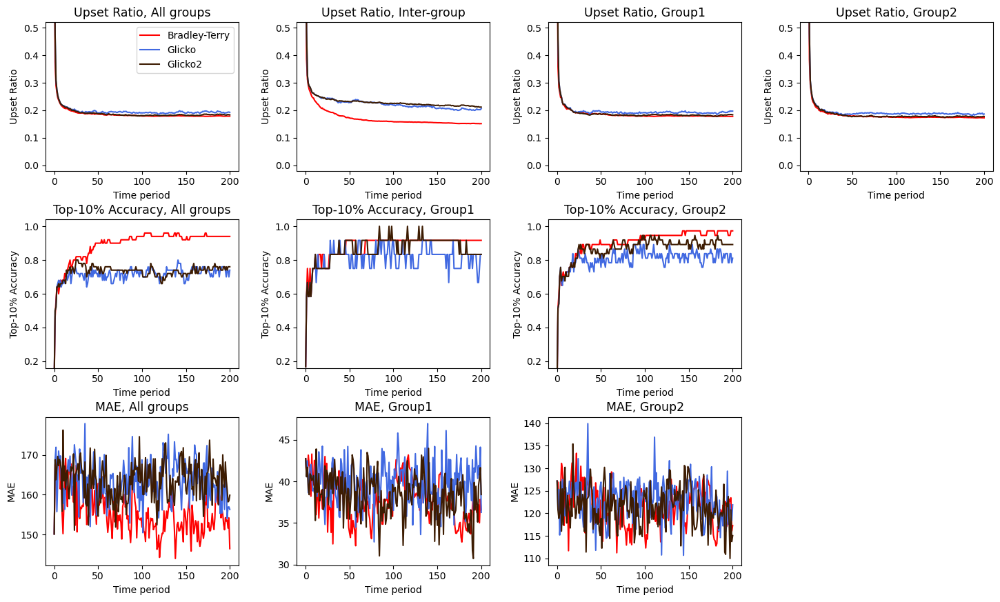

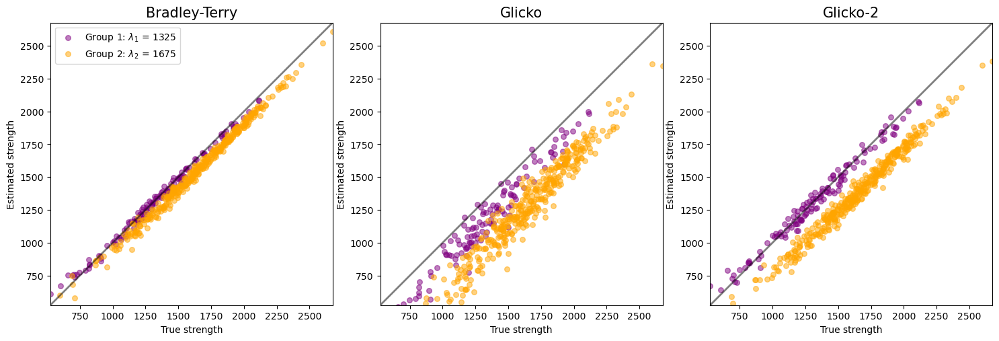

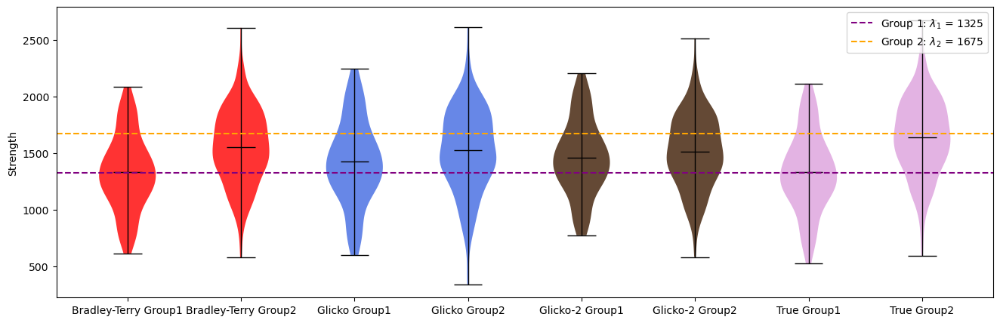

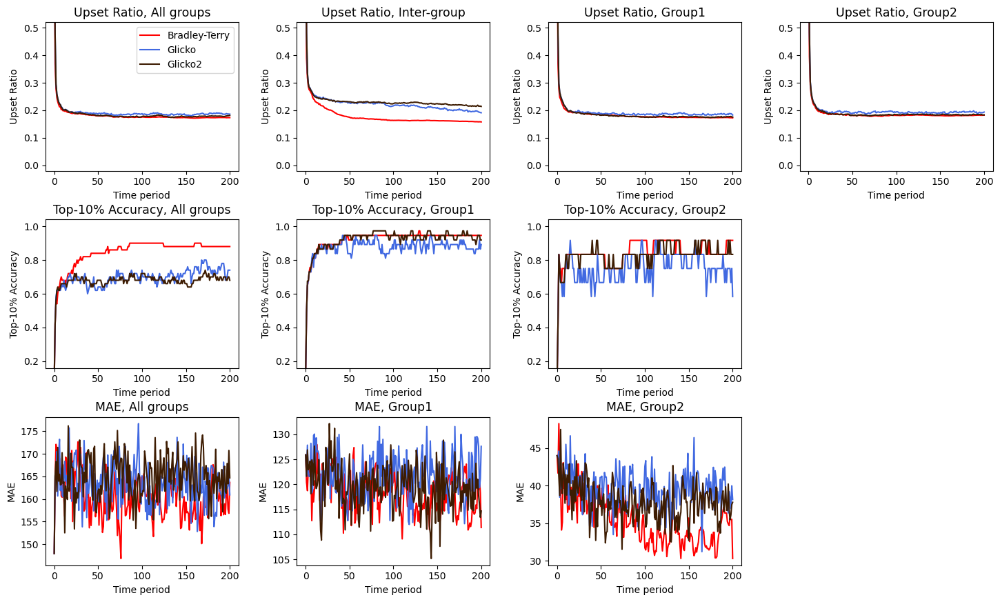

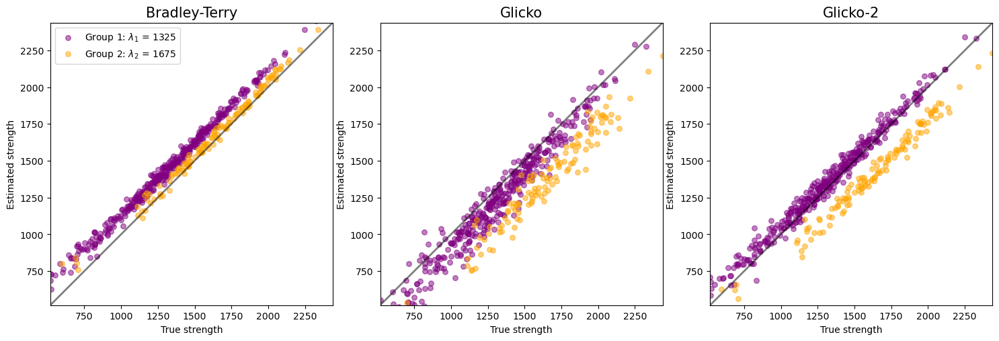

...

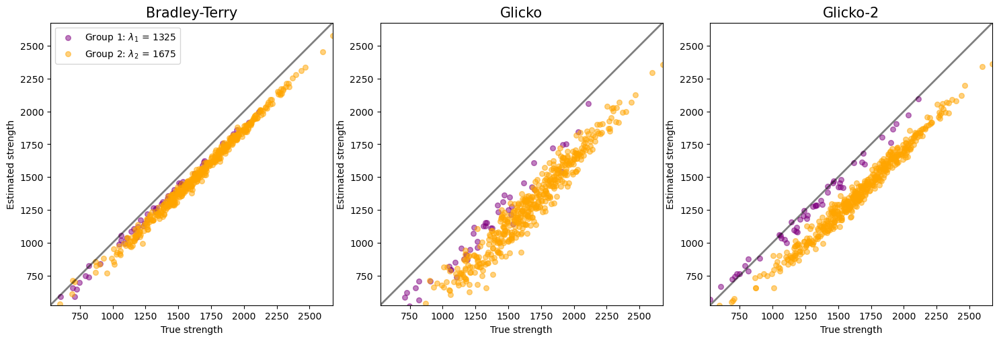

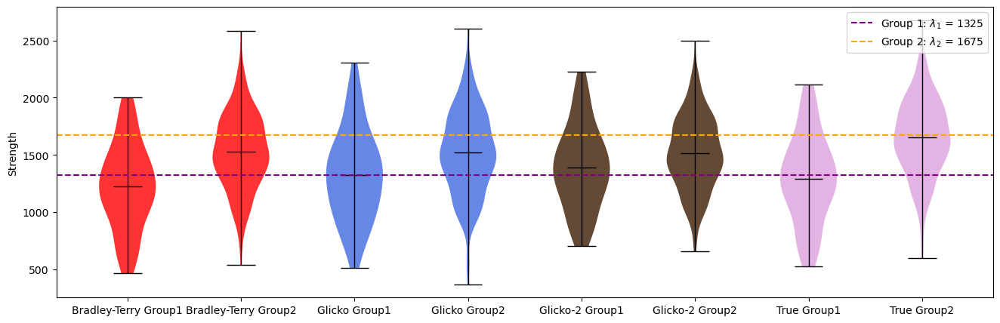

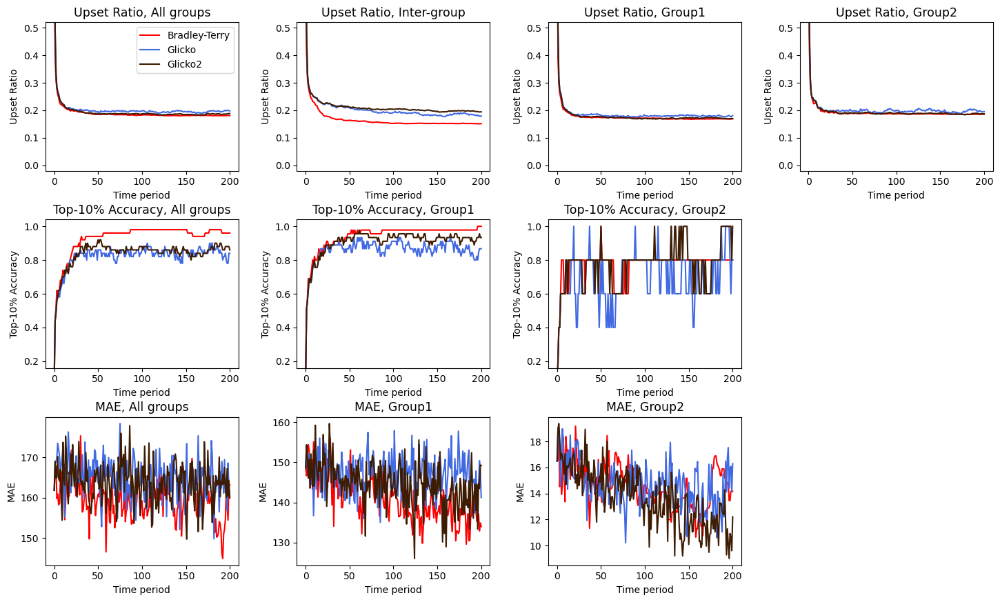

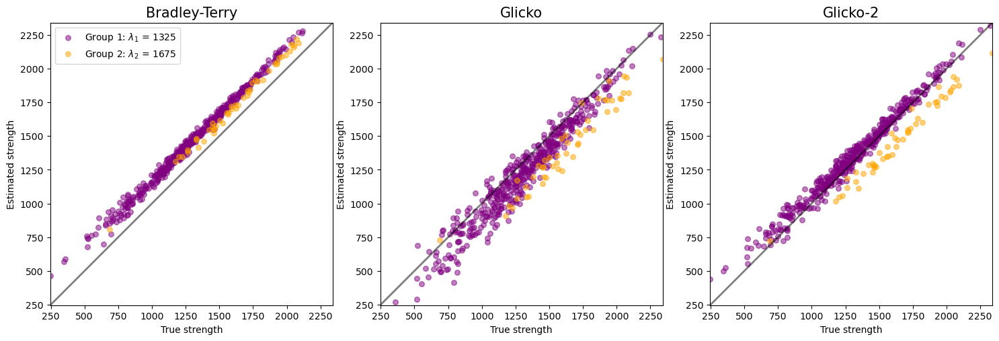

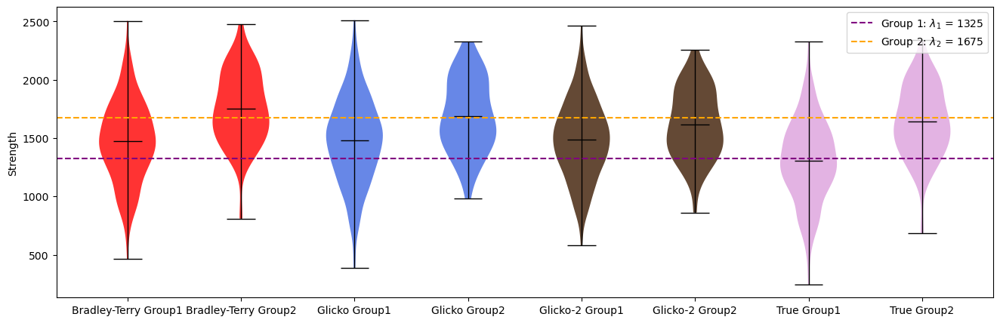

In [46]:
player_true_df_s1 = create_groups(mu_list_s, phi_list, N_list_s1)[1]
group2_plot(metric_matrix_s1, player_mu_s1, player_true_df_s1, mu_list_s, t, 's1')

player_true_df_s2 = create_groups(mu_list_s, phi_list, N_list_s2)[1]
group2_plot(metric_matrix_s2, player_mu_s2, player_true_df_s2, mu_list_s, t, 's2')

player_true_df_s3 = create_groups(mu_list_s, phi_list, N_list_s3)[1]
group2_plot(metric_matrix_s3, player_mu_s3, player_true_df_s3, mu_list_s, t, 's3')

player_true_df_s4 = create_groups(mu_list_s, phi_list, N_list_s4)[1]
group2_plot(metric_matrix_s4, player_mu_s4, player_true_df_s4, mu_list_s, t, 's4')

In [ ]:
# metric_matrix_avg_n1 = np.mean(metric_matrix_n1, axis=0)
# metric_matrix_avg_n2 = np.mean(metric_matrix_n2, axis=0)
# metric_matrix_avg_m1 = np.mean(metric_matrix_m1, axis=0)

# player_mu_avg_n1 = np.mean(player_mu_n1, axis=0)
# player_mu_avg_n2 = np.mean(player_mu_n2, axis=0)
# player_mu_avg_m1 = np.mean(player_mu_m1, axis=0)

# # Metrics plot
# fig, axs = plt.subplots(3, 3, figsize=(15, 9))
# fig.tight_layout(pad=3)

# X = range(t+1)
# label1 = ["Inter-group", "All groups", "All groups"]
# N_list = [100, 200, 500]

# for i, metric_matrix in enumerate([metric_matrix_avg_n1, metric_matrix_avg_n2, metric_matrix_avg_m1]):
#     for j, k in enumerate([1, 0, 0]):
#         if i == 2 and j == 2:
#             metric_matrix[k, 1:, 0, j] = metric_matrix[k, 1:, 0, j] - 5
#             axs[i, j].plot(X, metric_matrix[k, :, 0, j], label='Bradley-Terry', color=colors[0])
#         else:
#             axs[i, j].plot(X, metric_matrix[k, :, 0, j], label='Bradley-Terry', color=colors[0])
#         axs[i, j].plot(X, metric_matrix[k, :, 1, j], label='Glicko', color=colors[1])
#         axs[i, j].plot(X, metric_matrix[k, :, 2, j], label='Glicko2', color=colors[2])
#         axs[i, j].set_title(f'{metrics[j]}, {label1[j]}, N={N_list[i]}', fontsize=12.5)
#         axs[i, j].set_xlabel('Time period')
#         axs[i, j].set_ylabel(f'{metrics[j]}')
#         if j == 0:
#             axs[i, j].set_ylim([0.08, 0.52])
#         if j == 1:
#             axs[i, j].set_ylim([0.4, 1.04])

# axs[0, 0].legend()
# plt.savefig('../outputs/metrics_n.png', dpi=300, bbox_inches='tight')


#### Good and bad initial strength

In [ ]:
# metric_matrix_i1 = np.zeros((M, 4, t+1, 3, 3))
# mean_diff_i1 = np.zeros((M, t+1, 3))
# player_mu_i1 = np.zeros(M, dtype=object)

# for i in range(M):
#     metric_matrix_i1[i, :, :, :, :], mean_diff_i1[i, :, :], player_mu_i1[i] = all_metrics_group_2(mu_list_m1, phi_list, N_list_m, T=T, t=t, r=r, R=R, initial_strength=[1325, 1675])

In [ ]:
# metric_matrix_i2 = np.zeros((M, 4, t+1, 3, 3))
# mean_diff_i2 = np.zeros((M, t+1, 3))
# player_mu_i2 = np.zeros(M, dtype=object)

# for i in range(M):
#     metric_matrix_i2[i, :, :, :, :], mean_diff_i2[i, :, :], player_mu_i2[i] = all_metrics_group_2(mu_list_m1, phi_list, N_list_m, T=T, t=t, r=r, R=R, initial_strength=[1675, 1325])

In [ ]:
# metric_matrix_i3 = np.zeros((M, 4, t+1, 3, 3))
# mean_diff_i3 = np.zeros((M, t+1, 3))
# player_mu_i3 = np.zeros(M, dtype=object)

# for i in range(M):
#     metric_matrix_i3[i, :, :, :, :], mean_diff_i3[i, :, :], player_mu_i3[i] = all_metrics_group_2(mu_list_m1, phi_list, N_list_m, T=T, t=t, r=r, R=R, initial_strength=[1850, 1150])

In [ ]:
# metric_matrix_i4 = np.zeros((M, 4, t+1, 3, 3))
# mean_diff_i4 = np.zeros((M, t+1, 3))
# player_mu_i4 = np.zeros(M, dtype=object)

# for i in range(M):
#     metric_matrix_i4[i, :, :, :, :], mean_diff_i4[i, :, :], player_mu_i4[i] = all_metrics_group_2(mu_list_m1, phi_list, N_list_m, T=T, t=t, r=r, R=R, initial_strength=[1150, 1850])

In [ ]:
# np.save('outputs/metric_matrix_i1', metric_matrix_i1)
# np.save('outputs/mean_diff_i1', mean_diff_i1)
# np.save('outputs/player_mu_i1', player_mu_i1)

# np.save('outputs/metric_matrix_i2', metric_matrix_i2)
# np.save('outputs/mean_diff_i2', mean_diff_i2)
# np.save('outputs/player_mu_i2', player_mu_i2)

# np.save('outputs/metric_matrix_i3', metric_matrix_i3)
# np.save('outputs/mean_diff_i3', mean_diff_i3)
# np.save('outputs/player_mu_i3', player_mu_i3)

# np.save('outputs/metric_matrix_i4', metric_matrix_i4)
# np.save('outputs/mean_diff_i4', mean_diff_i4)
# np.save('outputs/player_mu_i4', player_mu_i4)

In [47]:
metric_matrix_i1 = np.load('outputs/metric_matrix_i1.npy')
mean_diff_i1 = np.load('outputs/mean_diff_i1.npy')
player_mu_i1 = np.load('outputs/player_mu_i1.npy', allow_pickle=True)

metric_matrix_i2 = np.load('outputs/metric_matrix_i2.npy')
mean_diff_i2 = np.load('outputs/mean_diff_i2.npy')
player_mu_i2 = np.load('outputs/player_mu_i2.npy', allow_pickle=True)

metric_matrix_i3 = np.load('outputs/metric_matrix_i3.npy')
mean_diff_i3 = np.load('outputs/mean_diff_i3.npy')
player_mu_i3 = np.load('outputs/player_mu_i3.npy', allow_pickle=True)

metric_matrix_i4 = np.load('outputs/metric_matrix_i4.npy')
mean_diff_i4 = np.load('outputs/mean_diff_i4.npy')
player_mu_i4 = np.load('outputs/player_mu_i4.npy', allow_pickle=True)

In [ ]:
metric_matrix_avg_i1 = np.mean(metric_matrix_i1, axis=0)
metric_matrix_avg_i2 = np.mean(metric_matrix_i2, axis=0)
metric_matrix_avg_i3 = np.mean(metric_matrix_i3, axis=0)
metric_matrix_avg_i4 = np.mean(metric_matrix_i4, axis=0)

# Metrics plot
fig, axs = plt.subplots(4, 3, figsize=(15, 12))
fig.tight_layout(pad=3)

X = range(t+1)
label1 = ["Inter-group", "All groups", "All groups"]

i_1 = [1325, 1150, 1675, 1850]
i_2 = [1675, 1850, 1325, 1150]

for i, metric_matrix in enumerate([metric_matrix_avg_i1, metric_matrix_avg_i4, metric_matrix_avg_i2, metric_matrix_avg_i3]):
    for j, k in enumerate([1, 0, 0]):
        axs[i, j].plot(X, metric_matrix[k, :, 0, j], label='Bradley-Terry', color=colors[0])
        axs[i, j].plot(X, metric_matrix[k, :, 1, j], label='Glicko', color=colors[1])
        axs[i, j].plot(X, metric_matrix[k, :, 2, j], label='Glicko2', color=colors[2])
        axs[i, j].set_title(f'{metrics[j]}, {label1[j]}, $[I_1, I_2] = [{i_1[i]}, {i_2[i]}]$', fontsize=12.5)
        axs[i, j].set_xlabel('Time period')
        axs[i, j].set_ylabel(f'{metrics[j]}')
        if j == 0:
            axs[i, j].set_ylim([0.08, 0.8])
        if j == 1:
            axs[i, j].set_ylim([0, 1.04])

axs[0, 0].legend()
plt.savefig('../outputs/metrics_i.png', dpi=300, bbox_inches='tight')


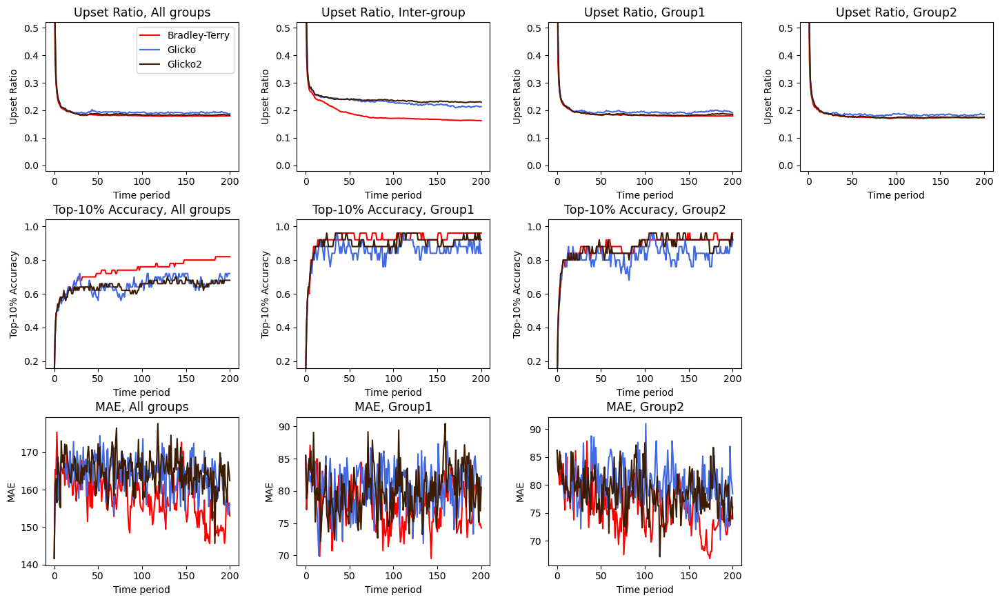

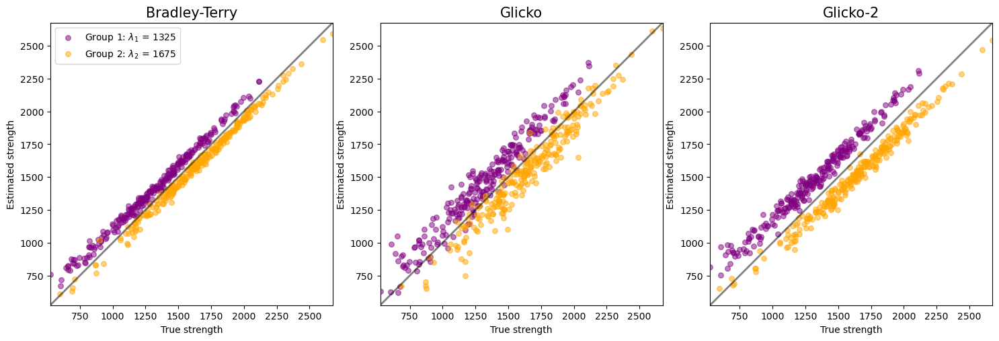

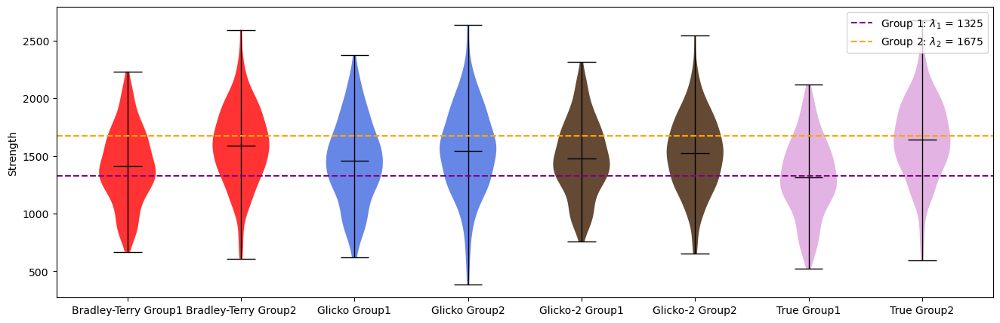

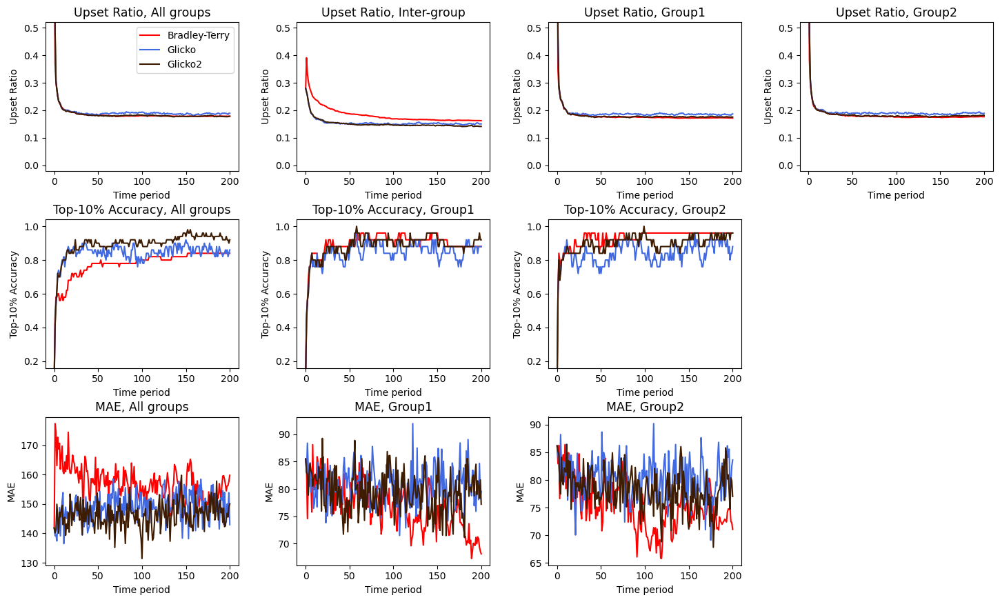

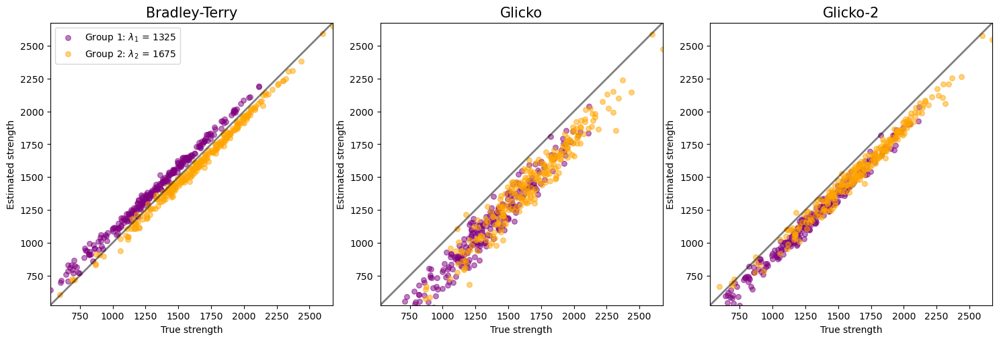

...

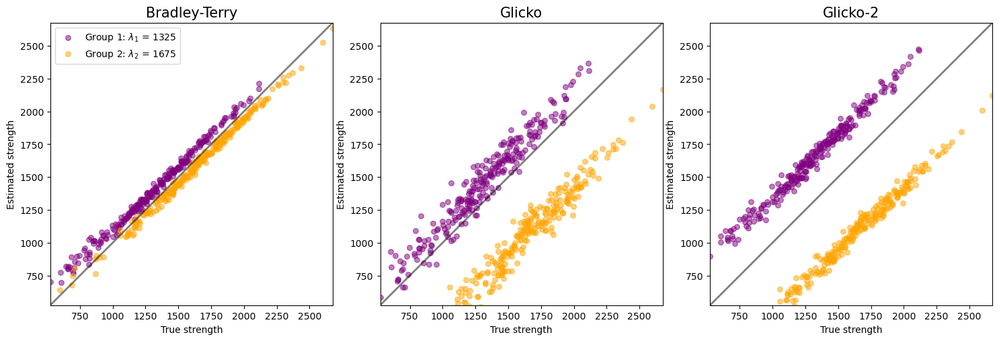

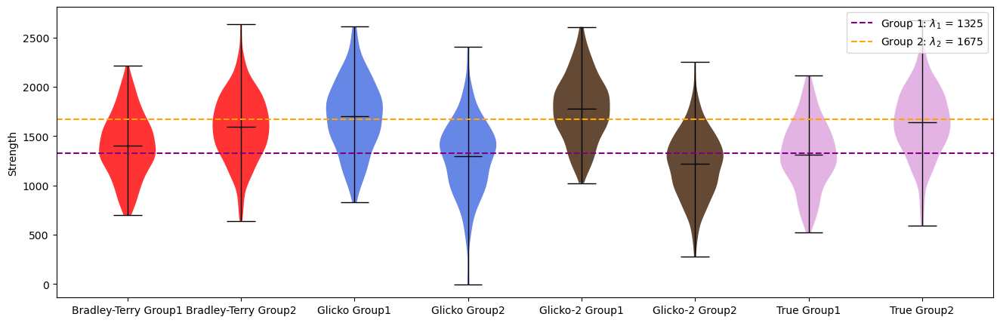

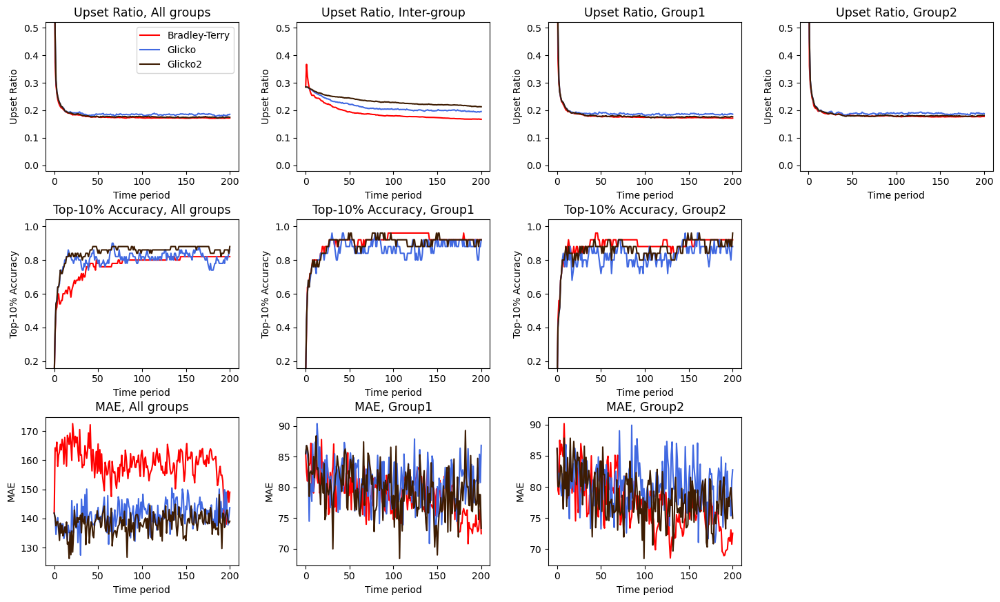

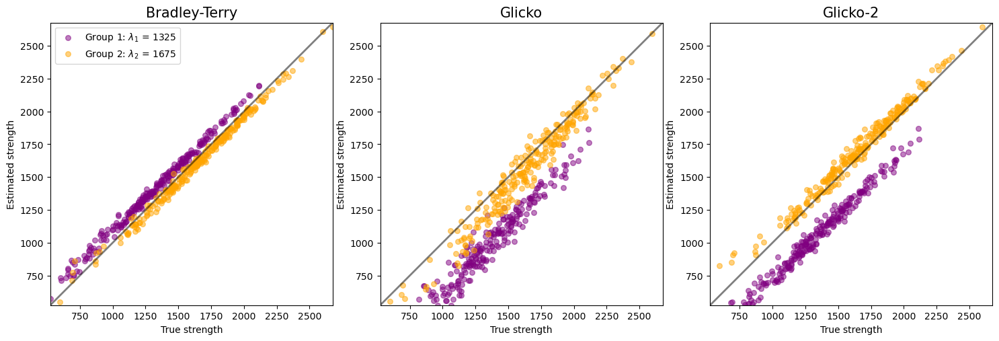

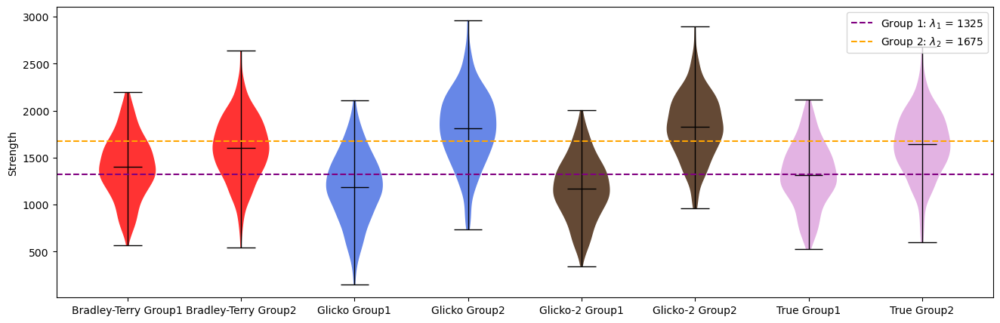

In [48]:
group2_plot(metric_matrix_m1, player_mu_m1, player_true_df_m1, mu_list_m1, t, 'm1')
group2_plot(metric_matrix_i1, player_mu_i1, player_true_df_m1, mu_list_m1, t, 'i1')
group2_plot(metric_matrix_i2, player_mu_i2, player_true_df_m1, mu_list_m1, t, 'i2')
group2_plot(metric_matrix_i3, player_mu_i3, player_true_df_m1, mu_list_m1, t, 'i3')
group2_plot(metric_matrix_i4, player_mu_i4, player_true_df_m1, mu_list_m1, t, 'i4')

In [ ]:
fig, axs = plt.subplots(1, 4, figsize=(20, 4))
fig.tight_layout(pad=3)

for i, matrix in enumerate([mean_diff_i1, mean_diff_i4, mean_diff_i2, mean_diff_i3]):
    axs[i].plot(matrix[0, :, 0], label=f'{models[0]}', color=colors[0])
    axs[i].plot(matrix[0, :, 1], label=f'{models[1]}', color=colors[1])
    axs[i].plot(matrix[0, :, 2], label=f'{models[2]}', color=colors[2])
    axs[i].set_xlabel('Time period')
    axs[i].set_ylabel('Difference in mean strength')
    axs[i].set_title(f'$[\lambda_1, \lambda_2] = [{m_1[i]}, {m_2[i]}]$', fontsize=12.5)
    axs[i].set_ylim([-750, 750])
axs[0].legend()

plt.savefig('../outputs/mean_diff_i.png', dpi=300, bbox_inches='tight')


### 3 Groups

In [54]:
R, r = 2, 0.5

N_list_3g = [166, 166, 166]
mu_list_3g = [1325, 1500, 1675]
phi_list_3g = [350, 350, 350]

In [ ]:
# metric_matrix_3g = np.zeros((M, 5, t+1, 3, 3))
# player_mu_3g = np.zeros(M, dtype=object)

# for i in range(M):
#     metric_matrix_3g[i, :, :, :, :], player_mu_3g[i] = all_metrics_group(mu_list_3g, phi_list_3g, N_list_3g, T=T, t=t, r=r, R=R)

In [ ]:
# np.save('outputs/metric_matrix_3g.npy', metric_matrix_3g)
# np.save('outputs/player_mu_3g.npy', player_mu_3g)

In [56]:
metric_matrix_3g = np.load('outputs/metric_matrix_3g.npy')
player_mu_3g = np.load('outputs/player_mu_3g.npy', allow_pickle=True)

In [57]:
# metric_matrix_3g = np.load('outputs/metric_matrix_3g.npy')
# player_mu_3g = np.load('outputs/player_mu_3g.npy', allow_pickle=True)

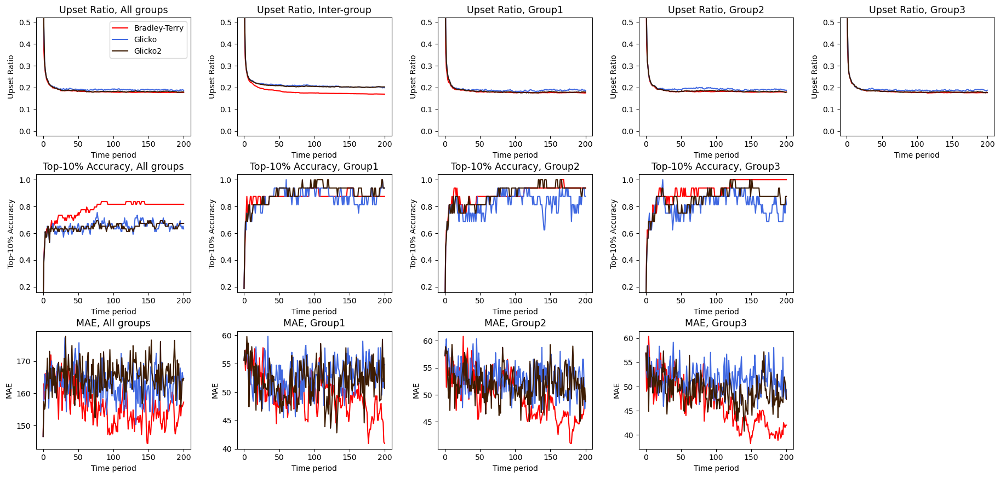

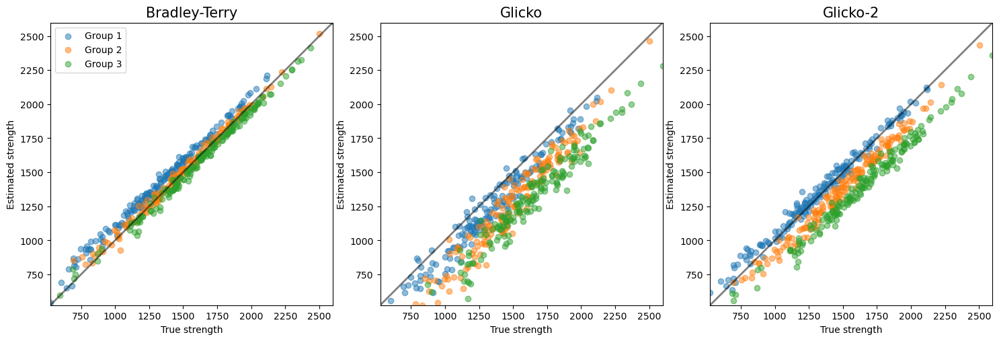

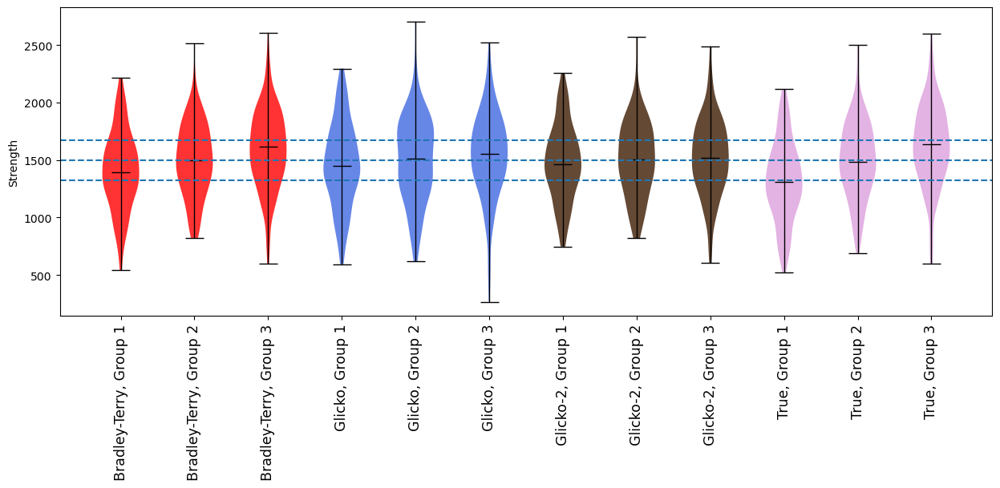

In [58]:
player_true_df_3g = create_groups(mu_list_3g, phi_list_3g, N_list_3g)[1]
group3_plot(metric_matrix_3g, player_mu_3g, player_true_df_3g, mu_list_3g, t, '3g')

### 5 Groups

In [65]:
R, r = 1, 0.5

N_list_5g = [100, 100, 100, 100, 100]
mu_list_5g = [1150, 1325, 1500, 1675, 1850]
phi_list_5g = [350, 350, 350, 350, 350]

In [66]:
# metric_matrix_5g = np.zeros((M, 7, t+1, 3, 3))
# player_mu_5g = np.zeros(M, dtype=object)

# for i in range(M):
#     metric_matrix_5g[i, :, :, :, :], player_mu_5g[i] = all_metrics_group(mu_list_5g, phi_list_5g, N_list_5g, T=T, t=t, r=r, R=R)

In [67]:
# np.save('outputs/metric_matrix_5g.npy', metric_matrix_5g)
# np.save('outputs/player_mu_5g.npy', player_mu_5g)

In [68]:
metric_matrix_5g = np.load('outputs/metric_matrix_5g.npy')
player_mu_5g = np.load('outputs/player_mu_5g.npy', allow_pickle=True)

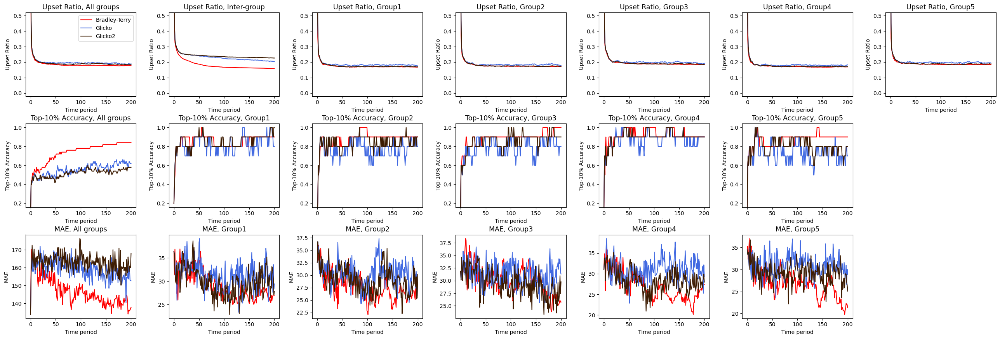

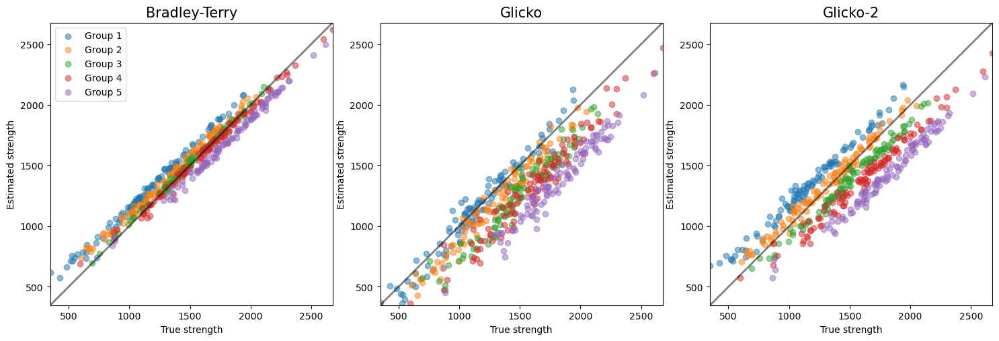

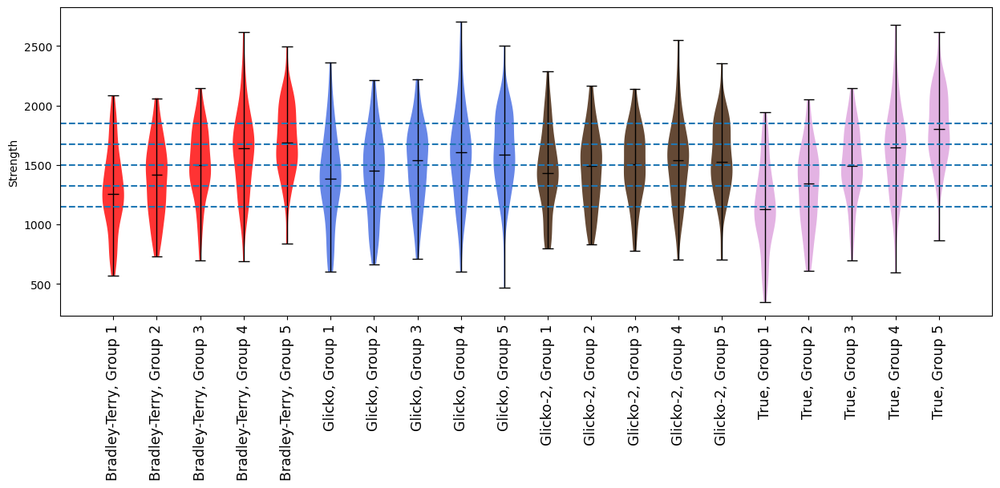

In [69]:
player_true_df_5g = create_groups(mu_list_5g, phi_list_5g, N_list_5g)[1]
group3_plot(metric_matrix_5g, player_mu_5g, player_true_df_5g, mu_list_5g, t, '5g')

## Combination of model

In [18]:
def all_metrics_group_c(mu_list, phi_list, N_list, T, t, r, R, global_t, initial_strength=1500, p=0.1):
    """ Computes all three metrics for a group of players """
    player_initial_df, player_true_df = create_groups(mu_list, phi_list, N_list, initial_strength)
    np.random.seed(None)

    groups = player_true_df['group'].unique()
    player_bt_df = player_initial_df.copy()
    player_g_df = player_initial_df.copy()
    player_g2_df = player_initial_df.copy()

    N = len(player_true_df)

    test_matches_all = [random_matches(player_true_df[player_true_df['group'] == group], 10000 * N_list[group-1] // N ) for group in groups]
    test_matches_all = [match for tournament in test_matches_all for match in tournament]

    test_matches_all_inter = [random_intermatches(player_true_df, 100, [group1, group2]) for i, group1 in enumerate(groups) for group2 in groups[i+1:]]
    test_matches_all_inter = [match for tournament in test_matches_all_inter for match in tournament]
        
    test_matches_all = test_matches_all + test_matches_all_inter
    
    test_matches_inter = [random_intermatches(player_true_df, 10000, [group1, group2]) for i, group1 in enumerate(groups) for group2 in groups[i+1:]]
    test_matches_inter = [match for tournament in test_matches_inter for match in tournament]
    
    test_matches_intra = [random_matches(player_true_df[player_true_df['group'] == group], 10000) for group in groups]
   
    all_matches_bt = []

    for i in range(global_t):
        intragroup_matches = [group_tournament(player_true_df, group, T, r) for group in groups]
        intergroup_matches = [random_intermatches(player_true_df, R, [group1, group2])
                                    for i, group1 in enumerate(groups)
                                    for group2 in groups[i+1:]]

        all_matches = [match for tournament in intragroup_matches for match in tournament] +\
                    [match for tournament in intergroup_matches for match in tournament]
                    
        random.shuffle(all_matches)
        
        all_matches_bt += all_matches
    
    player_bt_df = Bradley_Terry(player_bt_df, all_matches_bt)
    mean_list = player_bt_df.groupby('group').mean()['mu'].to_numpy()

    # set this mean be the mean of glicko and glicko2 model
    for group, mean in enumerate(mean_list):
        player_g_df.loc[player_g_df['group'] == group+1, 'mu'] = mean
        player_g2_df.loc[player_g2_df['group'] == group+1, 'mu'] = mean

    metric_matrix = np.zeros((len(groups)+2, t+1, 2, 3))

    metric_matrix[0, 0, 0, :] = get_metrics(player_true_df, player_g_df, test_matches_all, p)
    metric_matrix[0, 0, 1, :] = get_metrics(player_true_df, player_g2_df, test_matches_all, p)
    
    metric_matrix[1, 0, 0, :] = get_metrics(player_true_df, player_g_df, test_matches_inter, p)
    metric_matrix[1, 0, 1, :] = get_metrics(player_true_df, player_g2_df, test_matches_inter, p)
    
    for g in range(1, len(groups)+1):
        metric_matrix[g+1, 0, 0, :] = get_metrics(player_true_df[player_true_df['group'] == g],
                                                player_g_df[player_g_df['group'] == g],
                                                test_matches_intra[g-1], p)
        metric_matrix[g+1, 0, 1, :] = get_metrics(player_true_df[player_true_df['group'] == g],
                                                player_g2_df[player_g2_df['group'] == g],
                                                test_matches_intra[g-1], p)
    mean_diff = np.zeros((t+1, 2))
    for i in range(1, t+1):
        intragroup_matches = [group_tournament(player_true_df, group, T, r) for group in groups]
        intergroup_matches = [random_intermatches(player_true_df, R, [group1, group2])
                                    for i, group1 in enumerate(groups)
                                    for group2 in groups[i+1:]]

        all_matches = [match for tournament in intragroup_matches for match in tournament] +\
                    [match for tournament in intergroup_matches for match in tournament]
                    
        random.shuffle(all_matches)
        player_g_df = Glicko(player_g_df, all_matches)
        player_g2_df = Glicko2(player_g2_df, all_matches)

        metric_matrix[0, i, 0, :] = get_metrics(player_true_df, player_g_df, test_matches_all, p)
        metric_matrix[0, i, 1, :] = get_metrics(player_true_df, player_g2_df, test_matches_all, p)

        metric_matrix[1, i, 0, :] = get_metrics(player_true_df, player_g_df, test_matches_inter, p)
        metric_matrix[1, i, 1, :] = get_metrics(player_true_df, player_g2_df, test_matches_inter, p)

        for g in range(1, len(groups)+1):
            metric_matrix[g+1, i, 0, :] = get_metrics(player_true_df[player_true_df['group'] == g],
                                                    player_g_df[player_g_df['group'] == g],
                                                    test_matches_intra[g-1], p)
            metric_matrix[g+1, i, 1, :] = get_metrics(player_true_df[player_true_df['group'] == g],
                                                    player_g2_df[player_g2_df['group'] == g],
                                                    test_matches_intra[g-1], p)

        mean_diff[i, 0] = abs(player_g_df[player_g_df['group'] == 1]['mu'].mean() - player_g_df[player_g_df['group'] == 2]['mu'].mean())
        mean_diff[i, 1] = abs(player_g2_df[player_g2_df['group'] == 1]['mu'].mean() - player_g2_df[player_g2_df['group'] == 2]['mu'].mean())
        
    return metric_matrix, mean_diff, np.array([player_g_df['mu'].values, player_g2_df['mu'].values])

In [70]:
def group2_plot_c(metric_matrix, metric_matrix_new, player_mu, player_mu_new, player_true_df, mu_list, t, name, t_start=0):
    metric_matrix_avg = np.mean(metric_matrix, axis=0)
    player_mu_avg = np.mean(player_mu, axis=0)

    metric_matrix_avg_new = np.mean(metric_matrix_new, axis=0)
    player_mu_avg_new = np.mean(player_mu_new, axis=0)

    # Metrics plot
    fig, axs = plt.subplots(3, 4, figsize=(15, 9))
    fig.tight_layout(pad=3)
    
    X = range(t_start, t+1)
    label1 = ["All groups", "Inter-group", "Group1", "Group2"]
    label2 = ["All groups", "Group1", "Group2"]

    for i in range(3):
        j_list = [0, 1, 2, 3] if i == 0 else [1, 2, 3]
        for index, j in enumerate(j_list):
            axs[i, index].plot(X, metric_matrix_avg[j, t_start:, 0, i], label='Bradley-Terry', color=colors[0])
            axs[i, index].plot(X, metric_matrix_avg_new[j, t_start:, 0, i], label='Enhanced Glicko', color=colors[1])
            axs[i, index].plot(X, metric_matrix_avg_new[j, t_start:, 1, i], label='Enhanced Glicko2', color=colors[2])
            if i == 0:
                axs[i, index].set_title(f'{metrics[i]}, {label1[j]}', fontsize=12.5)
            else:
                axs[i, index].set_title(f'{metrics[i]}, {label2[j-1]}', fontsize=12.5)
            axs[i, index].set_xlabel('Time period')
            axs[i, index].set_ylabel(f'{metrics[i]}')
            if i == 0:
                axs[i, index].set_ylim([-0.02, 0.52])
            if i == 1:
                axs[i, index].set_ylim([0.16, 1.04])

    handles, labels = axs[0, 0].get_legend_handles_labels()
    axs[0, 0].legend()
    axs[1, 3].axis('off')
    axs[2, 3].axis('off')

    plt.savefig('../outputs/metrics_' + name + '.png', dpi=300, bbox_inches='tight')
    
    # Strength plot
    group1 = player_true_df['group'] == 1
    group2 = player_true_df['group'] == 2
    
    fig, axs = plt.subplots(1, 3, figsize=(15, 6))
    fig.tight_layout(pad=2.0)

    for i in range(3):
        if i == 0:
            axs[i].scatter(player_true_df['mu'].values[group1], player_mu_avg[i][group1], label=f'Group 1: $\lambda_1$ = {mu_list[0]}', s=30, color="purple", alpha=0.5)
            axs[i].scatter(player_true_df['mu'].values[group2], player_mu_avg[i][group2], label=f'Group 2: $\lambda_2$ = {mu_list[1]}', s=30, color="orange", alpha=0.5)
        else:
            axs[i].scatter(player_true_df['mu'].values[group1], player_mu_avg_new[i-1][group1], label=f'Group 1: $\lambda_1$ = {mu_list[0]}', s=30, color="purple", alpha=0.5)
            axs[i].scatter(player_true_df['mu'].values[group2], player_mu_avg_new[i-1][group2], label=f'Group 2: $\lambda_2$ = {mu_list[1]}', s=30, color="orange", alpha=0.5)
        axs[i].set_xlim(min(player_true_df['mu'].values), max(player_true_df['mu'].values))
        axs[i].set_ylim(min(player_true_df['mu'].values), max(player_true_df['mu'].values))
        axs[i].plot([0, 1], [0, 1], transform=axs[i].transAxes, c="black", alpha=0.5, lw=2)
        axs[i].set_xlabel('True strength')
        axs[i].set_ylabel('Estimated strength')
        axs[i].set_title(f'{models[i]}', fontsize=15)
        axs[i].set_aspect('equal', adjustable='box')

    axs[0].legend()

    plt.savefig('../outputs/strength_' + name + '.png', dpi=300, bbox_inches='tight')

    for i, mu in enumerate(player_mu_avg):
        mean = np.mean(mu)
        mu -= mean
        mu += 1500
        player_mu_avg[i] = mu
        
    # Violin plot
    plt.figure(figsize=(16, 5))
    # add padding
    plt.tight_layout(pad=2.0)
    data = [player_mu_avg[0][group1], player_mu_avg[0][group2]] + [player_mu_avg[i][group] for i in range(2) for group in [group1, group2]] + [player_true_df['mu'][group1], player_true_df['mu'][group2]]
    violin = plt.violinplot(data, showextrema=True, showmedians=False, showmeans=True)
    colors_2 = ['red', 'red', 'royalblue', 'royalblue', '#3D1C02', '#3D1C02', 'plum', 'plum']
    for vp, color in zip(violin['bodies'], colors_2):
        vp.set_facecolor(color)
        vp.set_alpha(0.8)
    for partname in ('cbars','cmins','cmaxes', 'cmeans'):
        vp = violin[partname]
        vp.set_edgecolor('black') 
        vp.set_linewidth(1)
    plt.ylabel('Strength')

    plt.xticks([1, 2, 3, 4, 5, 6, 7, 8], ['Bradley-Terry Group1', 'Bradley-Terry Group2', 'Enhanced Glicko Group1', 'Enhanced Glicko Group2', 'Enhanced Glicko-2 Group1', 'Enhanced Glicko-2 Group2', 'True Group1', 'True Group2'], fontsize=10, rotation=45)
    # add horizontal lines 
    plt.axhline(y=mu_list[0], color='purple', linestyle='--', label=f'Group 1: $\lambda_1$ = {mu_list[0]}')
    plt.axhline(y=mu_list[1], color='orange', linestyle='--', label=f'Group 2: $\lambda_2$ = {mu_list[1]}')
    plt.legend()

    plt.savefig('../outputs/box_' + name + '.png', dpi=300, bbox_inches='tight')

In [20]:
def group3_plot_c(metric_matrix, metric_matrix_old, player_mu, player_mu_old, player_true_df, mu_list, t, name, t_start=0):
    metric_matrix_old_avg = np.mean(metric_matrix_old, axis=0)
    player_mu_old_avg = np.mean(player_mu_old, axis=0)

    metric_matrix_avg = np.mean(metric_matrix, axis=0)
    player_mu_avg = np.mean(player_mu, axis=0)
    g_list = player_true_df['group'].unique()
    G = len(g_list)

    # Metrics plot
    fig, axs = plt.subplots(3, G+2, figsize=((G+2)*3.75, 9))
    fig.tight_layout(pad=3)
    
    X = range(t_start, t+1)
    label1 = ["All groups", "Inter-group"] + [f"Group{i}" for i in range(1, G+1)]
    label2 = ["All groups"] + [f"Group{i}" for i in range(1, G+1)]

    for i in range(3):
        j_list = [i for i in range(G+2)] if i == 0 else [i for i in range(1, G+2)]
        for index, j in enumerate(j_list):
            axs[i, index].plot(X, metric_matrix_old_avg[j, t_start:, 0, i], label='Bradley-Terry', color=colors[0])
            axs[i, index].plot(X, metric_matrix_avg[j, t_start:, 0, i], label='Enhanced Glicko', color=colors[1])
            axs[i, index].plot(X, metric_matrix_avg[j, t_start:, 1, i], label='Enhanced Glicko2', color=colors[2])
            if i == 0:
                axs[i, index].set_title(f'{metrics[i]}, {label1[j]}', fontsize=12.5)
            else:
                axs[i, index].set_title(f'{metrics[i]}, {label2[j-1]}', fontsize=12.5)
            axs[i, index].set_xlabel('Time period')
            axs[i, index].set_ylabel(f'{metrics[i]}')
            if i == 0:
                axs[i, index].set_ylim([-0.02, 0.52])
            if i == 1:
                axs[i, index].set_ylim([0.16, 1.04])

    axs[0, 0].legend()
    axs[1, G+1].axis('off')
    axs[2, G+1].axis('off')

    plt.savefig('../outputs/metrics_' + name + '.png', dpi=300, bbox_inches='tight')
    
    # Strength plot
    fig, axs = plt.subplots(1, 3, figsize=(15, 6))
    fig.tight_layout(pad=2.0)

    groups = []
    for k in range(G):
        group = player_true_df['group'] == k+1
        groups.append(group)

    for i in range(3):
        for j, group in enumerate(groups):
            if j == 0:
                axs[i].scatter(player_true_df['mu'].values[group], player_mu_old_avg[j][group], label=f'Group {j+1}', alpha=0.5)
            else:
                axs[i].scatter(player_true_df['mu'].values[group], player_mu_avg[j][group], label=f'Group {j+1}', alpha=0.5)
        axs[i].set_xlim(min(player_true_df['mu'].values), max(player_true_df['mu'].values))
        axs[i].set_ylim(min(player_true_df['mu'].values), max(player_true_df['mu'].values))
        axs[i].plot([0, 1], [0, 1], transform=axs[i].transAxes, c="black", alpha=0.5, lw=2)
        axs[i].set_xlabel('True strength')
        axs[i].set_ylabel('Estimated strength')
        axs[i].set_title(f'{models[i]}', fontsize=15)
        axs[i].set_aspect('equal', adjustable='box')

    axs[0].legend()

    plt.savefig('../outputs/strength_' + name + '.png', dpi=300, bbox_inches='tight')

    # Violin plot
    plt.figure(figsize=(15, 5))
    # add padding
    plt.tight_layout(pad=2.0)
    data = [player_mu_old_avg[0][group] for group in groups] + [player_mu_avg[i][group] for i in range(2) for group in groups] + [player_true_df['mu'][group] for group in groups]
    violin = plt.violinplot(data, showextrema=True, showmedians=True, showmeans=False)
    colors_2 = [color for color in colors for i in range(G)]

    for vp, color in zip(violin['bodies'], colors_2):
        vp.set_facecolor(color)
        vp.set_alpha(0.8)
    for partname in ('cbars','cmins','cmaxes','cmedians'):
        vp = violin[partname]
        vp.set_edgecolor('black') 
        vp.set_linewidth(1)
    plt.xticks([i+1 for i in range(G*4)], [f'{models[i//G]}, Group {i%G+1}' for i in range(3*G)] + [f'True, Group {i+1}' for i in range(G)], rotation=90, fontsize=12.5)
    plt.ylabel('Strength')
    for i, mu in enumerate(mu_list):
        plt.axhline(y=mu_list[i], linestyle='--', label=f'Group 1: $\mu_1$ = {mu_list[0]}')

    plt.savefig('../outputs/box_' + name + '.png', dpi=300, bbox_inches='tight')

In [82]:
global_t = 50
t = 400

In [84]:
metric_matrix_m1c = np.zeros((M, 4, t+1, 2, 3))
mean_diff_m1c = np.zeros((M, t+1, 2))
player_mu_m1c = np.zeros(M, dtype=object)

for i in range(M):
    metric_matrix_m1c[i, :, :, :, :], mean_diff_m1c[i, :, :], player_mu_m1c[i] = all_metrics_group_c(mu_list_m1, phi_list, N_list_m, T=T, t=t, r=r, R=R, global_t=global_t)

In [85]:
metric_matrix_m2c = np.zeros((M, 4, t+1, 2, 3))
mean_diff_m2c = np.zeros((M, t+1, 2))
player_mu_m2c = np.zeros(M, dtype=object)

for i in range(M):
    metric_matrix_m2c[i, :, :, :, :], mean_diff_m2c[i, :, :], player_mu_m2c[i] = all_metrics_group_c(mu_list_m2, phi_list, N_list_m, T=T, t=t, r=r, R=R, global_t=global_t)

In [86]:
metric_matrix_m3c = np.zeros((M, 4, t+1, 2, 3))
mean_diff_m3c = np.zeros((M, t+1, 2))
player_mu_m3c = np.zeros(M, dtype=object)

for i in range(M):
    metric_matrix_m3c[i, :, :, :, :], mean_diff_m3c[i, :, :], player_mu_m3c[i] = all_metrics_group_c(mu_list_m3, phi_list, N_list_m, T=T, t=t, r=r, R=R, global_t=global_t)

In [ ]:
metric_matrix_3gc = np.zeros((M, 5, t+1, 2, 3))
mean_diff_3gc = np.zeros((M, t+1, 2))
player_mu_3gc = np.zeros(M, dtype=object)

for i in range(M):
    metric_matrix_3gc[i, :, :, :, :], mean_diff_3gc[i, :, :], player_mu_3gc[i] = all_metrics_group_c(mu_list_3g, phi_list_3g, N_list_3g, T=T, t=t, r=r, R=R, global_t=global_t)

In [ ]:
metric_matrix_5gc = np.zeros((M, 7, t+1, 2, 3))
mean_diff_5gc = np.zeros((M, t+1, 2))
player_mu_5gc = np.zeros(M, dtype=object)

for i in range(M):
    metric_matrix_5gc[i, :, :, :, :], mean_diff_5gc[i, :, :], player_mu_5gc[i] = all_metrics_group_c(mu_list_5g, phi_list_5g, N_list_5g, T=T, t=t, r=r, R=R, global_t=global_t)

In [90]:
# np.save('outputs/metric_matrix_m1c', metric_matrix_m1c)
# np.save('outputs/mean_diff_m1c', mean_diff_m1c)
# np.save('outputs/player_mu_m1c', player_mu_m1c)

# np.save('outputs/metric_matrix_m2c', metric_matrix_m2c)
# np.save('outputs/mean_diff_m2c', mean_diff_m2c)
# np.save('outputs/player_mu_m2c', player_mu_m2c)

# np.save('outputs/metric_matrix_m3c', metric_matrix_m3c)
# np.save('outputs/mean_diff_m3c', mean_diff_m3c)
# np.save('outputs/player_mu_m3c', player_mu_m3c)

# np.save('outputs/metric_matrix_3gc', metric_matrix_3gc)
# np.save('outputs/mean_diff_3gc', mean_diff_3gc)
# np.save('outputs/player_mu_3gc', player_mu_3gc)

# np.save('outputs/metric_matrix_5gc', metric_matrix_5gc)
# np.save('outputs/mean_diff_5gc', mean_diff_5gc)
# np.save('outputs/player_mu_5gc', player_mu_5gc)


metric_matrix_m1 = np.load('outputs/metric_matrix_m1_400.npy')
mean_diff_m1 = np.load('outputs/mean_diff_m1_400.npy')
player_mu_m1 = np.load('outputs/player_mu_m1_400.npy', allow_pickle=True)

metric_matrix_m2 = np.load('outputs/metric_matrix_m2_400.npy')
mean_diff_m2 = np.load('outputs/mean_diff_m2_400.npy')
player_mu_m2 = np.load('outputs/player_mu_m2_400.npy', allow_pickle=True)

metric_matrix_m3 = np.load('outputs/metric_matrix_m3_400.npy')
mean_diff_m3 = np.load('outputs/mean_diff_m3_400.npy')
player_mu_m3 = np.load('outputs/player_mu_m3_400.npy', allow_pickle=True)

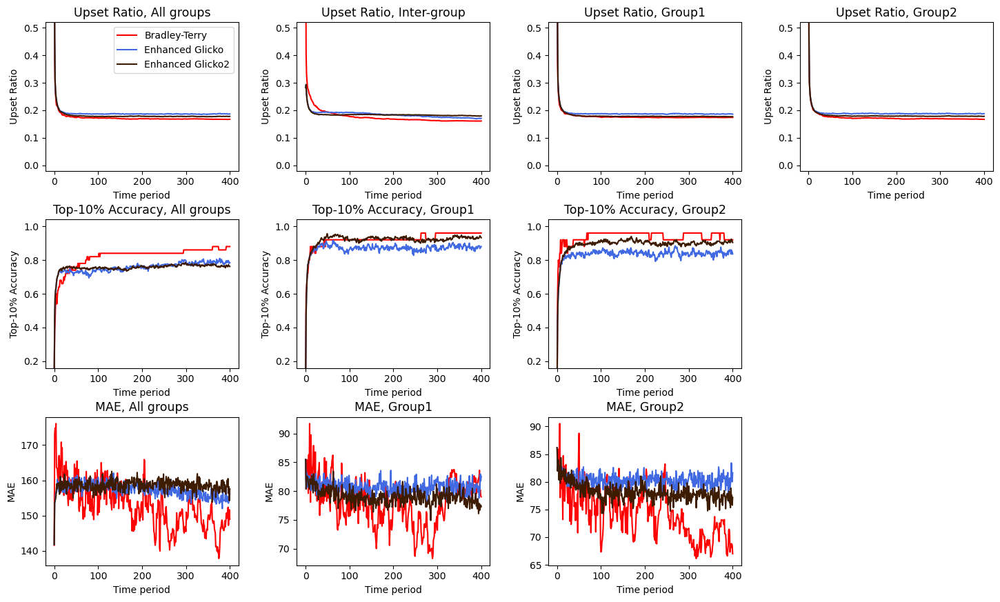

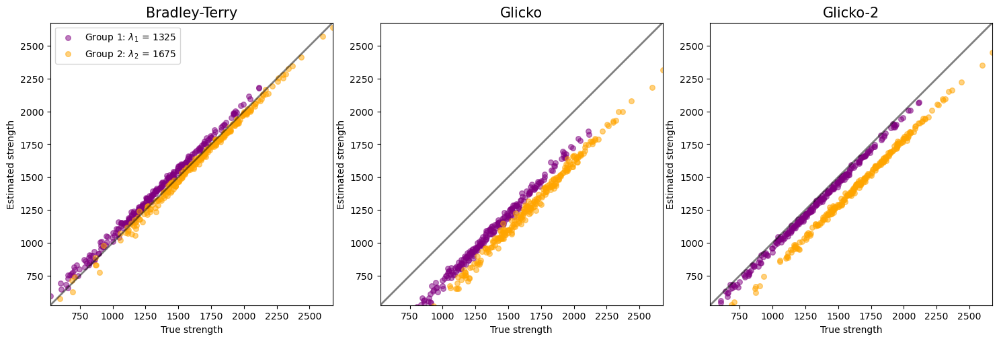

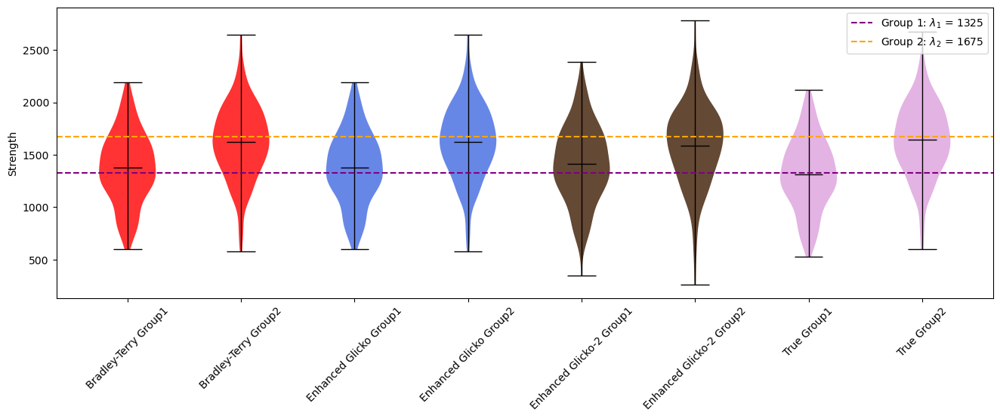

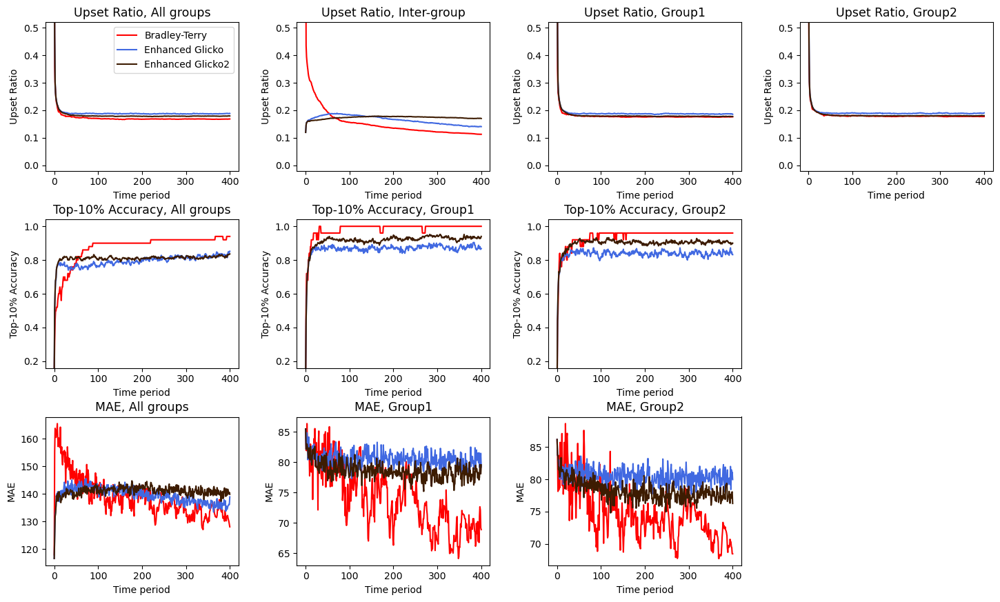

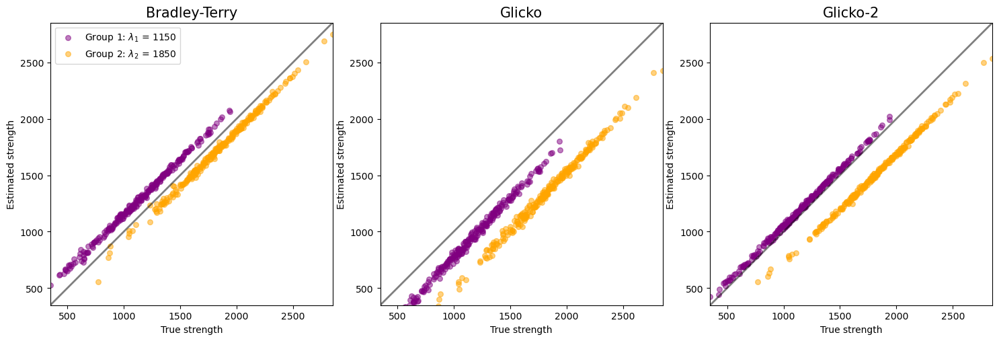

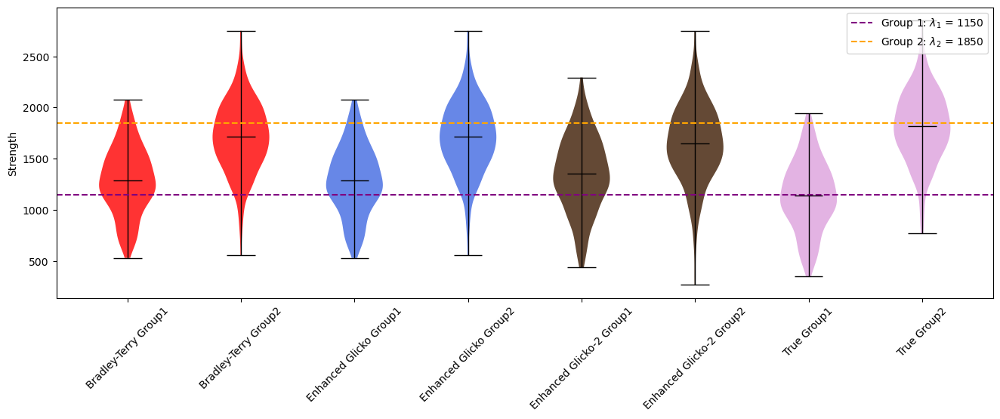

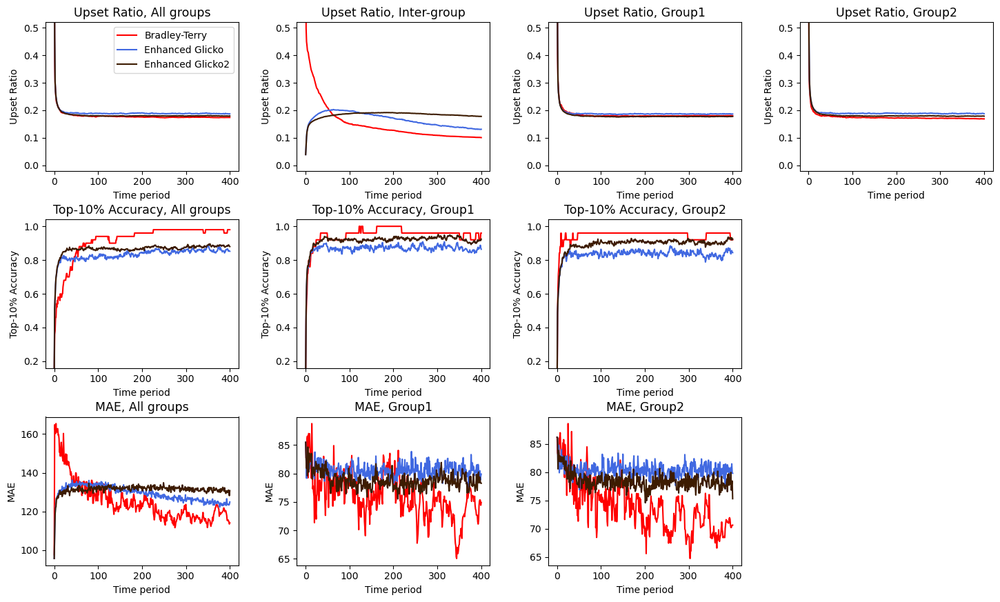

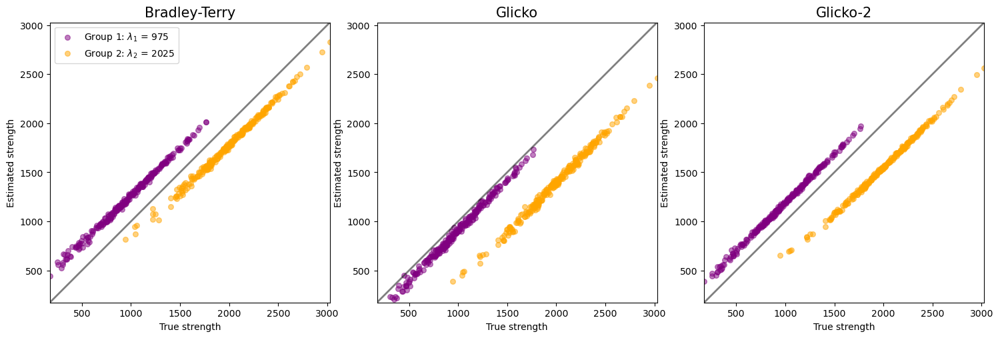

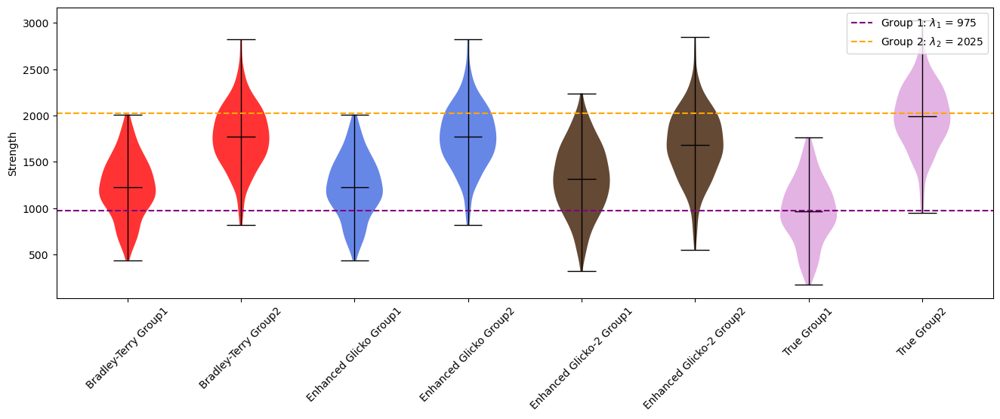

In [91]:
player_true_df_m1 = create_groups(mu_list_m1, phi_list, N_list_m)[1]
group2_plot_c(metric_matrix_m1, metric_matrix_m1c, player_mu_m1, player_mu_m1c, player_true_df_m1, mu_list_m1, t, 'm1c')

player_true_df_m2 = create_groups(mu_list_m2, phi_list, N_list_m)[1]
group2_plot_c(metric_matrix_m2, metric_matrix_m2c, player_mu_m2, player_mu_m2c, player_true_df_m2, mu_list_m2, t, 'm2c')

player_true_df_m3 = create_groups(mu_list_m3, phi_list, N_list_m)[1]
group2_plot_c(metric_matrix_m3, metric_matrix_m3c, player_mu_m3, player_mu_m3c, player_true_df_m3, mu_list_m3, t, 'm3c')

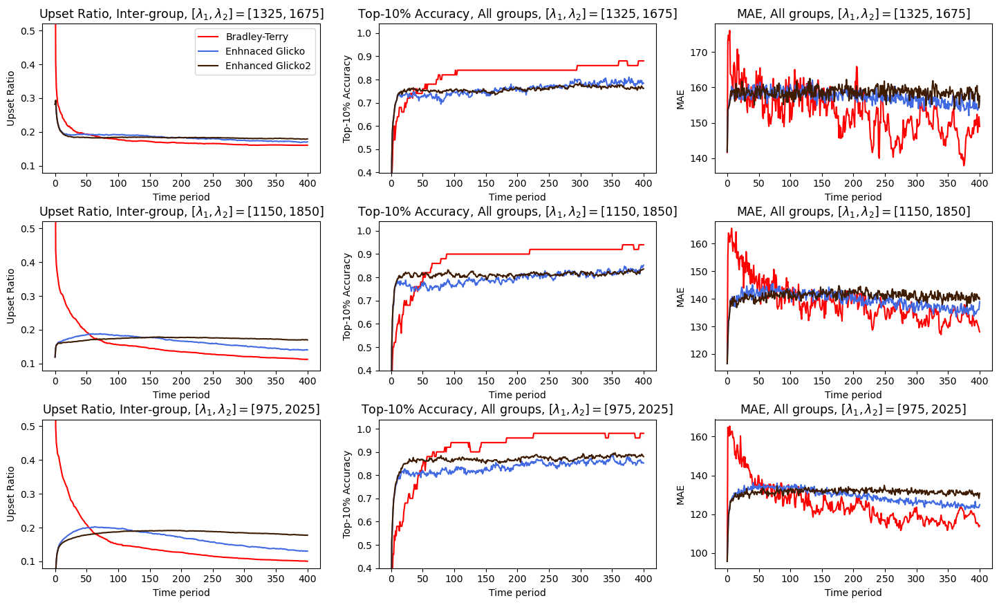

In [92]:
global_t = 50
t = 400

metric_matrix_avg_m1c = np.mean(metric_matrix_m1c, axis=0)
metric_matrix_avg_m2c = np.mean(metric_matrix_m2c, axis=0)
metric_matrix_avg_m3c = np.mean(metric_matrix_m3c, axis=0)

metric_matrix_avg_m1 = np.mean(metric_matrix_m1, axis=0)
metric_matrix_avg_m2 = np.mean(metric_matrix_m2, axis=0)
metric_matrix_avg_m3 = np.mean(metric_matrix_m3, axis=0)


metric_list = [metric_matrix_avg_m1, metric_matrix_avg_m2, metric_matrix_avg_m3]
# Metrics plot
fig, axs = plt.subplots(3, 3, figsize=(15, 9))
fig.tight_layout(pad=3)

X = range(t+1)
label1 = ["Inter-group", "All groups", "All groups"]
m_1 = [1325, 1150, 975, 1500]
m_2 = [1675, 1850, 2025, 1500]

for i, metric_matrix in enumerate([metric_matrix_avg_m1c, metric_matrix_avg_m2c, metric_matrix_avg_m3c]):
    for j, k in enumerate([1, 0, 0]):
        axs[i, j].plot(X, metric_list[i][k, :, 0, j], label='Bradley-Terry', color=colors[0])
        axs[i, j].plot(X, metric_matrix[k, :, 0, j], label='Enhnaced Glicko', color=colors[1])
        axs[i, j].plot(X, metric_matrix[k, :, 1, j], label='Enhanced Glicko2', color=colors[2])
        axs[i, j].set_title(f'{metrics[j]}, {label1[j]}, $[\lambda_1, \lambda_2] = [{m_1[i]}, {m_2[i]}]$', fontsize=12.5)
        axs[i, j].set_xlabel('Time period')
        axs[i, j].set_ylabel(f'{metrics[j]}')
        if j == 0:
            axs[i, j].set_ylim([0.08, 0.52])
        if j == 1:
            axs[i, j].set_ylim([0.4, 1.04])

axs[0, 0].legend()
plt.savefig('../outputs/metrics_c.png', dpi=300, bbox_inches='tight')

In [ ]:
fig, axs = plt.subplots(1, 3, figsize=(15, 4))
fig.tight_layout(pad=3)
mean_list = [mean_diff_m1, mean_diff_m2, mean_diff_m3]
for i, matrix in enumerate([mean_diff_m1c, mean_diff_m2c, mean_diff_m3c]):
    axs[i].plot(abs(mean_list[i][0, :, 0]), label=f'{models[0]}', color=colors[0])
    axs[i].plot(matrix[0, :, 0], label=f'Enhanced Glicko', color=colors[1])
    axs[i].plot(matrix[0, :, 1], label=f'Enhanced Glicko-2', color=colors[2])
    axs[i].set_xlabel('Time period')
    axs[i].set_ylabel('Difference in mean strength')
    axs[i].set_title(f'$[\lambda_1, \lambda_2] = [{m_1[i]}, {m_2[i]}]$', fontsize=12.5)
    axs[i].set_ylim([0, 750])
axs[0].legend()

plt.savefig('../outputs/mean_diff_c.png', dpi=300, bbox_inches='tight')


# Real Data Analysis

In [109]:
matches_M = pd.read_csv('../data/cleaned/matches_M.csv')
matches_F = pd.read_csv('../data/cleaned/matches_F.csv')

In [110]:
def unique_players(df):
    return pd.unique(pd.concat([df['Player1'], df['Player2']]))

def assign_group(df):
    df_melt = pd.melt(df, id_vars='Prov', value_vars=['Player1', 'Player2'], value_name='PlayerID')
    df_counts = df_melt.groupby(['PlayerID', 'Prov']).size().unstack(fill_value=0)
    df_counts["Group"] = df_counts.idxmax(axis=1)
    df_result = df_counts.reset_index()[['PlayerID', 'Group']]
    
    players = pd.unique(df_result['PlayerID'])
    # mapping = {player: i for i, player in enumerate(players)}
    # df_result['PlayerID'] = df_result['PlayerID'].map(mapping)
    return df_result

def map_ID(df):
    df_ID = df.copy()
    players = pd.unique(pd.concat([df['Player1'], df['Player2']]))
    # arrange players in alphabetical order
    players = np.sort(players)
    mapping = {player: i for i, player in enumerate(players)}
    df_ID['Winner'] = df_ID.apply(lambda x:1 if x['Winner'] == x['Player1'] else 0, axis=1)
    df_ID['Player1'] = df_ID['Player1'].map(mapping)
    df_ID['Player2'] = df_ID['Player2'].map(mapping)
    return df_ID

In [111]:
def select_set(n, matches, t=60):
    freq1 = matches['Player1'].value_counts()
    freq2 = matches['Player2'].value_counts()
    matches_n = matches[matches['Player1'].isin(freq1[freq1 > n].index) & matches['Player2'].isin(freq2[freq2 > n].index)]

    players_n = matches_n.groupby('Prov').apply(unique_players).apply(set)
    groups = np.sort(matches['Prov'].unique())
    players_n_1 = players_n[groups[0]]
    players_n_2 = players_n[groups[1]]

    print('Number of players in Group 1: {}'.format(len(players_n_1)))
    print('Number of players in Group 2: {}'.format(len(players_n_2)))
    print('Number of players in both group: {}'.format(len(players_n_1.intersection(players_n_2))))

    matches_n = map_ID(matches_n)
    players_n = assign_group(matches_n)
    players_n_1 = set(players_n[players_n['Group'] == groups[0]]['PlayerID'])
    players_n_2 = set(players_n[players_n['Group'] == groups[1]]['PlayerID'])
    
    
    matches_intra_1 = matches_n[(matches_n['Player1'].isin(players_n_1)) & (matches_n['Player2'].isin(players_n_1))]
    matches_intra_2 = matches_n[(matches_n['Player1'].isin(players_n_2)) & (matches_n['Player2'].isin(players_n_2))]
    matches_inter = matches_n[(matches_n['Player1'].isin(players_n_1)) & (matches_n['Player2'].isin(players_n_2)) | 
                              (matches_n['Player1'].isin(players_n_2)) & (matches_n['Player2'].isin(players_n_1))]

    matches_intra = pd.concat([matches_intra_1, matches_intra_2])
    matches_intra = matches_intra.sort_index()[["Player1", "Player2", "Winner"]]
    matches_inter = matches_inter.sort_index()[["Player1", "Player2", "Winner"]]
    
    print('Number of intra matches in Group 1: {}'.format(len(matches_intra_1)))
    print('Number of intra matches in Group 2: {}'.format(len(matches_intra_2)))
    print('Number of inter matches: {}'.format(len(matches_inter)))
    
    N = len(players_n)
    player_initial_df = create_players(1500, 350, N)[0]
    player_initial_df['group'] = players_n['Group']

    train_intra_1 = matches_intra_1.sample(frac=0.8).sort_index()
    train_intra_2 = matches_intra_2.sample(frac=0.8).sort_index()
    train_inter = matches_inter.sample(frac=0.8).sort_index()

    test_intra_1 = matches_intra_1.drop(train_intra_1.index)
    test_intra_2 = matches_intra_2.drop(train_intra_2.index)
    test_inter = matches_inter.drop(train_inter.index)

    train = pd.concat([train_intra_1, train_intra_2, train_inter]).sort_index()
    train = [tuple(x) for x in train[["Player1", "Player2", "Winner"]].values]

    test_intra_1 = [tuple(x) for x in test_intra_1[["Player1", "Player2", "Winner"]].to_numpy()]
    test_intra_2 = [tuple(x) for x in test_intra_2[["Player1", "Player2", "Winner"]].to_numpy()]
    test_inter = [tuple(x) for x in test_inter[["Player1", "Player2", "Winner"]].to_numpy()]

    test = [test_intra_1, test_intra_2, test_inter]

    print('Number of training matches: {}'.format(len(train)))
    print('Number of test matches: {}'.format(len(test_intra_1) + len(test_intra_2) + len(test_inter)))

    L = int(len(train) / (t-1))
    train_list = [train[i:i+L] for i in range(0, len(train), L)]

    return player_initial_df, train_list, test

In [112]:
def all_metrics_group_r(player_initial_df, train_list, test):
    """ Computes all three metrics for a group of players """
    player_bt_df = player_initial_df.copy()
    player_g_df = player_initial_df.copy()
    player_g2_df = player_initial_df.copy()
    N = len(player_initial_df)

    test_all = test[0] + test[1] + test[2]
    test_1 = test[0]
    test_2 = test[1]
    test_inter = test[2]
   
    t = len(train_list)
    metric_matrix = np.zeros((4, t+1, 3))
    mean_diff = np.zeros((t+1, 3))

    metric_matrix[0, 0, 0] = upset_ratio(player_bt_df, test_all)
    metric_matrix[0, 0, 1] = upset_ratio(player_g_df, test_all)
    metric_matrix[0, 0, 2] = upset_ratio(player_g2_df, test_all)

    metric_matrix[1, 0, 0] = upset_ratio(player_bt_df, test_inter)
    metric_matrix[1, 0, 1] = upset_ratio(player_g_df, test_inter)
    metric_matrix[1, 0, 2] = upset_ratio(player_g2_df, test_inter)
    
    group1, group2 = np.sort(player_initial_df['group'].unique())
    
    player_bt_df_1 = player_bt_df[player_bt_df['group'] == group1]
    player_bt_df_2 = player_bt_df[player_bt_df['group'] == group2]
    
    player_g_df_1 = player_g_df[player_g_df['group'] == group1]
    player_g_df_2 = player_g_df[player_g_df['group'] == group2]

    player_g2_df_1 = player_g2_df[player_g2_df['group'] == group1]
    player_g2_df_2 = player_g2_df[player_g2_df['group'] == group2]

    metric_matrix[2, 0, 0] = upset_ratio(player_bt_df_1, test_1)
    metric_matrix[2, 0, 1] = upset_ratio(player_g_df_1, test_1)
    metric_matrix[2, 0, 2] = upset_ratio(player_g2_df_1, test_1)

    metric_matrix[3, 0, 0] = upset_ratio(player_bt_df_2, test_2)
    metric_matrix[3, 0, 1] = upset_ratio(player_g_df_2, test_2)
    metric_matrix[3, 0, 2] = upset_ratio(player_g2_df_2, test_2)

    matches_bt = []
    for i, matches in enumerate(train_list):
        matches_bt += matches
        player_bt_df = Bradley_Terry(player_bt_df, matches_bt)
        player_g_df = Glicko(player_g_df, matches)
        player_g2_df = Glicko2(player_g2_df, matches)

        metric_matrix[0, i+1, 0] = upset_ratio(player_bt_df, test_all)
        metric_matrix[0, i+1, 1] = upset_ratio(player_g_df, test_all)
        metric_matrix[0, i+1, 2] = upset_ratio(player_g2_df, test_all)

        metric_matrix[1, i+1, 0] = upset_ratio(player_bt_df, test_inter)
        metric_matrix[1, i+1, 1] = upset_ratio(player_g_df, test_inter)
        metric_matrix[1, i+1, 2] = upset_ratio(player_g2_df, test_inter)

        player_bt_df_1 = player_bt_df[player_bt_df['group'] == group1]
        player_bt_df_2 = player_bt_df[player_bt_df['group'] == group2]

        player_g_df_1 = player_g_df[player_g_df['group'] == group1]
        player_g_df_2 = player_g_df[player_g_df['group'] == group2]

        player_g2_df_1 = player_g2_df[player_g2_df['group'] == group1]
        player_g2_df_2 = player_g2_df[player_g2_df['group'] == group2]

        metric_matrix[2, i+1, 0] = upset_ratio(player_bt_df_1, test_1)
        metric_matrix[2, i+1, 1] = upset_ratio(player_g_df_1, test_1)
        metric_matrix[2, i+1, 2] = upset_ratio(player_g2_df_1, test_1)

        metric_matrix[3, i+1, 0] = upset_ratio(player_bt_df_2, test_2)
        metric_matrix[3, i+1, 1] = upset_ratio(player_g_df_2, test_2)
        metric_matrix[3, i+1, 2] = upset_ratio(player_g2_df_2, test_2)

        mean_diff[i, 0] = abs(player_bt_df[player_bt_df['group'] == group1]['mu'].mean() - player_bt_df[player_bt_df['group'] == group2]['mu'].mean())
        mean_diff[i, 1] = abs(player_g_df[player_g_df['group'] == group1]['mu'].mean() - player_g_df[player_g_df['group'] == group2]['mu'].mean())
        mean_diff[i, 2] = abs(player_g2_df[player_g2_df['group'] == group1]['mu'].mean() - player_g2_df[player_g2_df['group'] == group2]['mu'].mean())

    return metric_matrix, mean_diff, np.array([player_bt_df['mu'].values, player_g_df['mu'].values, player_g2_df['mu'].values])

In [113]:
def all_metrics_group_rc(player_initial_df, train_list, test, global_t, V):
    """ Computes all three metrics for a group of players """
    player_bt_df = player_initial_df.copy()
    player_g_df = player_initial_df.copy()
    player_g2_df = player_initial_df.copy()
    N = len(player_initial_df)

    test_all = test[0] + test[1] + test[2]
    test_1 = test[0]
    test_2 = test[1]
    test_inter = test[2]
   
    t = len(train_list)
    metric_matrix = np.zeros((4, t+1, 2))

    global_matches = train_list[0:global_t]
    global_matches = [match for matches in global_matches for match in matches]
    
    for i in range(V):
        player_bt_df = Bradley_Terry(player_bt_df, global_matches)

    group1, group2 = np.sort(player_initial_df['group'].unique())

    mean_list = player_bt_df.groupby('group').mean()['mu'].to_numpy()
    print(mean_list)

    player_g_df.loc[player_g_df['group'] == group1, 'mu'] = mean_list[0]
    player_g_df.loc[player_g_df['group'] == group2, 'mu'] = mean_list[1]

    player_g2_df.loc[player_g2_df['group'] == group1, 'mu'] = mean_list[0]
    player_g2_df.loc[player_g2_df['group'] == group2, 'mu'] = mean_list[1]

    metric_matrix[0, 0, 0] = upset_ratio(player_g_df, test_all)
    metric_matrix[0, 0, 1] = upset_ratio(player_g2_df, test_all)

    metric_matrix[1, 0, 0] = upset_ratio(player_g_df, test_inter)
    metric_matrix[1, 0, 1] = upset_ratio(player_g2_df, test_inter)
    
    player_g_df_1 = player_g_df[player_g_df['group'] == group1]
    player_g_df_2 = player_g_df[player_g_df['group'] == group2]

    player_g2_df_1 = player_g2_df[player_g2_df['group'] == group1]
    player_g2_df_2 = player_g2_df[player_g2_df['group'] == group2]

    metric_matrix[2, 0, 0] = upset_ratio(player_g_df_1, test_1)
    metric_matrix[2, 0, 1] = upset_ratio(player_g2_df_1, test_1)

    metric_matrix[3, 0, 0] = upset_ratio(player_g_df_2, test_2)
    metric_matrix[3, 0, 1] = upset_ratio(player_g2_df_2, test_2)
    
    mean_diff = np.zeros((len(train_list)+1, 2))
    for i, matches in enumerate(train_list):
        player_g_df = Glicko(player_g_df, matches)
        player_g2_df = Glicko2(player_g2_df, matches)

        metric_matrix[0, i+1, 0] = upset_ratio(player_g_df, test_all)
        metric_matrix[0, i+1, 1] = upset_ratio(player_g2_df, test_all)

        metric_matrix[1, i+1, 0] = upset_ratio(player_g_df, test_inter)
        metric_matrix[1, i+1, 1] = upset_ratio(player_g2_df, test_inter)

        player_g_df_1 = player_g_df[player_g_df['group'] == group1]
        player_g_df_2 = player_g_df[player_g_df['group'] == group2]

        player_g2_df_1 = player_g2_df[player_g2_df['group'] == group1]
        player_g2_df_2 = player_g2_df[player_g2_df['group'] == group2]

        metric_matrix[2, i+1, 0] = upset_ratio(player_g_df_1, test_1)
        metric_matrix[2, i+1, 1] = upset_ratio(player_g2_df_1, test_1)

        metric_matrix[3, i+1, 0] = upset_ratio(player_g_df_2, test_2)
        metric_matrix[3, i+1, 1] = upset_ratio(player_g2_df_2, test_2)

        mean_diff[i, 0] = abs(player_g_df[player_g_df['group'] == group1]['mu'].mean() - player_g_df[player_g_df['group'] == group2]['mu'].mean())
        mean_diff[i, 1] = abs(player_g2_df[player_g2_df['group'] == group1]['mu'].mean() - player_g2_df[player_g2_df['group'] == group2]['mu'].mean())

    return metric_matrix, mean_diff, np.array([player_g_df['mu'].values, player_g2_df['mu'].values])

In [138]:
def group2_plot_r(metric_matrix, player_mu, player_initial_df, t, name, t_start=0):
    # Metrics plot
    fig, axs = plt.subplots(1, 4, figsize=(15, 3))
    fig.tight_layout(pad=3)

    X = range(t_start, t+1)
    label = ["All Group", "Inter-Group", "Group1", "Group2"]

    for i in range(4):
        axs[i].plot(X, metric_matrix[i, t_start:, 0], label='Bradley-Terry', color=colors[0])
        axs[i].plot(X, metric_matrix[i, t_start:, 1], label='Glicko', color=colors[1])
        axs[i].plot(X, metric_matrix[i, t_start:, 2], label='Glicko-2', color=colors[2])
        axs[i].set_title(label[i], fontsize=12.5)
        axs[i].set_xlabel('Time Period')
        axs[i].set_ylabel('Upset Ratio')
        axs[i].set_ylim(0.2, 0.6)

    axs[0].legend()
    plt.savefig('../outputs/metrics_' + name + '.png', dpi=300, bbox_inches='tight')
    
    groups = np.sort(player_initial_df['group'].unique())
    group1 = player_initial_df['group'] == groups[0]
    group2 = player_initial_df['group'] == groups[1]

    # Violin plot
    plt.figure(figsize=(15, 4))
    # add padding
    plt.tight_layout(pad=2.0)
    
    for i, mu in enumerate(player_mu):
        mean = np.mean(mu)
        mu -= mean
        mu += 1500
        player_mu[i] = mu

    data = [player_mu[i][group] for i in range(3) for group in [group1, group2]]
    violin = plt.violinplot(data, showextrema=True, showmedians=True, showmeans=False)
    colors_2 = ['red', 'red', 'royalblue', 'royalblue', '#3D1C02', '#3D1C02']
    for vp, color in zip(violin['bodies'], colors_2):
        vp.set_facecolor(color)
        vp.set_alpha(0.8)
    for partname in ('cbars','cmins','cmaxes','cmedians'):
        vp = violin[partname]
        vp.set_edgecolor('black') 
        vp.set_linewidth(1)
    print(player_mu[0][group1].mean())
    print(player_mu[0][group2].mean())
    print(player_mu[0][group1].mean() - player_mu[0][group2].mean())
    
    plt.ylabel('Strength')

    plt.xticks([1, 2, 3, 4, 5, 6], ['Bradley-Terry Group1', 'Bradley-Terry Group2', 'Glicko Group1', 'Glicko Group2', 'Glicko-2 Group1', 'Glicko-2 Group2'], fontsize=10)
    plt.savefig('../outputs/box_' + name + '.png', dpi=300, bbox_inches='tight')
    

In [147]:
def group2_plot_rc(metric_matrix, metric_matrix_new, player_mu, player_mu_new, player_initial_df, t, name, t_start=0):
    # Metrics plot
    fig, axs = plt.subplots(1, 4, figsize=(15, 3))
    fig.tight_layout(pad=3)

    X = range(t_start, t+1)
    label = ["All Group", "Inter-Group", "Group1", "Group2"]

    for i in range(4):
        axs[i].plot(X, metric_matrix[i, t_start:, 0], label='Bradley-Terry', color=colors[0])
        axs[i].plot(X, metric_matrix_new[i, t_start:, 0], label='Enhanced Glicko', color=colors[1])
        axs[i].plot(X, metric_matrix_new[i, t_start:, 1], label='Enhanced Glicko-2', color=colors[2])
        axs[i].set_title(label[i], fontsize=12.5)
        axs[i].set_xlabel('Time Period')
        axs[i].set_ylabel('Upset Ratio')
        axs[i].set_ylim(0.2, 0.6)

    axs[0].legend()
    plt.savefig('../outputs/metrics_' + name + '.png', dpi=300, bbox_inches='tight')
    
    groups = np.sort(player_initial_df['group'].unique())
    group1 = player_initial_df['group'] == groups[0]
    group2 = player_initial_df['group'] == groups[1]

    for i, mu in enumerate(player_mu):
        mean = np.mean(mu)
        mu -= mean
        mu += 1500
        player_mu[i] = mu

    for i, mu in enumerate(player_mu_new):
        mean = np.mean(mu)
        mu -= mean
        mu += 1500
        player_mu_new[i] = mu

    # Violin plot
    plt.figure(figsize=(15, 4))
    # add padding
    plt.tight_layout(pad=2.0)

    data = [player_mu[0][group1], player_mu[0][group2]] + [player_mu_new[i][group] for i in range(2) for group in [group1, group2]]
    violin = plt.violinplot(data, showextrema=True, showmedians=True, showmeans=False)
    colors_2 = ['red', 'red', 'royalblue', 'royalblue', '#3D1C02', '#3D1C02']
    for vp, color in zip(violin['bodies'], colors_2):
        vp.set_facecolor(color)
        vp.set_alpha(0.8)
    for partname in ('cbars','cmins','cmaxes','cmedians'):
        vp = violin[partname]
        vp.set_edgecolor('black') 
        vp.set_linewidth(1)
    
    plt.ylabel('Strength')

    plt.xticks([1, 2, 3, 4, 5, 6], ['Bradley-Terry Group1', 'Bradley-Terry Group2', 'Enahnced Glicko Group1', 'Enhanced Glicko Group2', 'Enhanced Glicko-2 Group1', 'Enhanced Glicko-2 Group2'], fontsize=10)
    plt.savefig('../outputs/box_' + name + '.png', dpi=300, bbox_inches='tight')
    

### ITF & LTA

In [116]:
matches_M1 = matches_M[matches_M['Prov'].isin(['ITF', 'LTA'])]
matches_F1 = matches_F[matches_F['Prov'].isin(['ITF', 'LTA'])]

matches_M1 = matches_M1[matches_M1['Code'].isin(['U18', 'OPEN'])]
matches_F1 = matches_F1[matches_F1['Code'].isin(['U18', 'OPEN'])]

In [117]:
player_initial_df_r1m, train_list_r1m, test_r1m = select_set(60, matches_M1, 60)
# metric_matrix_r1m, player_mu_r1m = all_metrics_group_r(player_initial_df_r1m, train_list_r1m, test_r1m)

Number of players in Group 1: 1967
Number of players in Group 2: 2411
Number of players in both group: 325
Number of intra matches in Group 1: 83103
Number of intra matches in Group 2: 109310
Number of inter matches: 5973
Number of training matches: 158708
Number of test matches: 39678


In [118]:
player_initial_df_r1f, train_list_r1f, test_r1f = select_set(60, matches_F1, 60)
# metric_matrix_r1f, mean_diff_r1f, player_mu_r1f = all_metrics_group_r(player_initial_df_r1f, train_list_r1f, test_r1f)

Number of players in Group 1: 1636
Number of players in Group 2: 817
Number of players in both group: 233
Number of intra matches in Group 1: 67260
Number of intra matches in Group 2: 44058
Number of inter matches: 3765
Number of training matches: 92066
Number of test matches: 23017


### LTA & USA

In [119]:
matches_M2 = matches_M[matches_M['Prov'].isin(['USA', 'LTA'])]
matches_F2 = matches_F[matches_F['Prov'].isin(['USA', 'LTA'])]

matches_M2 = matches_M2[matches_M2['Code'].isin(['U14', 'U16', 'U18'])]
matches_F2 = matches_F2[matches_F2['Code'].isin(['U14', 'U16', 'U18'])]

In [120]:
player_initial_df_r2m, train_list_r2m, test_r2m = select_set(60, matches_M2, 60)
# metric_matrix_r2m, player_mu_r2m = all_metrics_group_r(player_initial_df_r2m, train_list_r2m, test_r2m)

Number of players in Group 1: 2356
Number of players in Group 2: 7996
Number of players in both group: 58
Number of intra matches in Group 1: 192292
Number of intra matches in Group 2: 661680
Number of inter matches: 705
Number of training matches: 683742
Number of test matches: 170935


In [121]:
player_initial_df_r2f, train_list_r2f, test_r2f = select_set(60, matches_F2, 60)
# metric_matrix_r2f, player_mu_r2f = all_metrics_group_r(player_initial_df_r2f, train_list_r2f, test_r2f)

Number of players in Group 1: 1182
Number of players in Group 2: 6180
Number of players in both group: 23
Number of intra matches in Group 1: 98128
Number of intra matches in Group 2: 522538
Number of inter matches: 181
Number of training matches: 496677
Number of test matches: 124170


### ITF & USA

In [122]:
matches_M3 = matches_M[matches_M['Prov'].isin(['USA', 'ITF'])]
matches_F3 = matches_F[matches_F['Prov'].isin(['USA', 'ITF'])]

matches_M3 = matches_M3[matches_M3['Code'].isin(['U18', 'U16'])]
matches_F3 = matches_F3[matches_F3['Code'].isin(['U18', 'U16'])]

In [123]:
player_initial_df_r3m, train_list_r3m, test_r3m = select_set(60, matches_M3, 60)
# metric_matrix_r3m, player_mu_r3m = all_metrics_group_r(player_initial_df_r3m, train_list_r3m, test_r3m)

Number of players in Group 1: 2160
Number of players in Group 2: 3531
Number of players in both group: 679
Number of intra matches in Group 1: 82753
Number of intra matches in Group 2: 182765
Number of inter matches: 6303
Number of training matches: 217456
Number of test matches: 54365


In [124]:
player_initial_df_r3f, train_list_r3f, test_r3f = select_set(60, matches_F3, 60)
# metric_matrix_r3f, player_mu_r3f = all_metrics_group_r(player_initial_df_r3f, train_list_r3f, test_r3f)

Number of players in Group 1: 1925
Number of players in Group 2: 2913
Number of players in both group: 730
Number of intra matches in Group 1: 67504
Number of intra matches in Group 2: 159197
Number of inter matches: 8170
Number of training matches: 187897
Number of test matches: 46974


In [125]:
# np.save('outputs/metric_matrix_r1m.npy', metric_matrix_r1m)
# np.save('outputs/player_mu_r1m.npy', player_mu_r1m)

# np.save('outputs/metric_matrix_r1f.npy', metric_matrix_r1f)
# np.save('outputs/mean_diff_r1f.npy', mean_diff_r1f)
# np.save('outputs/player_mu_r1f.npy', player_mu_r1f)

# np.save('outputs/metric_matrix_r2m.npy', metric_matrix_r2m)
# np.save('outputs/player_mu_r2m.npy', player_mu_r2m)

# np.save('outputs/metric_matrix_r2f.npy', metric_matrix_r2f)
# np.save('outputs/player_mu_r2f.npy', player_mu_r2f)

# np.save('outputs/metric_matrix_r3m.npy', metric_matrix_r3m)
# np.save('outputs/player_mu_r3m.npy', player_mu_r3m)

# np.save('outputs/metric_matrix_r3f.npy', metric_matrix_r3f)
# np.save('outputs/player_mu_r3f.npy', player_mu_r3f)

In [151]:
metric_matrix_r1m = np.load('outputs/metric_matrix_r1m.npy')
player_mu_r1m = np.load('outputs/player_mu_r1m.npy', allow_pickle=True)

metric_matrix_r1f = np.load('outputs/metric_matrix_r1f.npy')
mean_diff_r1f = np.load('outputs/mean_diff_r1f.npy', allow_pickle=True)
player_mu_r1f = np.load('outputs/player_mu_r1f.npy', allow_pickle=True)

metric_matrix_r3m = np.load('outputs/metric_matrix_r3m.npy')
player_mu_r3m = np.load('outputs/player_mu_r3m.npy', allow_pickle=True)

metric_matrix_r3f = np.load('outputs/metric_matrix_r3f.npy')
player_mu_r3f = np.load('outputs/player_mu_r3f.npy', allow_pickle=True)


1551.6395301565253
1462.7291581410636
88.91037201546169
1613.451199623145
1291.788794561354
321.6624050617909
1570.196251727586
1464.257193113114
105.93905861447206
1579.4792278701698
1457.8774892889192
121.60173858125063


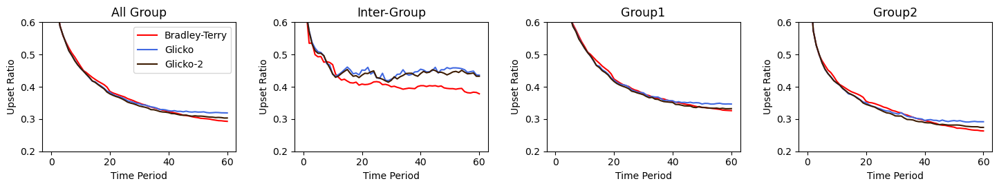

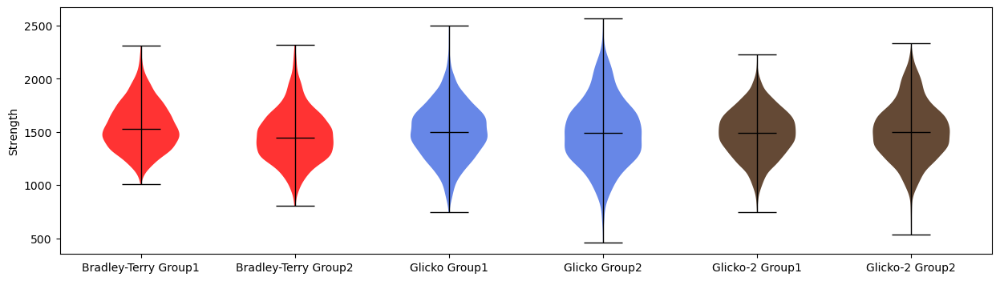

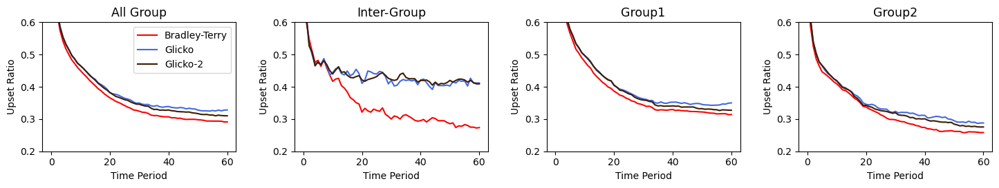

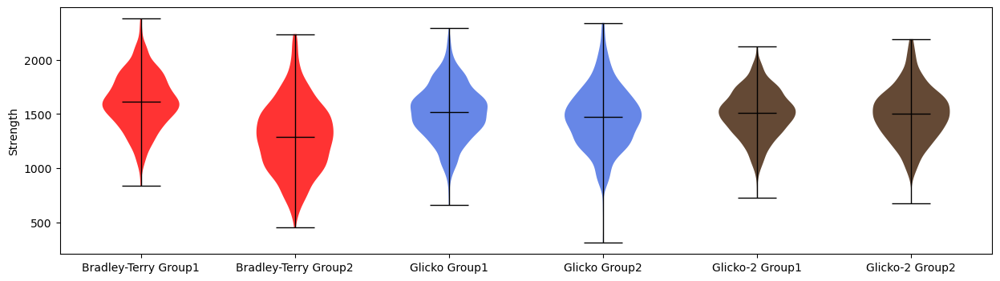

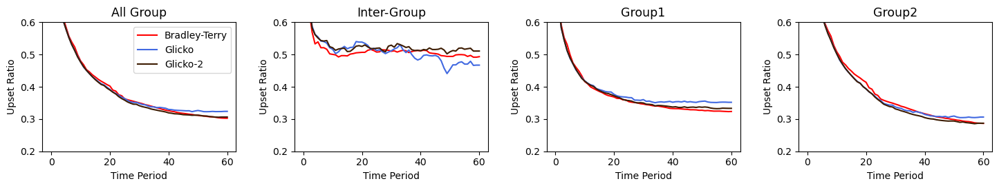

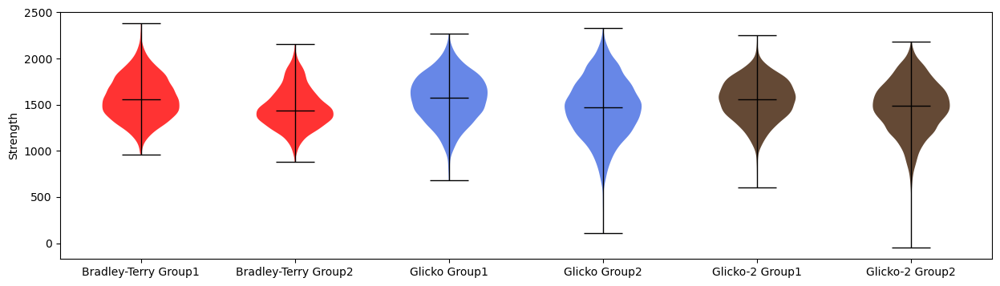

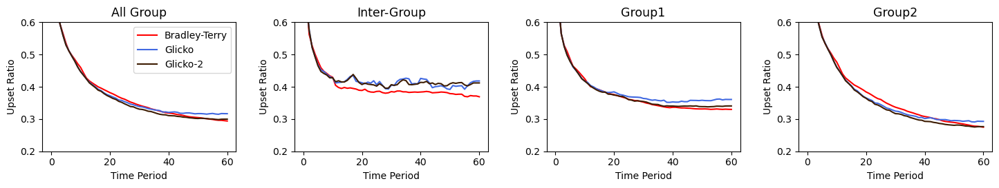

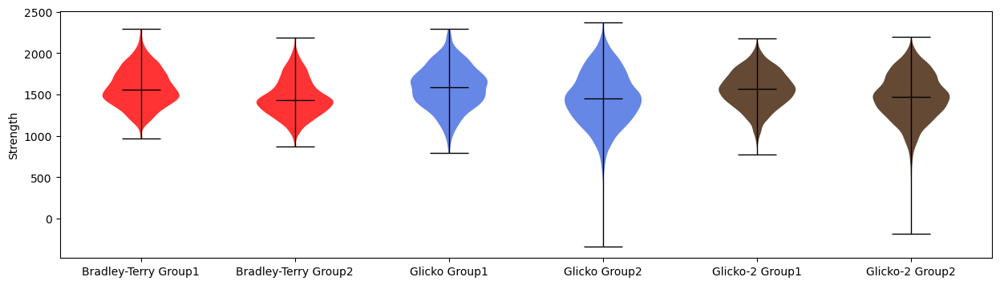

In [139]:
group2_plot_r(metric_matrix_r1m, player_mu_r1m, player_initial_df_r1m, 60, 'r1m')
group2_plot_r(metric_matrix_r1f, player_mu_r1f, player_initial_df_r1f, 60, 'r1f')
group2_plot_r(metric_matrix_r3m, player_mu_r3m, player_initial_df_r3m, 60, 'r3m')
group2_plot_r(metric_matrix_r3f, player_mu_r3f, player_initial_df_r3f, 60, 'r3f')

## Enhanced Model

In [140]:
matches_M1 = matches_M[matches_M['Prov'].isin(['ITF', 'LTA'])]
matches_F1 = matches_F[matches_F['Prov'].isin(['ITF', 'LTA'])]

matches_M1 = matches_M1[matches_M1['Code'].isin(['U18', 'OPEN'])]
matches_F1 = matches_F1[matches_F1['Code'].isin(['U18', 'OPEN'])]

In [ ]:
metric_matrix_r1fc1, mean_diff_r1fc1, player_mu_r1fc1 = all_metrics_group_rc(player_initial_df_r1f, train_list_r1f, test_r1f, 10, 10)
metric_matrix_r1fc2, mean_diff_r1fc2, player_mu_r1fc2 = all_metrics_group_rc(player_initial_df_r1f, train_list_r1f, test_r1f, 20, 20)
metric_matrix_r1fc3, mean_diff_r1fc3, player_mu_r1fc3 = all_metrics_group_rc(player_initial_df_r1f, train_list_r1f, test_r1f, 30, 30)

In [ ]:
np.save('outputs/metric_matrix_r1fc1.npy', metric_matrix_r1fc1)
np.save('outputs/mean_diff_r1fc1.npy', mean_diff_r1fc1)
np.save('outputs/player_mu_r1fc1.npy', player_mu_r1fc1)

np.save('outputs/metric_matrix_r1fc2.npy', metric_matrix_r1fc2)
np.save('outputs/mean_diff_r1fc2.npy', mean_diff_r1fc2)
np.save('outputs/player_mu_r1fc2.npy', player_mu_r1fc2)

np.save('outputs/metric_matrix_r1fc3.npy', metric_matrix_r1fc3)
np.save('outputs/mean_diff_r1fc3.npy', mean_diff_r1fc3)
np.save('outputs/player_mu_r1fc3.npy', player_mu_r1fc3)

In [150]:
metric_matrix_r1fc1 = np.load('outputs/metric_matrix_r1fc1.npy')
mean_diff_r1fc1 = np.load('outputs/mean_diff_r1fc1.npy', allow_pickle=True)
player_mu_r1fc1 = np.load('outputs/player_mu_r1fc1.npy', allow_pickle=True)

metric_matrix_r1fc2 = np.load('outputs/metric_matrix_r1fc2.npy')
mean_diff_r1fc2 = np.load('outputs/mean_diff_r1fc2.npy', allow_pickle=True)
player_mu_r1fc2 = np.load('outputs/player_mu_r1fc2.npy', allow_pickle=True)

metric_matrix_r1fc3 = np.load('outputs/metric_matrix_r1fc3.npy')
mean_diff_r1fc3 = np.load('outputs/mean_diff_r1fc3.npy', allow_pickle=True)
player_mu_r1fc3 = np.load('outputs/player_mu_r1fc3.npy', allow_pickle=True)


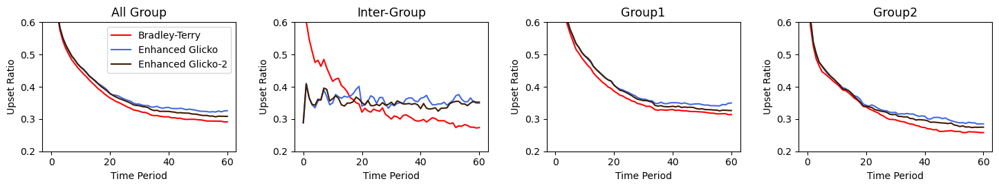

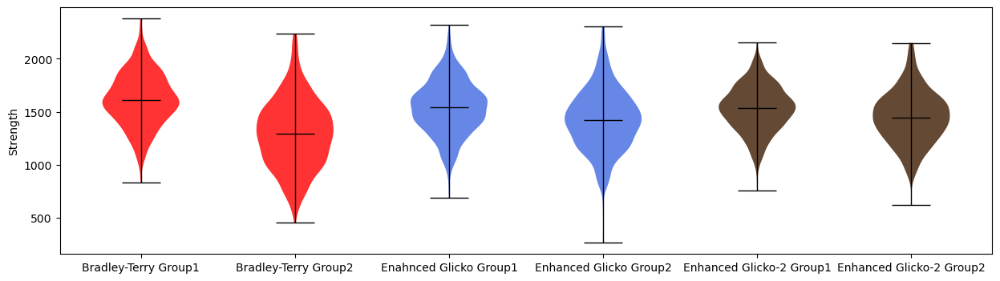

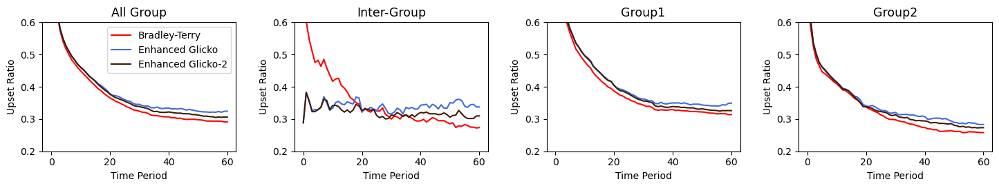

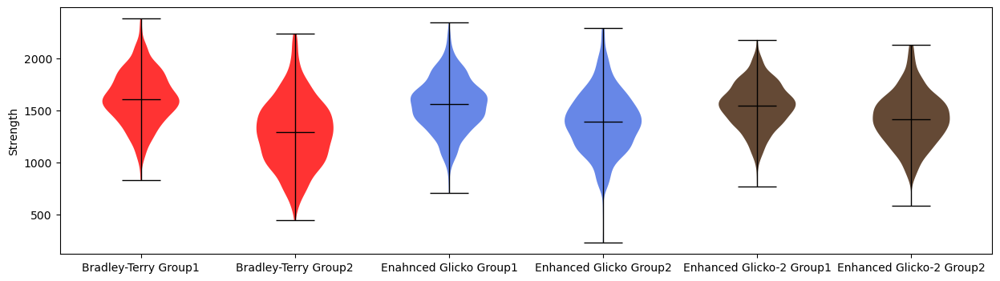

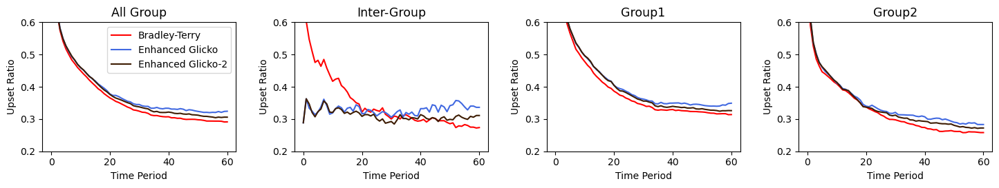

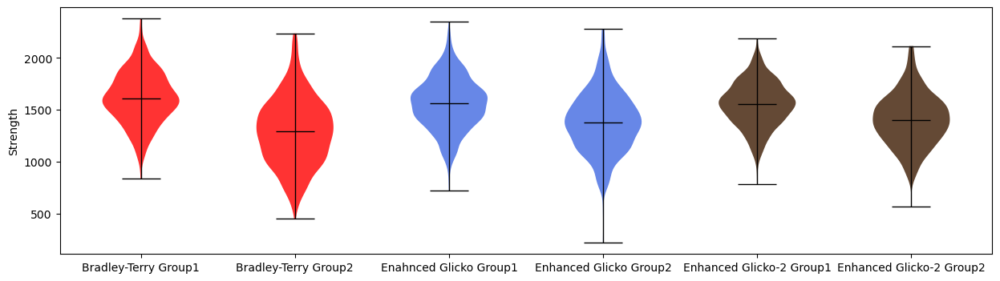

In [152]:
group2_plot_rc(metric_matrix_r1f, metric_matrix_r1fc1, player_mu_r1f, player_mu_r1fc1, player_initial_df_r1f, 60, 'r1fc1')
group2_plot_rc(metric_matrix_r1f, metric_matrix_r1fc2, player_mu_r1f, player_mu_r1fc2, player_initial_df_r1f, 60, 'r1fc2')
group2_plot_rc(metric_matrix_r1f, metric_matrix_r1fc3, player_mu_r1f, player_mu_r1fc3, player_initial_df_r1f, 60, 'r1fc3')

In [ ]:
fig, axs = plt.subplots(1, 3, figsize=(15, 4))
fig.tight_layout(pad=3)
mean_list = [mean_diff_r1fc1, mean_diff_r1fc2, mean_diff_r1fc3]
for i, matrix in enumerate([mean_diff_m1c, mean_diff_m2c, mean_diff_m3c]):
    axs[i].plot(abs(mean_list[i][0, :, 0]), label=f'{models[0]}', color=colors[0])
    axs[i].plot(matrix[0, :, 0], label=f'Enhanced Glicko', color=colors[1])
    axs[i].plot(matrix[0, :, 1], label=f'Enhanced Glicko-2', color=colors[2])
    axs[i].set_xlabel('Time period')
    axs[i].set_ylabel('Difference in mean strength')
    axs[i].set_title(f'$[\lambda_1, \lambda_2] = [{m_1[i]}, {m_2[i]}]$', fontsize=12.5)
    axs[i].set_ylim([0, 750])
axs[0].legend()

plt.savefig('../outputs/mean_diff_rc.png', dpi=300, bbox_inches='tight')


In [ ]:
plt.figure(figsize=(15, 8))

plt.plot(abs(mean_diff_r1f[:, 0][:-1]), label=f'{models[0]}', color=colors[0])
plt.plot(mean_diff_r1fc3[:, 0][:-1], label=f'Enhanced Glicko', color=colors[1])
plt.plot(mean_diff_r1fc3[:, 1][:-1], label=f'Enhanced Glicko-2', color=colors[2])
plt.xlabel('Time period')
plt.ylabel('Difference in mean strength')

plt.savefig('../outputs/mean_diff_rc.png', dpi=300, bbox_inches='tight')